# Alpha and beta diversity

In [21]:
# Packages
library("labdsv")
library("coin")
library("vegan")
library("yaml")
library("ggpubr")
library("cowplot")
library("tidyverse")
library("dplyr")
library("ggplot2")
library("data.table")
library("readODS")

In [2]:
setwd("/mnt/raid1/armen/Schinos/META-ANALYSIS/ALL/Fungi/")
getwd()

[1] "/mnt/raid1/armen/Schinos/META-ANALYSIS/ALL/Fungi"

In [3]:
meta = read.table(file             = 'RNA_metadata_ALL.tab', 
                               header           = TRUE, 
                               sep              = "\t", 
                  
                               stringsAsFactors = FALSE)
meta[1:5, ]

data = read.table(file             = 'species_nozero.tab',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)

data_norm = read.table(file             = 'Species_CSS.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
data=t(data)
data[1:5, 1:5]
data_norm[1:5, 1:5]

,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5
Aaosphaeria.arxii,0.0000,0,0,0.00000,5.00000
Abiotrophia.defectiva,74.0119,0,2,45.01140,318.05900
Abyssalbus.ytuae,21.2371,0,0,0.00000,0.00000
Abyssicoccus.albus,0.0000,7,0,1.07248,7.00004
Abyssogena.phaseoliformis.symbiont,0.0000,0,0,0.00000,0.00000


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aaosphaeria.arxii,0.0000000,0.000000,0.0000000,0.00000000,0.04177378
Abiotrophia.defectiva,0.5303501,0.000000,0.2196362,0.29785429,2.65730515
Abyssalbus.ytuae,0.1521796,0.000000,0.0000000,0.00000000,0.00000000
Abyssicoccus.albus,0.0000000,1.430536,0.0000000,0.00709693,0.05848362
Abyssogena.phaseoliformis.symbiont,0.0000000,0.000000,0.0000000,0.00000000,0.00000000


In [5]:
dim(data)
dim(data_norm)

[1] 5176   54

[1] 5176   54

In [6]:
head(meta)

,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no
6,Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,619417,NA,,no


In [7]:
rownames(meta)=meta$External_ID
head(meta)
dim(meta)

,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
Metatranscriptome_Healthy1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
Metatranscriptome_Healthy2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
Metatranscriptome_Healthy3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
Metatranscriptome_Healthy4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
Metatranscriptome_Healthy5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no
Metatranscriptome_Healthy6,Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,619417,NA,,no


[1] 54  7

,Condition,Study,Richness,Alpha_diversity
,<chr>,<chr>,<dbl>,<dbl>
Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,1180,4.551112
Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,662,4.871887
Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,812,3.691086
Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,814,3.301533
Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,1031,2.670915
Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,778,3.281334


            Df Sum Sq Mean Sq F value   Pr(>F)    
Condition    1    174   174.2   1.030    0.315    
Study        3   4656  1551.9   9.176 6.34e-05 ***
Residuals   49   8287   169.1                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

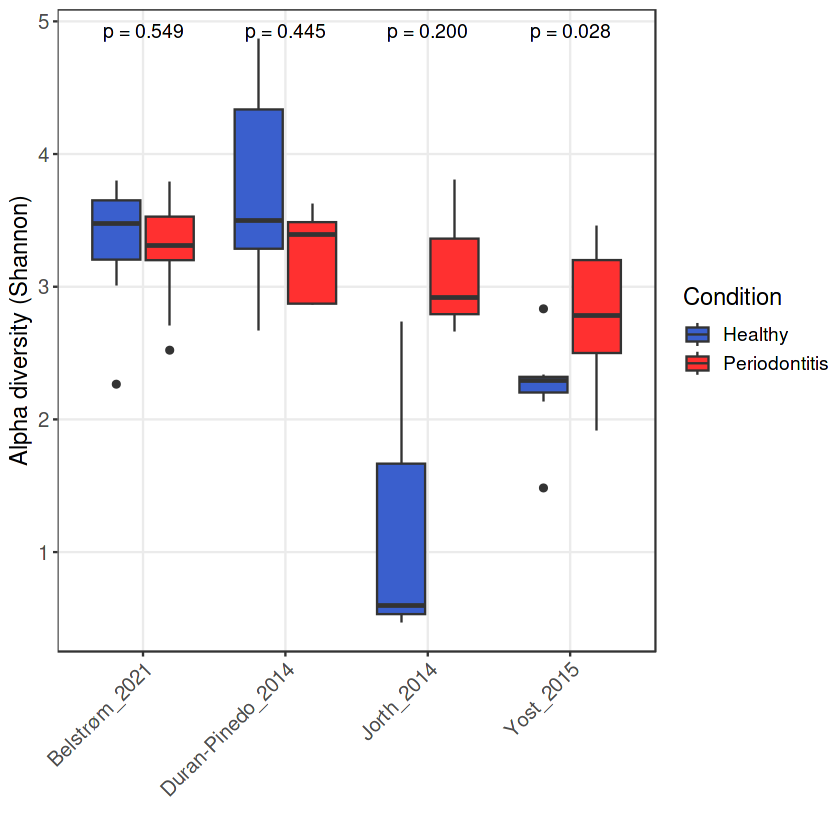

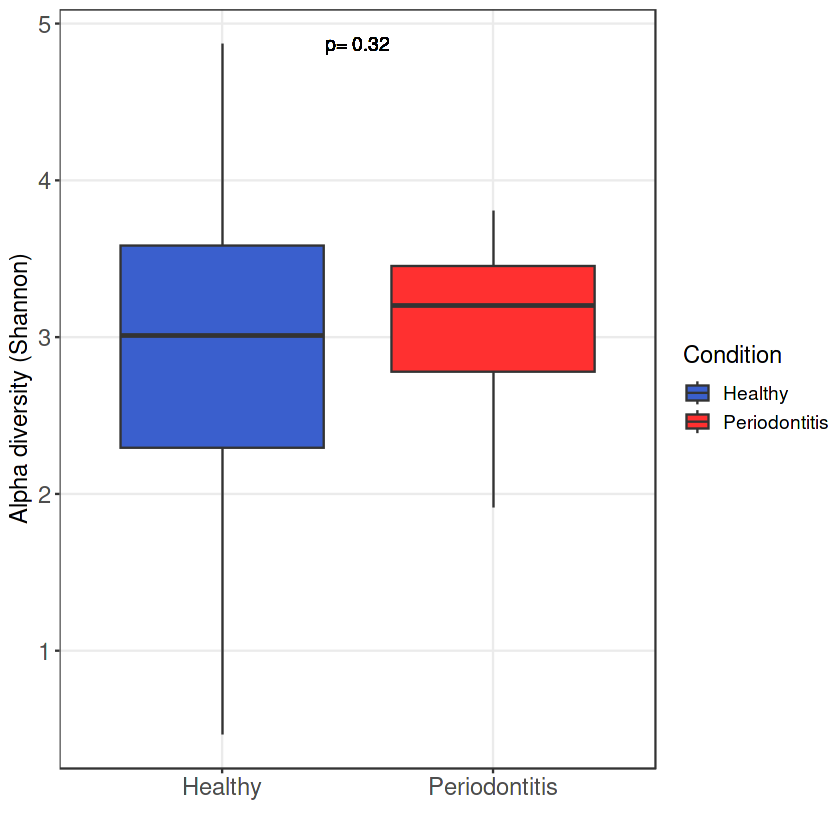

In [7]:
library(ggplot2)
library(ggsignif)
library(coin)
## Alpha diversity
# Non-normalized raw data

div <- meta %>% 
  ### Richness
  mutate("Richness" = colSums(data != 0)) %>%
  ### Shannon
  mutate('Alpha_diversity' = diversity(t(data))) %>%
  select(Condition, Study, 'Richness', 'Alpha_diversity')

head(div)

# Convert to tibble to be able to run blocked wilcoxon from coin package
div$Condition <- as.factor(div$Condition)
div$Study <- as.factor(div$Study)
div <- as_tibble(div)

blocked_pval <- pvalue(wilcox_test(Alpha_diversity ~ Condition | Study, data = div))

# Plot each study separately
g <- div %>% 
  ggplot(aes(x = Study, fill = Condition, y = Alpha_diversity)) +
  geom_boxplot() +
  theme_bw() +
  ylab('Alpha diversity (Shannon)') +
  xlab('') +
  theme(panel.grid.minor = element_blank(),
        strip.background = element_blank(),
        text = element_text(size = 14),
        axis.text = element_text(size = 12),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = c("royalblue3", "firebrick1")) +
  stat_compare_means(label = "p.format", method = "wilcox.test", size = 4)
  
#ggsave(filename = "alpha_diversity.png", plot = g, width = 8, height = 6)

print(g)

# Plot all samples together
g_all <- div %>% 
  ggplot(aes(x = Condition, y = Alpha_diversity, fill = Condition)) +
  geom_boxplot() +
  theme_bw() +
  ylab('Alpha diversity (Shannon)') +
  xlab('') +
  theme(panel.grid.minor = element_blank(),
        strip.background = element_blank(),
        text = element_text(size = 14),
        axis.text = element_text(size = 14)) +
  scale_fill_manual(values = c("royalblue3", "firebrick1")) +
  geom_text(
    aes(label = paste('p=', round(blocked_pval, 2))),
    x = 1.5, y = max(div$Alpha_diversity),
    size = 4
  )

ggsave(filename = "alpha_diversity_ALL.png", plot = g_all, width = 8, height = 6)

print(g_all)


,Condition,Study,Richness,Alpha_diversity
,<chr>,<chr>,<dbl>,<dbl>
Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,1180,4.551112
Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,662,4.871887
Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,812,3.691086
Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,814,3.301533
Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,1031,2.670915
Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,778,3.281334


            Df Sum Sq Mean Sq F value   Pr(>F)    
Condition    1    174   174.2   1.030    0.315    
Study        3   4656  1551.9   9.176 6.34e-05 ***
Residuals   49   8287   169.1                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

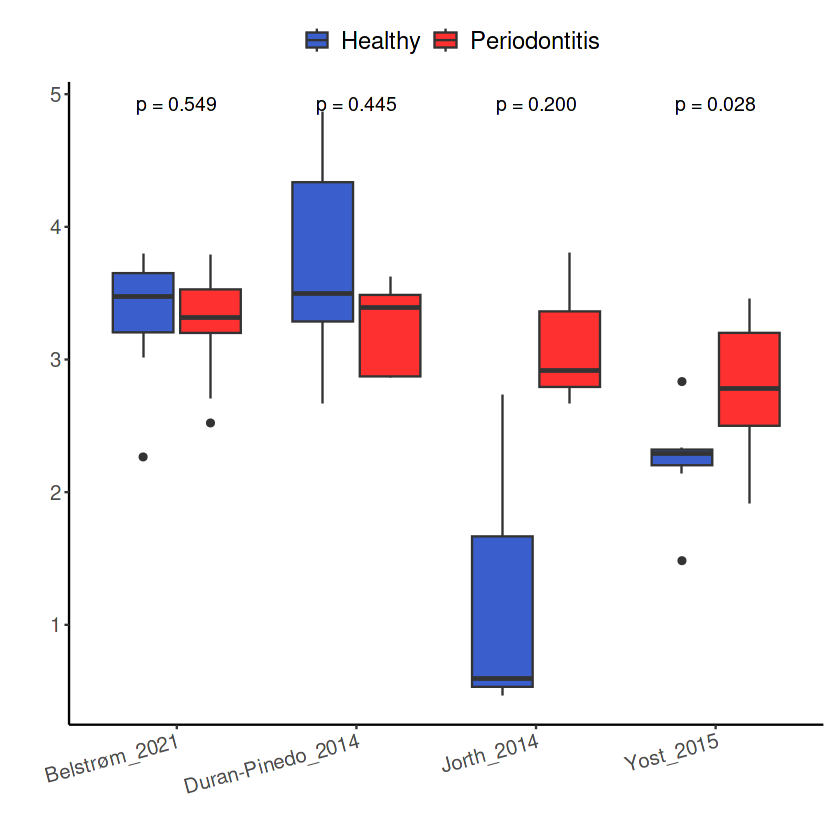

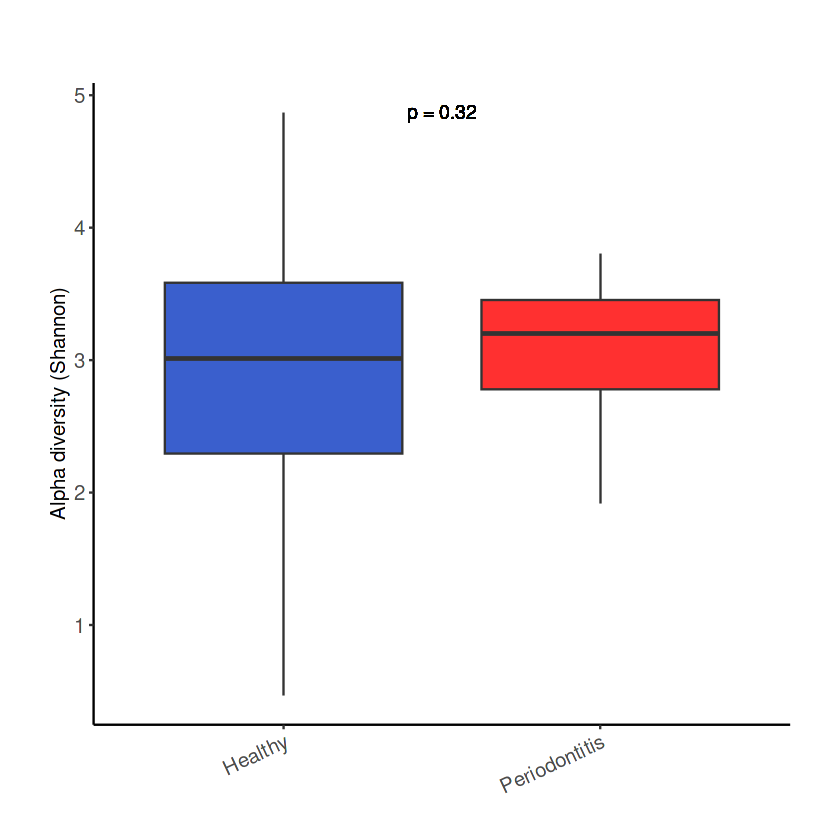

In [142]:
#Alpha diversity
#CSS normalized data 
div <- meta %>% 
### Richness
   mutate("Richness"=colSums(data_norm != 0)) %>%
  
### Shannon
  mutate('Alpha_diversity' = diversity(t(data_norm))) %>%
  select(Condition, Study, 'Richness', 'Alpha_diversity') 

head(div)

# convert to tibble to be able to run blocked wilcoxon
div$Condition=as.factor(div$Condition)
div$Study=as.factor(div$Study)
div=as_tibble(div)

blocked_pval=pvalue(wilcox_test(Alpha_diversity ~ Condition | Study, data=div))

# plot each study separately
g <- div %>% 
  ggplot(aes(x=Study, fill=Condition, y=Alpha_diversity)) +
    geom_boxplot() + 
    theme_classic() + 
    ylab(NULL) +
    xlab('') +
    theme(panel.grid.minor = element_blank(),
          strip.background = element_blank(),
          text = element_text(size = 12),
          axis.text = element_text(size = 12),
          axis.text.x = element_text(angle = 15, hjust = 1),
          legend.text = element_text(size = 14), 
         
    legend.position = "top",  # Place legend at the top
    legend.title = element_blank(),
    plot.margin = margin(10, 10, 10, 30)
  ) +
    scale_fill_manual(values = c("royalblue3", "firebrick1")) + 
    stat_compare_means(label = "p.format", method = "wilcox.test", size=4)


ggsave(g, filename = 'alpha_diversity_norm.pdf', width = 8, height = 6, useDingbats=FALSE)
ggsave(filename = "alpha_diversity_norm.png", plot = g, width = 8, height = 6)

print(g)

# plot All samples together
g_all <- div %>% 
  ggplot(aes(x = Condition, y = Alpha_diversity, fill = Condition)) +
  geom_boxplot() +
  theme_classic() + 
  ylab('Alpha diversity (Shannon)') +
  xlab('') +
  theme(
    panel.grid.minor = element_blank(),
    strip.background = element_blank(),
    text = element_text(size = 12),
    axis.text = element_text(size = 12),
    axis.text.x = element_text(angle = 25, hjust = 1),
    legend.position = "NULL",  # Place legend at the top
    legend.title = element_blank(),
    plot.margin = margin(50, 30, 10, 30)  
    ) + 
  scale_fill_manual(values = c("royalblue3", "firebrick1")) +  
  geom_text(aes(label = paste('p =', round(blocked_pval, 2))), 
            x = 1.5, y = max(div$Alpha_diversity), size = 4)


ggsave(g_all, filename = 'alpha_diversity_ALL_norm.pdf', width = 8, height = 6, useDingbats=FALSE) 
ggsave(filename = "alpha_diversity_ALL_norm.png", plot = g_all, width = 8, height = 6)


print(g_all)

In [118]:
#save table containing richness and alpha diversity(Shannon)
write.table(div, "Richness_AlphaDiversity.tsv", sep="\t", row.names = FALSE, col.names = TRUE)

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


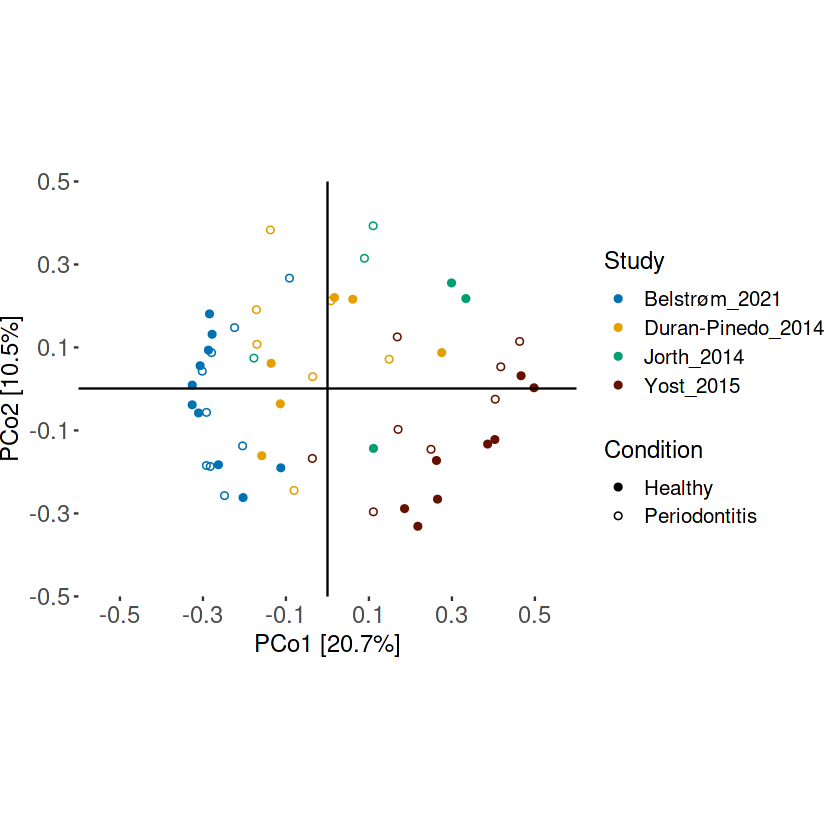

In [140]:
################### Beta Diversity ##############################################################################
# compute PCoA with CSS normalized data
dist = vegdist(t(data_norm), method = 'bray')
pco.results = pco(dist, k=2)

axis.1.title <- paste('PCo1 [', 
                      round((pco.results$eig[1]/sum(pco.results$eig))*100,1),
                      '%]', sep='')
axis.2.title <- paste('PCo2 [', 
                      round((pco.results$eig[2]/sum(pco.results$eig))*100,1),
                      '%]', sep='')

df.plot <- tibble(Axis1 = -1*pco.results$points[,1],
                  Axis2 = pco.results$points[,2],
                  Sample_ID = rownames(pco.results$points),
                  Condition=meta$Condition,
                  Study=meta$Study)

study.cols = c('Duran-Pinedo_2014'="#E69F00", 'Yost_2015'= "#661100",'Jorth_2014'="#009E73", 
               'Belstrøm_2021'="#0072B2",'Duran-Pinedo_2023'= "#CC79A7")

# Plot
g_beta <- df.plot %>% 
  ggplot(aes(x=Axis1, y=Axis2, shape=Condition, col=Study)) +
  geom_point() + 
  theme_classic()+   # Adjust plot margin)+
  scale_x_continuous(limits = c(-0.6, 0.6), expand = c(0, 0), breaks = seq(-0.5, 0.5, by = 0.2)) +
  scale_y_continuous(limits = c(-0.5, 0.5), expand = c(0, 0), breaks = seq(-0.5, 0.5, by = 0.2)) +
  coord_cartesian(clip = "off")+
  geom_vline(xintercept = 0) +
  geom_hline(yintercept = 0)+
  scale_colour_manual(values=study.cols) + 
  scale_shape_manual(values=c(19, 1)) + 
  xlab(axis.1.title) + ylab(axis.2.title) +
  labs(color = "Study", shape = "Condition") +
  theme(axis.title = element_text(size = 14),         # Increase title size
    axis.text = element_text(size = 14),          # Increase axis labels size
    legend.text = element_text(size = 12),        # Increase legend text size
    legend.title = element_text(size = 14),
    axis.line = element_line(color = "transparent"), 
    legend.position = "right"
       )+
  theme(plot.margin = margin(30, 0, 30, 0))+  # Adjust the plot margin here
  coord_fixed()


ggsave(g_beta, filename = 'beta_diversity_norm.png')    
print(g_beta)



TableGrob (1 x 3) "arrange": 3 grobs
  z     cells    name           grob
1 1 (1-1,1-1) arrange gtable[layout]
2 2 (1-1,2-2) arrange gtable[layout]
3 3 (1-1,3-3) arrange gtable[layout]

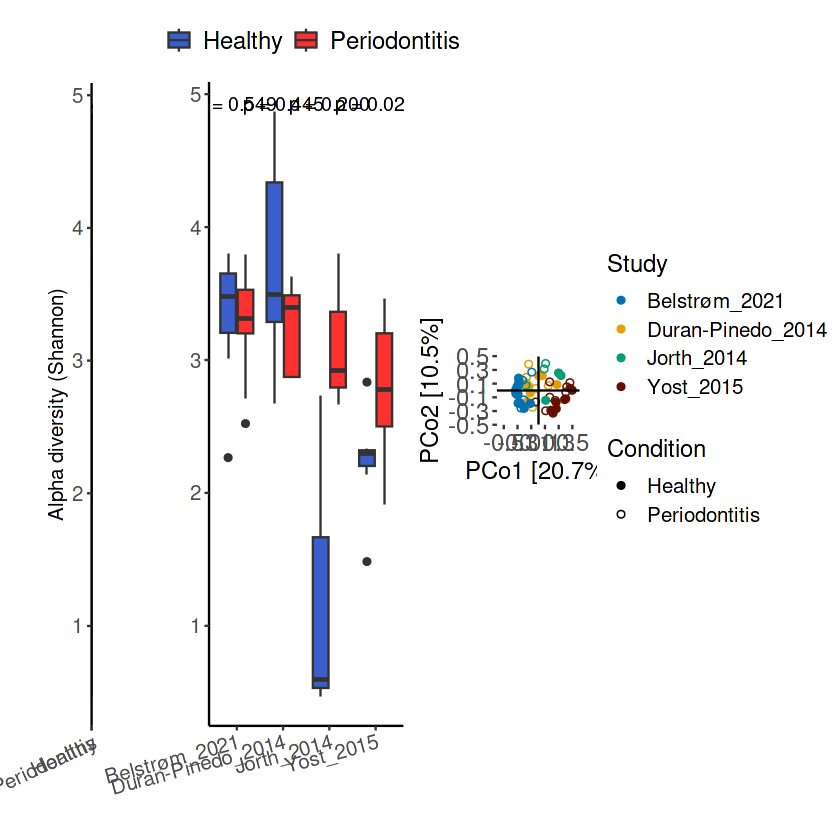

In [143]:
library(gridExtra)
library(cowplot)

# Convert plots to grobs
plot1 <- as_grob(g_all)
plot2 <- as_grob(g)
plot3 <- as_grob(g_beta)


# Combine plots using grid.arrange
combined_plots <- grid.arrange(
  plot1, plot2, plot3,
  ncol = 3,
  widths = c(1, 2, 3)  # Arrange plots in a single column
)

# Save the combined plot
ggsave("Figure_1.png", combined_plots, width = 20, height = 6)

# Display the combined plot
combined_plots


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


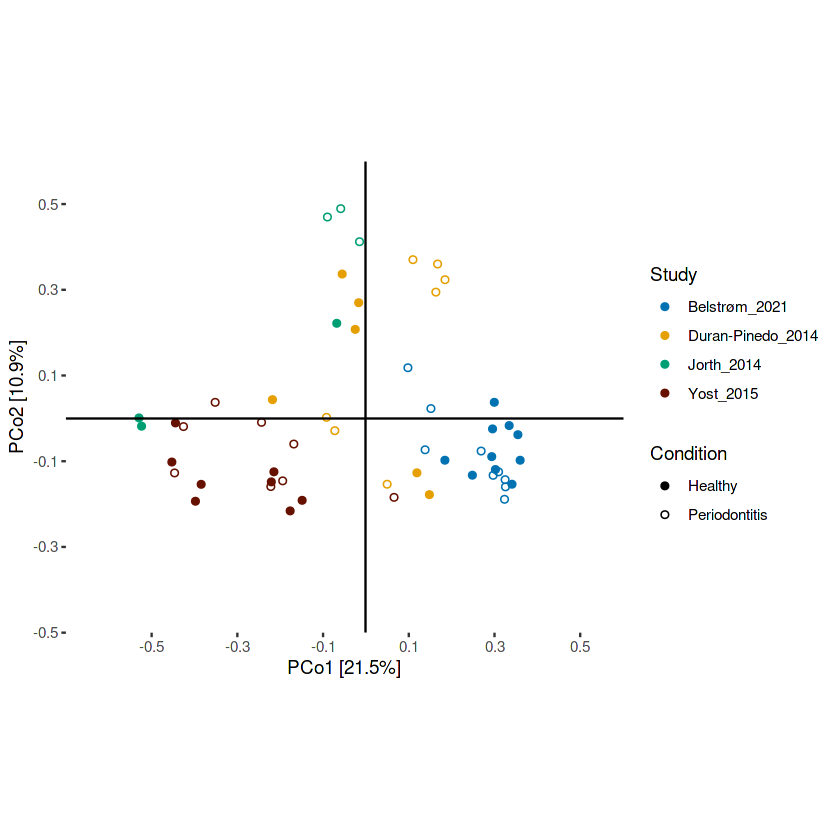

In [107]:
# compute PCoA with non-normalized data
dist = vegdist(t(data), method = 'bray')
pco.results = pco(dist, k=2)

axis.1.title <- paste('PCo1 [', 
                      round((pco.results$eig[1]/sum(pco.results$eig))*100,1),
                      '%]', sep='')
axis.2.title <- paste('PCo2 [', 
                      round((pco.results$eig[2]/sum(pco.results$eig))*100,1),
                      '%]', sep='')

df.plot <- tibble(Axis1 = -1*pco.results$points[,1],
                  Axis2 = pco.results$points[,2],
                  Sample_ID = rownames(pco.results$points),
                  Condition=meta$Condition,
                  Study=meta$Study)

study.cols = c('Duran-Pinedo_2014'="#E69F00", 'Yost_2015'= "#661100",'Jorth_2014'="#009E73", 
               'Belstrøm_2021'="#0072B2",'Duran-Pinedo_2023'= "#CC79A7")

# Plot
g <- df.plot %>% 
  ggplot(aes(x=Axis1, y=Axis2, shape=Condition, col=Study)) +
  geom_point() + 
  theme_classic()+
  scale_x_continuous(limits = c(-0.7, 0.6), expand = c(0, 0), breaks = seq(-0.5, 0.5, by = 0.2)) +
  scale_y_continuous(limits = c(-0.5, 0.6), expand = c(0, 0), breaks = seq(-0.5, 0.5, by = 0.2)) +
  coord_cartesian(clip = "off")+
  geom_vline(xintercept = 0) +
  geom_hline(yintercept = 0)+
  scale_colour_manual(values=study.cols) + 
  scale_shape_manual(values=c(19, 1)) + 
  xlab(axis.1.title) + ylab(axis.2.title) +
  labs(color = "Study", shape = "Condition") +
  theme(axis.line = element_line(color = "transparent"), legend.position = "right")+
  coord_fixed()

ggsave(g, filename = 'beta_diversity.png')    
print(g)

# Differential abundance analysis of species with Maaslin2, separately for each individual study

In [808]:
library(Maaslin2); packageVersion("Maaslin2") 

[1] ‘1.12.0’

In [68]:
data_Duran_Pinedo_2014 <- data[, 1:13]
head(data_Duran_Pinedo_2014)
data_Yost_2015 <- data[, 14:29]
head(data_Yost_2015)
data_Jorth_2014 <- data[, 30:35]
head(data_Jorth_2014)
data_Belstrom_2021 <- data[, 36:54]
head(data_Belstrom_2021)


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,Metatranscriptome_Periodontitis5,Metatranscriptome_Periodontitis6,Metatranscriptome_Periodontitis7
Aaosphaeria.arxii,0.0000000,0.000000,0.0000000,0.00000000,0.04177378,0.00000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000,0.00000000,0.000000
Abiotrophia.defectiva,0.5303501,0.000000,0.2196362,0.29785429,2.65730515,0.10031563,0.435659869,7.40975377,1.82015051,1.10182737,20.67582,0.04814164,0.150574
Abyssalbus.ytuae,0.1521796,0.000000,0.0000000,0.00000000,0.00000000,0.00000000,0.143786328,0.06843062,0.08538818,0.03032155,0.00000,0.00000000,0.000000
Abyssicoccus.albus,0.0000000,1.430536,0.0000000,0.00709693,0.05848362,0.02529636,0.004648966,0.00000000,0.01511028,0.00000000,0.00000,0.00000000,0.000000
Abyssogena.phaseoliformis.symbiont,0.0000000,0.000000,0.0000000,0.00000000,0.00000000,0.00000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000,0.00000000,0.000000
Acanthamoeba.polyphaga.mimivirus,0.0000000,0.000000,0.0000000,0.00000000,0.00000000,0.00000000,0.000000000,0.00000000,0.00000000,0.00000000,0.00000,0.00000000,0.000000


,RNA_12.1_S,RNA_12.2_P,RNA_13.1_S,RNA_15.1_S,RNA_15.2_P,RNA_21.1_S,RNA_21.2_P,RNA_22.1_S,RNA_22.3_P,RNA_26.2_P,RNA_28.1_S,RNA_28.3_P,RNA_8.1_S,RNA_8.2_P,RNA_9.1_S,RNA_9.2_P
Aaosphaeria.arxii,0.00000000,0.00000000,0.01409032,0.000000,0.00288196,0.01390512,0.06155589,0.00000000,0.0000000,0.00000,0.0000000,0.00000000,0.01208113,0.00000000,0.03157996,0.00000000
Abiotrophia.defectiva,0.01266202,0.05055698,0.56607860,1.564154,0.27254958,5.75850068,0.98884990,0.03856252,3.8272592,40.44259,0.4800207,0.69401774,3.60348216,0.03050454,0.11107856,0.03666287
Abyssalbus.ytuae,0.00000000,0.00000000,0.00000000,0.000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.00000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Abyssicoccus.albus,0.00000000,0.00000000,0.00000000,0.000000,0.00000000,0.00000000,0.00000000,0.00000000,0.3646078,0.00000,0.0000000,0.04866988,0.01624629,0.00000000,0.04992065,0.00000000
Abyssogena.phaseoliformis.symbiont,0.00000000,0.00000000,0.00000000,0.000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.00000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
Acanthamoeba.polyphaga.mimivirus,0.00000000,0.00000000,0.00000000,0.000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.00000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000


,SRR1045151,SRR1045152,SRR1045153,SRR1045154,SRR1045155,SRR1045157
Aaosphaeria.arxii,0.000000000,0.000000000,0.00000000,0.0000000,0.00000000,0.000000000
Abiotrophia.defectiva,0.024333191,0.070903284,1.92955131,0.1921879,0.32857504,24.311326703
Abyssalbus.ytuae,0.005922635,0.003170808,0.01059303,0.0000000,0.00000000,0.002520651
Abyssicoccus.albus,0.007316062,0.006391692,0.00000000,0.0000000,0.09520804,0.006234513
Abyssogena.phaseoliformis.symbiont,0.000000000,0.001948681,0.00000000,0.0000000,0.00000000,0.000000000
Acanthamoeba.polyphaga.mimivirus,0.000000000,0.001639671,0.00000000,0.0000000,0.00000000,0.000000000


,SRR13061493,SRR13061496,SRR13061499,SRR13061502,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
Aaosphaeria.arxii,0.000000,0.00000,0.00000,0.000000,0.0000000,0.0000000,0.05013576,0.0000000,0.00000000,0.00000000,0.1150615,0.000000,0.00000000,0.00000,0.000000,0.0000000,0.000000000,0.0000000,0.000000
Abiotrophia.defectiva,9.760447,52.44773,36.81877,0.595745,0.7714852,0.1999986,0.19626853,0.1158997,0.02737864,0.05164775,0.1450657,5.716451,0.02984225,11.24414,5.868241,0.3214209,0.080826009,0.1198729,1.139147
Abyssalbus.ytuae,0.000000,0.00000,0.00000,0.000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000,0.0000000,0.000000,0.00000000,0.00000,0.000000,0.0000000,0.003847886,0.0000000,0.000000
Abyssicoccus.albus,0.000000,0.00000,0.00000,0.000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000,0.0000000,0.000000,0.00000000,0.00000,0.000000,0.0000000,0.000000000,0.0000000,0.000000
Abyssogena.phaseoliformis.symbiont,0.000000,0.00000,0.00000,0.000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000,0.0000000,0.000000,0.00000000,0.00000,0.000000,0.0000000,0.000000000,0.0000000,0.000000
Acanthamoeba.polyphaga.mimivirus,0.000000,0.00000,0.00000,0.000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000,0.0000000,0.000000,0.00000000,0.00000,0.000000,0.0000000,0.000000000,0.0000000,0.000000


In [782]:
#Maaslin with CSS normalization and NEGBIN model

#Run this code for all the 4 studies separtely
Maaslin2(
    data_Yost_2015,
    meta,
    output = "./Maaslin2/species_NEGBIN_CSS_minprev_50_Yost_2015",
    min_abundance = 0.0,
    min_prevalence = 0.50,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 24,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100
    )

[1] "Warning: Deleting existing log file: ./Maaslin2/T/maaslin2.log"
2023-11-01 03:37:07 INFO::Writing function arguments to log file
2023-11-01 03:37:07 INFO::Verifying options selected are valid
2023-11-01 03:37:07 INFO::Determining format of input files
2023-11-01 03:37:07 INFO::Input format is data samples as columns and metadata samples as rows
2023-11-01 03:37:07 INFO::Formula for fixed effects: expr ~  Condition
2023-11-01 03:37:07 INFO::Filter data based on min abundance and min prevalence
2023-11-01 03:37:07 INFO::Total samples in data: 16
2023-11-01 03:37:07 INFO::Min samples required with min abundance for a feature not to be filtered: 8.000000
2023-11-01 03:37:07 INFO::Total filtered features: 4515
2023-11-01 03:37:07 INFO::Filtered feature names from abundance and prevalence filtering: Aaosphaeria.arxii, Abyssalbus.ytuae, Abyssicoccus.albus, Abyssogena.phaseoliformis.symbiont, Acanthamoeba.polyphaga.mimivirus, Acaromyces.ingoldii, Acaryochloris.marina, Acetilactobacillus.j

Default value being used.



2023-11-01 03:37:07 INFO::Applying z-score to standardize continuous metadata
2023-11-01 03:37:07 INFO::Running selected transform method: NONE
2023-11-01 03:37:07 INFO::Running selected analysis method: NEGBIN
2023-11-01 03:37:07 INFO::Creating cluster of 24 R processes
2023-11-01 03:37:24 INFO::Counting total values for each feature
2023-11-01 03:37:24 WARNING::Deleting existing residuals file: ./Maaslin2/T/residuals.rds
2023-11-01 03:37:24 INFO::Writing residuals to file ./Maaslin2/T/residuals.rds
2023-11-01 03:37:24 WARNING::Deleting existing fitted file: ./Maaslin2/T/fitted.rds
2023-11-01 03:37:24 INFO::Writing fitted values to file ./Maaslin2/T/fitted.rds
2023-11-01 03:37:24 INFO::Writing all results to file (ordered by increasing q-values): ./Maaslin2/T/all_results.tsv
2023-11-01 03:37:24 INFO::Writing the significant results (those which are less than or equal to the threshold of 0.250000 ) to file (ordered by increasing q-values): ./Maaslin2/T/significant_results.tsv
2023-11-0

Warning message in xtfrm.data.frame(x):
“cannot xtfrm data frames”


[1] "There is not enough metadata in the associations to create a heatmap plot. Please review the associations in text output file."
2023-11-01 03:37:24 INFO::Writing association plots (one for each significant association) to output folder: ./Maaslin2/T
2023-11-01 03:37:24 INFO::Plotting associations from most to least significant, grouped by metadata
2023-11-01 03:37:24 INFO::Plotting data for metadata number 1, Condition
2023-11-01 03:37:24 INFO::Creating boxplot for categorical data, Condition vs Ralstonia.wenshanensis
2023-11-01 03:37:24 INFO::Creating boxplot for categorical data, Condition vs Alkalimarinus.sediminis
2023-11-01 03:37:24 INFO::Creating boxplot for categorical data, Condition vs Rahnella.victoriana
2023-11-01 03:37:25 INFO::Creating boxplot for categorical data, Condition vs Streptococcus.pasteurianus
2023-11-01 03:37:25 INFO::Creating boxplot for categorical data, Condition vs Prevotella.fusca
2023-11-01 03:37:25 INFO::Creating boxplot for categorical data, Condit

2023-11-01 03:37:31 INFO::Creating boxplot for categorical data, Condition vs Peptoniphilus.harei
2023-11-01 03:37:31 INFO::Creating boxplot for categorical data, Condition vs Pseudomonas.sessilinigenes
2023-11-01 03:37:31 INFO::Creating boxplot for categorical data, Condition vs Thermus.thermophilus
2023-11-01 03:37:31 INFO::Creating boxplot for categorical data, Condition vs Capnocytophaga.sputigena
2023-11-01 03:37:32 INFO::Creating boxplot for categorical data, Condition vs Ideonella.dechloratans
2023-11-01 03:37:32 INFO::Creating boxplot for categorical data, Condition vs Aggregatibacter.actinomycetemcomitans
2023-11-01 03:37:32 INFO::Creating boxplot for categorical data, Condition vs Ottowia.testudinis
2023-11-01 03:37:32 INFO::Creating boxplot for categorical data, Condition vs Capnocytophaga.ochracea
2023-11-01 03:37:32 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.kroppenstedtii
2023-11-01 03:37:33 INFO::Creating boxplot for categorical data, Condi

2023-11-01 03:37:38 INFO::Creating boxplot for categorical data, Condition vs Leuconostoc.mesenteroides
2023-11-01 03:37:38 INFO::Creating boxplot for categorical data, Condition vs Ottowia.oryzae
2023-11-01 03:37:38 INFO::Creating boxplot for categorical data, Condition vs Nocardioides.rotundus
2023-11-01 03:37:38 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.ureicelerivorans
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Changpingibacter.yushuensis
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Delftia.lacustris
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Scardovia.inopinata
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Rothia.dentocariosa
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Bacteroides.heparinolyticus
2023-11-01 03:37:39 INFO::Creating boxplot for categorical data, Condition vs Pseudomona

2023-11-01 03:37:45 INFO::Creating boxplot for categorical data, Condition vs Brevibacterium.casei
2023-11-01 03:37:45 INFO::Creating boxplot for categorical data, Condition vs Murine.leukemia.virus
2023-11-01 03:37:45 INFO::Creating boxplot for categorical data, Condition vs Pseudomonas.salmasensis
2023-11-01 03:37:45 INFO::Creating boxplot for categorical data, Condition vs Streptococcus.australis
2023-11-01 03:37:45 INFO::Creating boxplot for categorical data, Condition vs Pseudomonas.simiae
2023-11-01 03:37:46 INFO::Creating boxplot for categorical data, Condition vs Neisseria.sicca
2023-11-01 03:37:46 INFO::Creating boxplot for categorical data, Condition vs Slackia.heliotrinireducens
2023-11-01 03:37:46 INFO::Creating boxplot for categorical data, Condition vs Actinomyces.qiguomingii
2023-11-01 03:37:46 INFO::Creating boxplot for categorical data, Condition vs Porphyromonas.gingivalis
2023-11-01 03:37:46 INFO::Creating boxplot for categorical data, Condition vs Blautia.wexlerae
2

feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
Ralstonia.wenshanensis,Condition,Periodontitis,-2.9008486,0.06946120,0.000000e+00,ConditionPeriodontitis,0.000000e+00,16,12
Alkalimarinus.sediminis,Condition,Periodontitis,-3.1991490,0.15821860,6.554273e-91,ConditionPeriodontitis,2.166187e-88,16,10
Rahnella.victoriana,Condition,Periodontitis,1.4608592,0.14908819,1.141296e-22,ConditionPeriodontitis,2.514656e-20,16,11
Streptococcus.pasteurianus,Condition,Periodontitis,0.6192165,0.09060487,8.243422e-12,ConditionPeriodontitis,1.362225e-09,16,12
Prevotella.fusca,Condition,Periodontitis,7.4677906,1.11112053,1.805379e-11,ConditionPeriodontitis,2.386711e-09,16,13
Prevotella.jejuni,Condition,Periodontitis,4.2417604,0.65544001,9.695599e-11,ConditionPeriodontitis,1.068132e-08,16,15
Campylobacter.showae,Condition,Periodontitis,4.5829674,0.76935906,2.571237e-09,ConditionPeriodontitis,2.427982e-07,16,11
Prevotella.histicola,Condition,Periodontitis,4.6284674,0.78881387,4.420702e-09,ConditionPeriodontitis,3.652605e-07,16,13
Prevotella.veroralis,Condition,Periodontitis,3.8695277,0.68684107,1.762777e-08,ConditionPeriodontitis,1.294662e-06,16,14


# Differential abundance analysis of species with Maaslin2 for all studies together

In [115]:
#Maaslin with CSS normalization and NEGBIN model
# All studies together

Maaslin2(
    data,
    meta,
    output = "./Maaslin2/species_NEGBIN_CSS_minprev_50_ALL",
    min_abundance = 0.0,
    min_prevalence = 0.5,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    #max_significance = 0.25,
    random_effects = c('Study'),
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 40,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100,
    reference= c("Study","Belstrom_2021")
    )

[1] "Creating output folder"
[1] "Creating output figures folder"
2023-10-29 19:40:54 INFO::Writing function arguments to log file
2023-10-29 19:40:54 INFO::Verifying options selected are valid
2023-10-29 19:40:54 INFO::Determining format of input files
2023-10-29 19:40:54 INFO::Input format is data samples as columns and metadata samples as rows
2023-10-29 19:40:55 INFO::Formula for random effects: expr ~ (1 | Study)
2023-10-29 19:40:55 INFO::Formula for fixed effects: expr ~  Condition
2023-10-29 19:40:55 INFO::Filter data based on min abundance and min prevalence
2023-10-29 19:40:55 INFO::Total samples in data: 54
2023-10-29 19:40:55 INFO::Min samples required with min abundance for a feature not to be filtered: 27.000000
2023-10-29 19:40:55 INFO::Total filtered features: 4630
2023-10-29 19:40:55 INFO::Filtered feature names from abundance and prevalence filtering: Aaosphaeria.arxii, Abyssalbus.ytuae, Abyssicoccus.albus, Abyssogena.phaseoliformis.symbiont, Acanthamoeba.polyphaga.mim

Warning message in xtfrm.data.frame(x):
“cannot xtfrm data frames”


[1] "There is not enough metadata in the associations to create a heatmap plot. Please review the associations in text output file."
2023-10-29 19:41:32 INFO::Writing association plots (one for each significant association) to output folder: ./Maaslin2/species_ZINB_CSS_minprev_50
2023-10-29 19:41:32 INFO::Plotting associations from most to least significant, grouped by metadata
2023-10-29 19:41:32 INFO::Plotting data for metadata number 1, Condition
2023-10-29 19:41:32 INFO::Creating boxplot for categorical data, Condition vs Filifactor.alocis
2023-10-29 19:41:32 INFO::Creating boxplot for categorical data, Condition vs Treponema.denticola
2023-10-29 19:41:33 INFO::Creating boxplot for categorical data, Condition vs Tannerella.forsythia
2023-10-29 19:41:33 INFO::Creating boxplot for categorical data, Condition vs Prevotella.intermedia
2023-10-29 19:41:33 INFO::Creating boxplot for categorical data, Condition vs Prevotella.multiformis
2023-10-29 19:41:33 INFO::Creating boxplot for categ

2023-10-29 19:41:38 INFO::Creating boxplot for categorical data, Condition vs Brevundimonas.albigilva
2023-10-29 19:41:38 INFO::Creating boxplot for categorical data, Condition vs Aminipila.luticellarii
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Pseudoprevotella.muciniphila
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Campylobacter.gracilis
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Streptococcus.gordonii
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Ralstonia.mannitolilytica
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Thermanaerovibrio.acidaminovorans
2023-10-29 19:41:39 INFO::Creating boxplot for categorical data, Condition vs Prevotella.veroralis
2023-10-29 19:41:40 INFO::Creating boxplot for categorical data, Condition vs Scardovia.inopinata
2023-10-29 19:41:40 INFO::Creating boxplot for categorical data, Condition 

2023-10-29 19:41:45 INFO::Creating boxplot for categorical data, Condition vs Peptacetobacter.hiranonis
2023-10-29 19:41:45 INFO::Creating boxplot for categorical data, Condition vs Porphyromonas.cangingivalis
2023-10-29 19:41:45 INFO::Creating boxplot for categorical data, Condition vs Streptomyces.gilvosporeus
2023-10-29 19:41:45 INFO::Creating boxplot for categorical data, Condition vs Parabacteroides.johnsonii
2023-10-29 19:41:45 INFO::Creating boxplot for categorical data, Condition vs Fusobacterium.pseudoperiodonticum
2023-10-29 19:41:46 INFO::Creating boxplot for categorical data, Condition vs Acinetobacter.dispersus
2023-10-29 19:41:46 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.sanguinis
2023-10-29 19:41:46 INFO::Creating boxplot for categorical data, Condition vs Leptotrichia.wadei
2023-10-29 19:41:46 INFO::Creating boxplot for categorical data, Condition vs Brevibacterium.casei
2023-10-29 19:41:46 INFO::Creating boxplot for categorical data, Con

2023-10-29 19:41:51 INFO::Creating boxplot for categorical data, Condition vs Olsenella.timonensis
2023-10-29 19:41:52 INFO::Creating boxplot for categorical data, Condition vs Rothia.dentocariosa
2023-10-29 19:41:52 INFO::Creating boxplot for categorical data, Condition vs Streptococcus.suis
2023-10-29 19:41:52 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.camporealensis
2023-10-29 19:41:52 INFO::Creating boxplot for categorical data, Condition vs Fusobacterium.varium
2023-10-29 19:41:52 INFO::Creating boxplot for categorical data, Condition vs Microbacterium.atlanticum
2023-10-29 19:41:53 INFO::Creating boxplot for categorical data, Condition vs Shigella.dysenteriae
2023-10-29 19:41:53 INFO::Creating boxplot for categorical data, Condition vs Staphylococcus.epidermidis
2023-10-29 19:41:53 INFO::Creating boxplot for categorical data, Condition vs Thermophilibacter.immobilis
2023-10-29 19:41:53 INFO::Creating boxplot for categorical data, Condition vs Actino

2023-10-29 19:41:57 INFO::Creating boxplot for categorical data, Condition vs Psychromicrobium.lacuslunae
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.ureicelerivorans
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Enterococcus.gilvus
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Neisseria.musculi
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Propionibacterium.australiense
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Neisseria.meningitidis
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Stenotrophomonas.pavanii
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Corynebacterium.terpenotabidum
2023-10-29 19:41:58 INFO::Creating boxplot for categorical data, Condition vs Pasteurella.canis
2023-10-29 19:41:59 INFO::Creating boxplot for categorical data, Condit

feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
Filifactor.alocis,Condition,Periodontitis,4.346509,0.4394837,4.598694e-23,ConditionPeriodontitis,2.294748e-20,54,47
Treponema.denticola,Condition,Periodontitis,4.129706,0.5045277,2.716478e-16,ConditionPeriodontitis,6.777613e-14,54,44
Tannerella.forsythia,Condition,Periodontitis,2.825739,0.3933672,6.796748e-13,ConditionPeriodontitis,1.130526e-10,54,54
Prevotella.intermedia,Condition,Periodontitis,3.344026,0.4783485,2.733767e-12,ConditionPeriodontitis,3.410374e-10,54,51
Prevotella.multiformis,Condition,Periodontitis,2.877507,0.4557575,2.724767e-10,ConditionPeriodontitis,2.335738e-08,54,48
Treponema.putidum,Condition,Periodontitis,4.126770,0.6541087,2.808502e-10,ConditionPeriodontitis,2.335738e-08,54,38
Porphyromonas.gingivalis,Condition,Periodontitis,3.593360,0.5721053,3.365273e-10,ConditionPeriodontitis,2.398959e-08,54,53
Prevotella.oris,Condition,Periodontitis,2.225220,0.3573777,4.768988e-10,ConditionPeriodontitis,2.974656e-08,54,54
Campylobacter.rectus,Condition,Periodontitis,2.825777,0.4673565,1.482106e-09,ConditionPeriodontitis,8.217455e-08,54,48


# Opening differential analysis results for species and plotting

In [72]:
#metadata
meta = read.table(file='RNA_metadata_ALL.tab', 
                               header           = TRUE, 
                               sep              = "\t", 
                               #row.names=1,
                               stringsAsFactors = FALSE)
meta[1:5, ]

#Differential abunadance analysis results for all studies combined from Maaslin2
maaslin2_all = read.table(file='./Maaslin2/species_NEGBIN_CSS_minprev_50_ALL/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
#keep only the species with qval greater or equal to 0.001 
maaslin2_all <- subset(maaslin2_all, qval <= 0.001)
dim(maaslin2_all)
maaslin2_all

,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no


[1] 26  8

,metadata,value,coef,stderr,N,N.not.0,pval,qval
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
Filifactor.alocis,Condition,Periodontitis,4.346509,0.4394837,54,47,4.598689e-23,2.506286e-20
Treponema.denticola,Condition,Periodontitis,4.129704,0.5045273,54,44,2.716434e-16,7.402283e-14
Tannerella.forsythia,Condition,Periodontitis,2.825739,0.3933672,54,54,6.796611e-13,1.234718e-10
Prevotella.intermedia,Condition,Periodontitis,3.344024,0.4783486,54,51,2.733865e-12,3.724891e-10
Prevotella.multiformis,Condition,Periodontitis,2.877507,0.4557575,54,48,2.724762e-10,2.551061e-08
Treponema.putidum,Condition,Periodontitis,4.126771,0.6541089,54,38,2.808507e-10,2.551061e-08
Porphyromonas.gingivalis,Condition,Periodontitis,3.593361,0.5721053,54,53,3.365265e-10,2.620100e-08
Prevotella.oris,Condition,Periodontitis,2.225220,0.3573777,54,54,4.769027e-10,3.248899e-08
Campylobacter.rectus,Condition,Periodontitis,2.825777,0.4673565,54,48,1.482106e-09,8.974976e-08


In [73]:
#open Maaslin2 differential abundance analysis results for species of all studies
Belstrom_2021 = read.table(file             = './Maaslin2/species_NEGBIN_CSS_minprev_50_Belstrom_2021/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Belstrom_2021=Belstrom_2021["qval"]
colnames(Belstrom_2021)='Belstrom_2021'
head(Belstrom_2021)


Duran_Pinedo_2014 = read.table(file             = './Maaslin2/species_NEGBIN_CSS_minprev_50_Duran-Pinedo_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Duran_Pinedo_2014=Duran_Pinedo_2014["qval"]
colnames(Duran_Pinedo_2014)='Duran_Pinedo_2014'
head(Duran_Pinedo_2014)

Jorth_2014 = read.table(file             = './Maaslin2/species_NEGBIN_CSS_minprev_50_Jorth_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Jorth_2014=Jorth_2014["qval"]
colnames(Jorth_2014)='Jorth_2014'
head(Jorth_2014)

Yost_2015 = read.table(file             = './Maaslin2/species_NEGBIN_CSS_minprev_50_Yost_2015/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Yost_2015=Yost_2015["qval"]
colnames(Yost_2015)='Yost_2015'
head(Yost_2015)

,Belstrom_2021
,<dbl>
Filifactor.alocis,1.917596e-18
Capnocytophaga.canimorsus,2.068444e-17
Corynebacterium.diphtheriae,6.084560e-14
Neisseria.macacae,8.906714e-12
Pyramidobacter.piscolens,2.032300e-10
Saprochaete.ingens,3.720566e-09


,Duran_Pinedo_2014
,<dbl>
Aggregatibacter.segnis,0
Capnocytophaga.ochracea,0
Capnocytophaga.sputigena,0
Filifactor.alocis,0
Haemophilus.pittmaniae,0
Leptotrichia.hofstadii,0


,Jorth_2014
,<dbl>
Actinomyces.faecalis,0.000000e+00
Streptococcus.parasuis,0.000000e+00
Tannerella.forsythia,0.000000e+00
Streptococcus.oriscaviae,6.109632e-275
Campylobacter.showae,7.674601e-275
Corynebacterium.pelargi,1.176656e-125


,Yost_2015
,<dbl>
Ralstonia.wenshanensis,0.000000e+00
Alkalimarinus.sediminis,2.166187e-88
Rahnella.victoriana,2.514656e-20
Streptococcus.pasteurianus,1.362225e-09
Prevotella.fusca,2.386711e-09
Prevotella.jejuni,1.068132e-08


In [74]:
#merge all the results (qvals) together 
all_studies <- merge(Belstrom_2021, Duran_Pinedo_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Jorth_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Yost_2015, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
# Display the merged data frame
head(all_studies)

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015
,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia.defectiva,0.005429939,0.006440541,1.963264e-01,NA
Abyssalbus.ytuae,NA,NA,1.705415e-01,NA
Acetivibrio.clariflavus,NA,NA,1.826853e-01,NA
Acetivibrio.thermocellus,NA,NA,1.218065e-01,NA
Acetoanaerobium.sticklandii,NA,0.000813040,6.312770e-12,NA
Acetobacterium.woodii,NA,NA,1.895965e-03,NA


In [75]:
# merge all data together
#prepare the data from all the studies combined
all_pval=maaslin2_all["qval"]
colnames(all_pval)='qval_all'
head(all_pval)

all_data <- merge(all_studies, all_pval, by = "row.names", all = TRUE)
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
head(all_data)



,qval_all
,<dbl>
Filifactor.alocis,2.506286e-20
Treponema.denticola,7.402283e-14
Tannerella.forsythia,1.234718e-10
Prevotella.intermedia,3.724891e-10
Prevotella.multiformis,2.551061e-08
Treponema.putidum,2.551061e-08


,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia.defectiva,0.005429939,0.006440541,1.963264e-01,NA,NA
Abyssalbus.ytuae,NA,NA,1.705415e-01,NA,NA
Acetivibrio.clariflavus,NA,NA,1.826853e-01,NA,NA
Acetivibrio.thermocellus,NA,NA,1.218065e-01,NA,NA
Acetoanaerobium.sticklandii,NA,0.000813040,6.312770e-12,NA,NA
Acetobacterium.woodii,NA,NA,1.895965e-03,NA,NA


In [76]:
# Find common row names
common_rows <- intersect(rownames(all_studies), rownames(all_pval))
# Subset data frames based on common row names
df1_subset <- all_studies[common_rows, ]
# Merge by row names
all_data <- merge(df1_subset, all_pval, by = 0, all = TRUE)
# Set row names
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
dim(all_data)
head(all_data)

[1] 26  5

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Bacteroides.heparinolyticus,1.121751e-02,1.955559e-03,2.286596e-06,1.176828e-01,2.430286e-05
Bacteroides.zoogleoformans,4.542930e-06,1.809688e-04,8.120155e-07,1.709041e-01,2.533999e-05
Campylobacter.rectus,7.203056e-02,3.041659e-07,1.005902e-17,2.250721e-05,8.974976e-08
Desulfobulbus.oralis,4.315627e-09,1.793132e-09,1.249494e-16,NA,2.341257e-06
Filifactor.alocis,1.917596e-18,0.000000e+00,8.721470e-16,3.810368e-03,2.506286e-20
Hoylesella.buccalis,2.109388e-01,3.909119e-03,1.522837e-06,1.131614e-05,6.555687e-05


In [77]:
statistics= all_data["qval_all"]
statistics$species=rownames(statistics)
statistics <- statistics[order(statistics$qval_all), ]
rownames(statistics) <- NULL
statistics

qval_all,species
<dbl>,<chr>
2.506286e-20,Filifactor.alocis
7.402283e-14,Treponema.denticola
1.234718e-10,Tannerella.forsythia
3.724891e-10,Prevotella.intermedia
2.551061e-08,Prevotella.multiformis
2.551061e-08,Treponema.putidum
2.620100e-08,Porphyromonas.gingivalis
3.248899e-08,Prevotella.oris
8.974976e-08,Campylobacter.rectus


In [78]:
sig_list=statistics$species
sig_list
filtered_data_reordered <- species[match(sig_list, rownames(species)), ]
filtered_data_reordered
# Add a column with species names to the filtered_data dataframe
filtered_data_reordered$species <- rownames(filtered_data_reordered)
#head(filtered_data_reordered)
#dim(filtered_data_reordered)
# Reshape the filtered_data into long format for plotting
filtered_data_long <- reshape2::melt(filtered_data_reordered, id.vars = c("species"), variable.name = "External_ID", value.name = "Abundance")
# Merge the filtered_data_long with the sample metadata
merged_data <- merge(filtered_data_long, meta, by = "External_ID", all.x = TRUE)

# Order the species names
merged_data <- merged_data %>% arrange(species)

# Merge the metadata with the merged_data
merged_data <- merge(merged_data, statistics, by = "species")

#head(merged_data)

[1] "Filifactor.alocis"           "Treponema.denticola"        
 [3] "Tannerella.forsythia"        "Prevotella.intermedia"      
 [5] "Prevotella.multiformis"      "Treponema.putidum"          
 [7] "Porphyromonas.gingivalis"    "Prevotella.oris"            
 [9] "Campylobacter.rectus"        "Prevotella.fusca"           
[11] "Desulfobulbus.oralis"        "Olsenella.uli"              
[13] "Streptococcus.periodonticum" "Prevotella.jejuni"          
[15] "Hoylesella.enoeca"           "Limosilactobacillus.oris"   
[17] "Porphyromonas.somerae"       "Parvimonas.micra"           
[19] "Bacteroides.heparinolyticus" "Bacteroides.zoogleoformans" 
[21] "Prevotella.histicola"        "Prevotella.denticola"       
[23] "Treponema.parvum"            "Hoylesella.buccalis"        
[25] "Treponema.socranskii"        "Pyramidobacter.piscolens"

ERROR: Error in eval(expr, envir, enclos): object 'species' not found


In [ ]:
# Create the plot with inverted coordinates
p <- ggplot(merged_data, aes(x = reorder(species, -qval_all), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.7), width = 0.7, coef = Inf) +
  xlab("Species") +
  ylab("Log normalized abundance") +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 26),   # Adjust y-axis label size
    axis.text.x = element_text(hjust = 1, size = 26),   # Adjust x-axis label size
    axis.title = element_text(size = 26),   # Adjust axis title size
    legend.text = element_text(size = 26),   # Adjust legend text size
    legend.title = element_text(size = 26),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(2, 2, 2, 2),   # Adjust plot margin
    legend.position = "right"
  ) +
  coord_flip() +  # Invert the plot +
  scale_fill_manual(values = c("royalblue3", "firebrick1"))  # Set fill colors using the custom palette

# Add q-values for the Periodontitis condition and format in scientific notation
p <- p + geom_text(data = merged_data[merged_data$Condition == "Periodontitis", ],
                   aes(x = species, y = max(Abundance), label = format(qval_all, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 7)


# Adjust the margins to accommodate the long x-axis tick labels
p <- p + theme(plot.margin = margin(0, 10, 0, 0))

# Save the plot as an image
#ggsave("species.png", p, width = 20, height = 20, units = "in", dpi = 1200)

# Display the plot
print(p)

In [ ]:
library(ggplot2)

# Set the plot size options
options(
  repr.plot.width = 5,   # Set the width of the plot
  repr.plot.height = 20    # Set the height of the plot
)

# Define color based on qvals
getColor <- function(qval) {
  if (qval <= 0.0001) {
    return("black")
  } else if (qval <= 0.05) {
    return("gray")
  } else {
    return("white")
  }
}

df<- subset(all_data, select = -qval_all)
df[is.na(df)] <- 1
df$Species=rownames(df)

# Reshape dataframe from wide to long format
df_long <- reshape2::melt(df, id.vars = "Species")

# Apply color based on qvals
df_long$color <- sapply(df_long$value, getColor)


library(dplyr)


#this is done to be able to reorder the species based on the qval_all
all_data2=all_data
all_data2$Species=rownames(all_data2)
df_long <- df_long %>%
  left_join(all_data2, by = "Species")

# Create the plot
plot <- ggplot(df_long, aes(x = variable, y = reorder(Species, -qval_all), fill = color)) +
  geom_tile(color = "black", width = 0.9, height = 0.9) +
  scale_fill_identity() +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 55, hjust = 1, size = 12),   # Adjust x-axis label size
    axis.title = element_text(size = 12),   # Adjust axis title size
    plot.margin = margin(0, 0, 0, 0)   # Adjust plot margin
  ) +
  labs(x = "Studies", y = "Species") +
  guides(fill = FALSE)

# Save the plot as an image
ggsave("species_across_studies.png", plot, width = 5, height = 20, units = "in", dpi = 1200)

print(plot)



In [ ]:
library(ggplot2)
library(gridExtra)
library(cowplot)


# Define a common theme for both plots
common_theme <- theme_bw() +
  theme(
    axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 0, hjust = 1, size = 12),   # Adjust x-axis label size
    axis.title = element_text(size = 14),   # Adjust axis title size
    plot.margin = margin(0, 0, 0, 0)   # Adjust plot margin
  )

# Create Plot A (Inverted plot)
# Create the plot with inverted coordinates
plot_A <- ggplot(merged_data, aes(x = reorder(species, -qval_all), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.7), width = 0.7, outlier.shape = NA) +
  xlab("Species") +
  ylab("Log normalised abundance") +
  common_theme +
  theme(
    axis.text.y = element_text(size = 16),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 0, hjust = 2, size = 14),   # Adjust x-axis label size
    axis.title = element_text(size = 16),   # Adjust axis title size
    legend.text = element_text(size = 20),   # Adjust legend text size
    legend.title = element_text(size = 20),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(2, 2, 2, 2),   # Adjust plot margin
    legend.position = "none"
  ) +
  coord_flip()+  # Invert the plot
  scale_fill_manual(values = c("royalblue3", "firebrick1")) 

# Add q-values for the Periodontitis condition and format in scientific notation
plot_A <- plot_A + geom_text(data = merged_data[merged_data$Condition == "Periodontitis", ],
                   aes(x = species, y = max(Abundance), label = format(qval_all, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 5)

# Create Plot B
# Create the plot
plot_B <- ggplot(df_long, aes(x = variable, y = reorder(Species, -qval_all), fill = color)) +
  geom_tile(color = "black", width = 0.9, height = 0.2) +
  scale_fill_identity() +
  theme_bw() +
  theme(
    #axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.y=element_blank(),
    axis.text.x = element_text(angle = 15, hjust = 1, size = 10),   # Adjust x-axis label size
    axis.title = element_text(size = 12), # Adjust axis title size
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    plot.margin = margin(0, 40, 0, 0)   # Adjust plot margin
  ) +
  labs(x = "Studies", y = "Species") +
  guides(fill = FALSE)

# Combine Plot A and Plot B into a single figure
combined_plot <- grid.arrange(plot_A, plot_B, ncol = 2, widths = c(6, 1))  # Adjust the widths as needed

# Save the combined plot as an image (optional) with adjusted width
ggsave("combined_plots_low.png", combined_plot, width = 20, height = 15, units = "in", dpi = 300)
# Save the combined plot as an image (optional) with adjusted width
ggsave("combined_plots_high.png", combined_plot, width = 20, height = 15, units = "in", dpi = 1200)

# Display the combined plot
print(combined_plot)


# Confounder Analysis

In [16]:
# Packages
library("tidyverse"); packageVersion("tidyverse") 
library("coin"); packageVersion("coin") 
library('dplyr'); packageVersion("dplyr") 
library("pROC"); packageVersion("pROC") 
library("yaml"); packageVersion("yaml")

[1] ‘2.0.0’

[1] ‘1.4.2’

[1] ‘1.1.2’

[1] ‘1.18.2’

[1] ‘2.3.7’

In [8]:
#group Lib_size variable 
meta <- meta%>%
  # Library_size
  mutate(Lib_size_group=as.factor(
    cut(meta$Lib_size, breaks = quantile(meta$Lib_size, probs = seq(0, 1, 1/4)), labels=c(1,2,3,4)))) %>%
  
#Only those 4 studies have both healthy and periodontitis samples.
studies <- meta %>% pull(Study) %>% unique
#studies

# calculate pval

#first create the empty tables

# for Wilcoxon
p.val <- matrix(NA, nrow=nrow(data_norm), ncol=length(studies)+1, 
                dimnames=list(row.names(data_norm), c(studies, 'all')))

#dim(p.val)
#head(p.val)

# caluclate wilcoxon test and effect size for each feature and study
data=as.matrix(data_norm)
#for each taxonomic id (e.g. phylum, genus, species)
for (f in row.names(data)) {
  # for each study
  for (s in studies) {
    
    x <- data[f, meta %>% filter(Study==s) %>% 
                    filter(Condition=='Periodontitis') %>% pull(External_ID)]
    y <- data[f, meta %>% filter(Study==s) %>% 
                    filter(Condition=='Healthy') %>% pull(External_ID)]
    
    # Wilcoxon
    p.val[f,s] <- wilcox.test(x, y, exact=FALSE)$p.value
    
  }
  
  # calculate effect size for all studies combined
  
  # Wilcoxon + blocking factor
  d <- data.frame(y=data[f,], 
                 x=meta$Condition, block=meta$Study)
  
  #Blocked-wilcoxon  
  #p.val[f,'all'] <- pvalue(wilcox_test(y ~ x | factor(block), data=d))
  
  #Non-blocked wilcoxon with all studies  
  p.val[f,'all'] <- (wilcox.test(y ~ x, data=d))$p.value
}


p.val

[1] ‘2.0.0’

[1] ‘1.4.2’

[1] ‘1.1.2’

Type 'citation("pROC")' for a citation.


Attaching package: ‘pROC’


The following objects are masked from ‘package:stats’:

    cov, smooth, var




[1] ‘1.18.2’

[1] ‘2.3.7’

,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking,Lib_size
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
Metatranscriptome_Healthy1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no,2016.682
Metatranscriptome_Healthy2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no,1408.669
Metatranscriptome_Healthy3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no,2254.894
Metatranscriptome_Healthy4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no,2223.945
Metatranscriptome_Healthy5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no,4715.297
Metatranscriptome_Healthy6,Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,619417,NA,,no,2211.932


[1] "Duran-Pinedo_2014" "Yost_2015"         "Jorth_2014"       
[4] "Belstrøm_2021"

[1] 5176    5

,Duran-Pinedo_2014,Yost_2015,Jorth_2014,Belstrøm_2021,all
Aaosphaeria.arxii,NA,NA,NA,NA,NA
Abiotrophia.defectiva,NA,NA,NA,NA,NA
Abyssalbus.ytuae,NA,NA,NA,NA,NA
Abyssicoccus.albus,NA,NA,NA,NA,NA
Abyssogena.phaseoliformis.symbiont,NA,NA,NA,NA,NA
Acanthamoeba.polyphaga.mimivirus,NA,NA,NA,NA,NA


Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

,Duran-Pinedo_2014,Yost_2015,Jorth_2014,Belstrøm_2021,all
Aaosphaeria.arxii,0.35453948,0.36542156,NaN,0.145673989,0.831167346
Abiotrophia.defectiva,0.28397677,1.00000000,0.38273309,0.019964453,0.208448597
Abyssalbus.ytuae,0.32842401,NaN,0.07652250,0.399075197,0.152778795
Abyssicoccus.albus,0.10295956,0.94500183,1.00000000,NaN,0.438561695
Abyssogena.phaseoliformis.symbiont,NaN,NaN,0.50498508,NaN,0.335566110
Acanthamoeba.polyphaga.mimivirus,NaN,NaN,0.50498508,NaN,0.335566110
Acaromyces.ingoldii,0.44040070,0.38157391,0.50498508,NaN,0.081325977
Acaryochloris.marina,NaN,0.38157391,NaN,NaN,0.335566110
Acetilactobacillus.jinshanensis,NaN,NaN,0.06360257,NaN,0.081325977
Acetivibrio.clariflavus,0.21158970,NaN,0.37582509,NaN,0.099213440


In [13]:
#add the p-values from Maaslin2 model 
df = subset(maaslin2_data, select = pval)
colnames(df)='all_randomized'
m<- merge(p.val, df, by = 'row.names', all = FALSE, sort=FALSE)
row.names(m)<- m$Row.names
colnames(m)[1] <- 'Taxonomy'
m

,Taxonomy,Duran-Pinedo_2014,Yost_2015,Jorth_2014,Belstrøm_2021,all,all_randomized
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia.defectiva,Abiotrophia.defectiva,0.28397677,1.00000000,0.3827331,0.019964453,0.2084486,0.292238083
Achromobacter.xylosoxidans,Achromobacter.xylosoxidans,0.05378409,0.12499848,1.0000000,0.255907779,0.6841278,0.062324755
Acidipropionibacterium.acidipropionici,Acidipropionibacterium.acidipropionici,0.14266468,1.00000000,0.1840386,0.019964453,0.8409349,0.882168562
Acidipropionibacterium.jensenii,Acidipropionibacterium.jensenii,0.07410347,0.78985347,0.3758251,0.079047762,0.9023443,0.603713047
Acidipropionibacterium.virtanenii,Acidipropionibacterium.virtanenii,0.50843222,0.79274653,0.3758251,0.152861688,0.2972363,0.392361005
Acidovorax.carolinensis,Acidovorax.carolinensis,0.01841616,0.55767261,0.6625206,0.457949346,0.2171898,0.018450478
Acinetobacter.defluvii,Acinetobacter.defluvii,0.61512591,0.55767261,0.6428348,0.188037010,0.1253983,0.034669742
Acinetobacter.dispersus,Acinetobacter.dispersus,0.28397677,0.49356279,1.0000000,NaN,0.4522597,0.016366531
Acinetobacter.guillouiae,Acinetobacter.guillouiae,0.21820425,0.37167745,0.6428348,0.774743527,0.7858667,0.072074612


In [14]:
d <- m %>% arrange(all_randomized)
head(d, 40)

,Taxonomy,Duran-Pinedo_2014,Yost_2015,Jorth_2014,Belstrøm_2021,all,all_randomized
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Filifactor.alocis,Filifactor.alocis,0.011942104,0.012906340,0.0808556,0.0028804847,2.469597e-06,4.598689e-23
Treponema.denticola,Treponema.denticola,0.003361339,0.028708228,0.0808556,0.0127630075,2.353104e-06,2.716434e-16
Tannerella.forsythia,Tannerella.forsythia,0.038318763,0.031324131,0.3827331,0.0062330350,5.537595e-05,6.796611e-13
Prevotella.intermedia,Prevotella.intermedia,0.074145531,0.052029618,0.3827331,0.0101123339,3.651529e-04,2.733865e-12
Prevotella.multiformis,Prevotella.multiformis,0.018255861,0.314840273,0.0808556,0.0079634892,7.912718e-05,2.724762e-10
Treponema.putidum,Treponema.putidum,0.002981418,0.015872857,0.1904303,0.0021023423,3.381621e-07,2.808507e-10
Porphyromonas.gingivalis,Porphyromonas.gingivalis,0.018416161,0.023948675,0.3827331,0.9674355451,1.062139e-03,3.365265e-10
Prevotella.oris,Prevotella.oris,0.100412494,0.013587273,0.0808556,0.0373364159,4.613417e-04,4.769027e-10
Campylobacter.rectus,Campylobacter.rectus,0.026600304,0.005051224,0.0808556,0.0247446720,5.102154e-05,1.482106e-09


In [17]:
# adjust the pvalues
p.adj <- data.frame(apply(m, MARGIN=2, FUN=p.adjust, method='fdr'))
head(p.adj)

Warning message in FUN(newX[, i], ...):
“NAs introduced by coercion”


,Taxonomy,Duran.Pinedo_2014,Yost_2015,Jorth_2014,Belstrøm_2021,all,all_randomized
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia.defectiva,NA,0.4821412,1.0000000,0.6889196,0.1594176,0.7282339,0.5256428
Achromobacter.xylosoxidans,NA,0.2237582,0.6207798,1.0000000,0.4459631,0.9964885,0.2204300
Acidipropionibacterium.acidipropionici,NA,0.3599641,1.0000000,0.4679340,0.1594176,0.9964885,0.9263620
Acidipropionibacterium.jensenii,NA,0.2641132,1.0000000,0.6889196,0.2302226,0.9964885,0.7723558
Acidipropionibacterium.virtanenii,NA,0.7050778,1.0000000,0.6889196,0.3185891,0.8065762,0.6097184
Acidovorax.carolinensis,NA,0.1476001,0.9701168,0.8205530,0.6347225,0.7333299,0.1092990


In [21]:
# variance explained by dental disease status
variance.condition <- apply(data, 1, FUN=function(x, label){
  rank.x <- rank(x)/length(x)
  ss.tot <- sum((rank.x - mean(rank.x))^2)/length(rank.x)
  ss.o.i <- sum(vapply(unique(label), function(l){
    sum((rank.x[label==l] - mean(rank.x[label==l]))^2)
    }, FUN.VALUE = double(1)))/length(rank.x)
  return(1-ss.o.i/ss.tot)
}, label=meta %>% pull(Condition))

#variance.condition

In [22]:
# calculate trimmed mean abundance
t.mean <- apply(data, 1, mean, trim=0.1)

df.plot.all <- data.frame(
  Variance_by_Condition=variance.condition,
  t.mean=t.mean,
  adj.p.val=p.adj[rownames(data), 'all'],
  meta.significance=p.adj[rownames(data), 'all'] < 1e-03)
  
df.plot.all_randomized <- data.frame(
  Variance_by_Condition=variance.condition,
  t.mean=t.mean,
  adj.p.val= p.adj[rownames(data), 'all_randomized'],
  meta.significance=p.adj[rownames(data), 'all_randomized'] < 1e-03)


In [25]:
# Test all possible confounder variables
df.list <- list()
for (meta.var in c('Study', 'Smoking', 'Lib_size_group')){

  cat('###############################\n', meta.var, '\n')
  meta.c <- meta %>%
    filter(!is.na(eval(parse(text=meta.var))))

  cat('After filtering, the distribution of variables is:\n')
  print(table(meta.c$Condition, meta.c %>% pull(meta.var)))
  print(table(meta.c$Study))
  feat.red <- data[,meta.c$External_ID]

  cat('Calculating variance explained by meta-variable...\n')
  ss.var <- apply(feat.red, 1, FUN=function(x, label){
    rank.x <- rank(x)/length(x)
    ss.tot <- sum((rank.x - mean(rank.x))^2)/length(rank.x)
    ss.o.i <- sum(vapply(unique(label), function(l){
      sum((rank.x[label==l] - mean(rank.x[label==l]))^2)
    }, FUN.VALUE = double(1)))/length(rank.x)
    return(1 - ss.o.i/ss.tot)
  }, label=meta.c %>% pull(meta.var))
  df.plot.all[[meta.var]] <- ss.var
  #data for with p-values from maaslin2, where study and library size was used as random effect 
  df.plot.all_randomized[[meta.var]] <- ss.var

  cat('Calculating association with the meta-variable...\n')
  if (meta.c %>% pull(meta.var) %>% unique %>% length > 2){
    meta.significance <- apply(feat.red, 1, FUN=function(x, var){
      kruskal.test(x~as.factor(var))$p.value
    }, var=meta.c %>% pull(meta.var))
  } else {
    meta.significance <- apply(feat.red, 1, FUN=function(x, var){
      wilcox.test(x~as.factor(var))$p.value
    }, var=meta.c %>% pull(meta.var))
  }
  meta.significance <- p.adjust(meta.significance, method='fdr')
  df.plot.all[[paste0(meta.var, '.significance')]] <- meta.significance
  df.plot.all_randomized[[paste0(meta.var, '.significance')]] <- meta.significance
  cat('\n')
}

###############################
 Study 
After filtering, the distribution of variables is:
               
                Belstrøm_2021 Duran-Pinedo_2014 Jorth_2014 Yost_2015
  Healthy                  10                 6          3         8
  Periodontitis             9                 7          3         8

    Belstrøm_2021 Duran-Pinedo_2014        Jorth_2014         Yost_2015 
               19                13                 6                16 
Calculating variance explained by meta-variable...
Calculating association with the meta-variable...

###############################
 Smoking 
After filtering, the distribution of variables is:
               
                no yes
  Healthy       22   5
  Periodontitis 21   6

    Belstrøm_2021 Duran-Pinedo_2014        Jorth_2014         Yost_2015 
               19                13                 6                16 
Calculating variance explained by meta-variable...
Calculating association with the meta-variable...


Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y

Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y = DATA[[2L]], ...):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = DATA[[1L]], y


###############################
 Lib_size_group 
After filtering, the distribution of variables is:
               
                1 2 3 4
  Healthy       7 6 6 7
  Periodontitis 6 7 7 7

    Belstrøm_2021 Duran-Pinedo_2014        Jorth_2014         Yost_2015 
               19                12                 6                16 
Calculating variance explained by meta-variable...
Calculating association with the meta-variable...



In [26]:
df.plot.all$Taxonomy=rownames(df.plot.all)
df.plot.all_randomized$Taxonomy=rownames(df.plot.all_randomized)

head(df.plot.all_randomized)

,Variance_by_Condition,t.mean,adj.p.val,meta.significance,Study,Study.significance,Smoking,Smoking.significance,Lib_size_group,Lib_size_group.significance,Taxonomy
,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Aaosphaeria.arxii,0.0009682229,0.0009763304,NA,NA,0.119012913,0.159755909,0.0506074280,0.4805243,0.11150730,0.3518631,Aaosphaeria.arxii
Abiotrophia.defectiva,0.0305063211,1.6282209912,0.5256428,FALSE,0.006486047,0.955104712,0.0007854685,0.9394279,0.03950931,0.6669978,Abiotrophia.defectiva
Abyssalbus.ytuae,0.0392632566,0.0005921594,NA,NA,0.324751592,0.004774658,0.0366995859,0.5622742,0.06517643,0.5478518,Abyssalbus.ytuae
Abyssicoccus.albus,0.0116521015,0.0031138858,NA,NA,0.240147961,0.020797647,0.0140882791,0.7332321,0.16350349,0.2352644,Abyssicoccus.albus
Abyssogena.phaseoliformis.symbiont,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Abyssogena.phaseoliformis.symbiont
Acanthamoeba.polyphaga.mimivirus,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Acanthamoeba.polyphaga.mimivirus


In [27]:
library(ggrepel)
library(ggplot2)

In [28]:
#non-randomized study factor

df_label<-df.plot.all
df_label$label <- df_label$Taxonomy

df_label <- within(df_label, label[meta.significance == FALSE ] <- '')
head(df_label)


#introduce label (the taxonomic name) to be used in the graph only for the species that have no NA values for adj.p.val  
df_label_randomized<-df.plot.all_randomized
df_label_randomized$label <- df_label_randomized$Taxonomy

df_label_randomized <- within(df_label_randomized, label[meta.significance == FALSE ] <- '')
head(df_label_randomized)





,Variance_by_Condition,t.mean,adj.p.val,meta.significance,Study,Study.significance,Smoking,Smoking.significance,Lib_size_group,Lib_size_group.significance,Taxonomy,label
,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Aaosphaeria.arxii,0.0009682229,0.0009763304,NA,NA,0.119012913,0.159755909,0.0506074280,0.4805243,0.11150730,0.3518631,Aaosphaeria.arxii,Aaosphaeria.arxii
Abiotrophia.defectiva,0.0305063211,1.6282209912,0.7282339,FALSE,0.006486047,0.955104712,0.0007854685,0.9394279,0.03950931,0.6669978,Abiotrophia.defectiva,
Abyssalbus.ytuae,0.0392632566,0.0005921594,NA,NA,0.324751592,0.004774658,0.0366995859,0.5622742,0.06517643,0.5478518,Abyssalbus.ytuae,Abyssalbus.ytuae
Abyssicoccus.albus,0.0116521015,0.0031138858,NA,NA,0.240147961,0.020797647,0.0140882791,0.7332321,0.16350349,0.2352644,Abyssicoccus.albus,Abyssicoccus.albus
Abyssogena.phaseoliformis.symbiont,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Abyssogena.phaseoliformis.symbiont,Abyssogena.phaseoliformis.symbiont
Acanthamoeba.polyphaga.mimivirus,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Acanthamoeba.polyphaga.mimivirus,Acanthamoeba.polyphaga.mimivirus


,Variance_by_Condition,t.mean,adj.p.val,meta.significance,Study,Study.significance,Smoking,Smoking.significance,Lib_size_group,Lib_size_group.significance,Taxonomy,label
,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Aaosphaeria.arxii,0.0009682229,0.0009763304,NA,NA,0.119012913,0.159755909,0.0506074280,0.4805243,0.11150730,0.3518631,Aaosphaeria.arxii,Aaosphaeria.arxii
Abiotrophia.defectiva,0.0305063211,1.6282209912,0.5256428,FALSE,0.006486047,0.955104712,0.0007854685,0.9394279,0.03950931,0.6669978,Abiotrophia.defectiva,
Abyssalbus.ytuae,0.0392632566,0.0005921594,NA,NA,0.324751592,0.004774658,0.0366995859,0.5622742,0.06517643,0.5478518,Abyssalbus.ytuae,Abyssalbus.ytuae
Abyssicoccus.albus,0.0116521015,0.0031138858,NA,NA,0.240147961,0.020797647,0.0140882791,0.7332321,0.16350349,0.2352644,Abyssicoccus.albus,Abyssicoccus.albus
Abyssogena.phaseoliformis.symbiont,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Abyssogena.phaseoliformis.symbiont,Abyssogena.phaseoliformis.symbiont
Acanthamoeba.polyphaga.mimivirus,0.0188679245,0.0000000000,NA,NA,0.150943396,0.088534048,0.0048266784,0.8080379,0.05357143,0.5642469,Acanthamoeba.polyphaga.mimivirus,Acanthamoeba.polyphaga.mimivirus


In [34]:
# plot
g<- df_label %>%
  gather(key=type, value=meta, -Taxonomy, -Variance_by_Condition,
         -t.mean, -adj.p.val, -meta.significance, -label) %>%
  filter(!str_detect(type, '.significance')) %>%
  filter(complete.cases(.)) %>%
  mutate(facet=case_when(type=='Lib_size_group' ~ 'Lib_Size',
                          TRUE ~ type)) %>%
  ggplot(aes(x=Variance_by_Condition, y=meta, size=t.mean, col=meta.significance)) +
    geom_point(shape=19) +
    geom_text_repel(aes(label=label), hjust=0.3, size=2, segment.size=0.1, nudge_x=0.25, direction="y")+
    xlab('Variance explained by dental health status') +
    ylab('Variance explained by metadata variable') +
    theme_classic() +
    facet_wrap(~facet, ncol=3) +
    #theme(strip.background = element_blank(),
    #panel.grid.minor = element_blank()) +
    scale_x_continuous(breaks = seq(from=0, to=0.9, by=0.1)) +
    scale_y_continuous(breaks=seq(from=0, to=0.9, by=0.1)) +
    #keep same scale in coordinates
    coord_fixed(ratio = 1, xlim = NULL, ylim = NULL, expand = TRUE, clip = "off")+
    scale_colour_manual(values = alpha(c('black', '#CC071E'),
                                       alpha=c(0.1, 0.9)),
                        name=paste0('Significance\n(FDR < 1e-03)'))+
    scale_size_area(name='Trimmed mean\nabundance',
              breaks=c(1e+00, 1e+01, 1e+02)) +
    guides(size = "legend", colour='legend')

g_randomized <- df_label_randomized %>%
  gather(key=type, value=meta, -Taxonomy, -Variance_by_Condition,
         -t.mean, -adj.p.val, -meta.significance, -label) %>%
  filter(!str_detect(type, '.significance')) %>%
  filter(complete.cases(.)) %>%
  mutate(facet=case_when(type=='Lib_size_group' ~ 'Lib_Size',
                          TRUE ~ type)) %>%
  ggplot(aes(x=Variance_by_Condition, y=meta, size=t.mean, col=meta.significance)) +
    geom_point(shape=19) +
    geom_text_repel(aes(label=label), hjust=0.3, size=2, segment.size=0.1, nudge_x=0.25, direction="y")+
    xlab('Variance explained by dental health status') +
    ylab('Variance explained by metadata variable') +
    theme_classic() +
    facet_wrap(~facet, ncol=3) +
    #theme(strip.background = element_blank(),
    #panel.grid.minor = element_blank()) +
    scale_x_continuous(breaks = seq(from=0, to=0.9, by=0.1)) +
    scale_y_continuous(breaks=seq(from=0, to=0.9, by=0.1)) +
    #keep same scale in coordinates
    coord_fixed(ratio = 1, xlim = NULL, ylim = NULL, expand = TRUE, clip = "off")+
    scale_colour_manual(values = alpha(c('black', '#CC071E'),
                                       alpha=c(0.1, 0.9)),
                        name=paste0('Significance\n(FDR < 1e-03)'))+
    scale_size_area(name='Trimmed mean\nabundance',
              breaks=c(1e+00, 1e+01, 1e+02)) +
    guides(size = "legend", colour='legend')

#ggsave(g, filename = 'species_confounder_plot.pdf', width = 12, height = 6, useDingbats=FALSE)
#ggsave(g, filename = 'species_confounder_plot.png', width = 12, height = 6)

#ggsave(g_randomized, filename = 'species_confounder_plot_randomized.pdf', width = 12, height = 6, useDingbats=FALSE)
#ggsave(g_randomized, filename = 'species_confounder_plot_randomized.png', width = 12, height = 6)


#write_tsv(df.plot.all, path = paste0('../files/', tag, '/confounder_table.tsv'))

Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


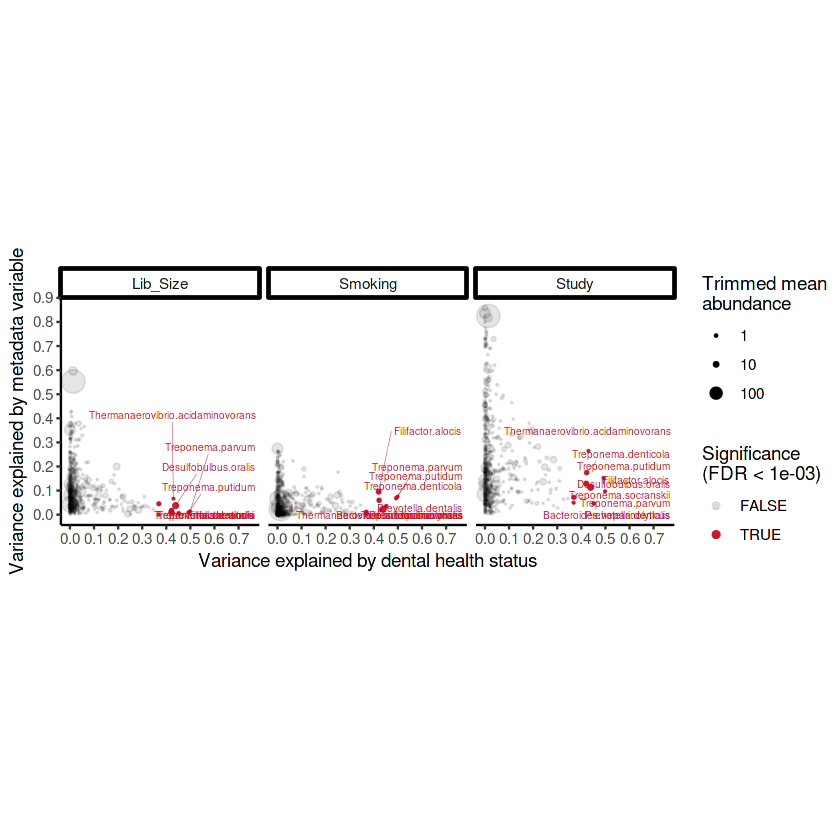

In [35]:
g

Warning message:
“ggrepel: 25 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 26 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 22 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


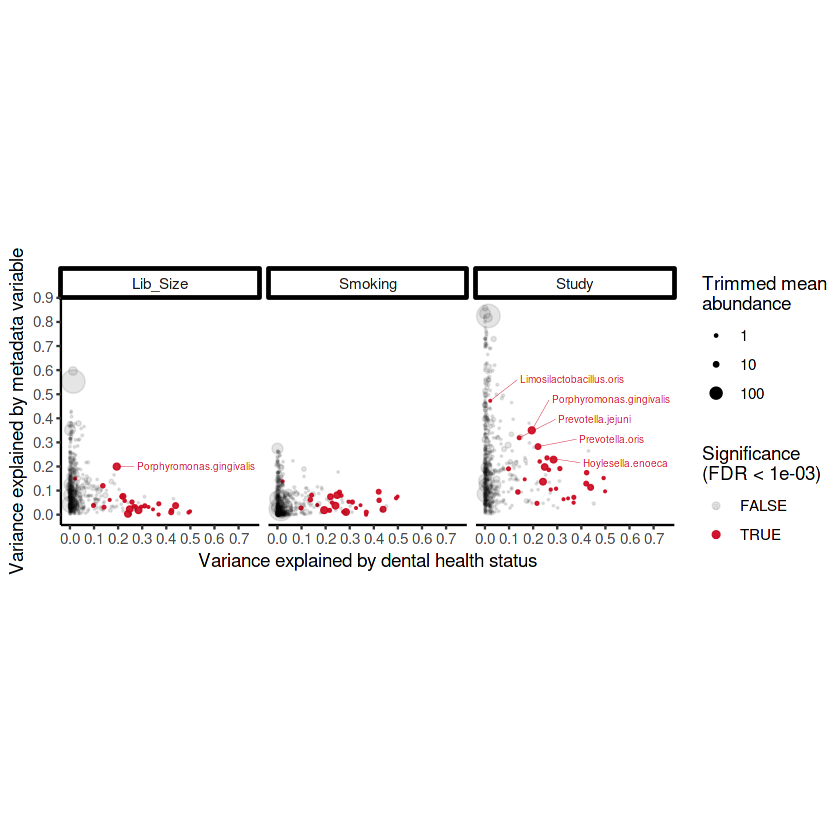

In [36]:
g_randomized

# CORE MICROBIOTA

In [764]:
data = read.table(file             = 'species_nozero.tab',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
#data=t(data)
head(data)

meta = read.table(file             = 'RNA_metadata_ALL.tab', 
                               header           = TRUE, 
                               sep              = "\t", 
                               
                               stringsAsFactors = FALSE)
rownames(meta)=meta$External_ID
meta[1:5, ]

,Aaosphaeria.arxii,Abiotrophia.defectiva,Abyssalbus.ytuae,Abyssicoccus.albus,Abyssogena.phaseoliformis.symbiont,Acanthamoeba.polyphaga.mimivirus,Acaromyces.ingoldii,Acaryochloris.marina,Acetilactobacillus.jinshanensis,Acetivibrio.clariflavus,⋯,cyanobacterium.endosymbiont.of.Rhopalodia.gibberula,endosymbiont.TC1.of.Trimyema.compressum,endosymbiont.of.Euscepes.postfasciatus,endosymbiont.of.Pachyrhynchus.infernalis,endosymbiont.of.Sipalinus.gigas,endosymbiont.of.unidentified.scaly.snail.isolate.Monju,secondary.endosymbiont.of.Ctenarytaina.eucalypti,secondary.endosymbiont.of.Heteropsylla.cubana,secondary.endosymbiont.of.Trabutina.mannipara,unidentified.bacterial.endosymbiont
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Metatranscriptome_Healthy1,0,74.0119,21.2371,0.00000,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Metatranscriptome_Healthy2,0,0.0000,0.0000,7.00000,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Metatranscriptome_Healthy3,0,2.0000,0.0000,0.00000,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Metatranscriptome_Healthy4,0,45.0114,0.0000,1.07248,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Metatranscriptome_Healthy5,5,318.0590,0.0000,7.00004,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Metatranscriptome_Healthy6,0,20.0007,0.0000,5.04353,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
Metatranscriptome_Healthy1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
Metatranscriptome_Healthy2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
Metatranscriptome_Healthy3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
Metatranscriptome_Healthy4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
Metatranscriptome_Healthy5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no


In [765]:
#open Maaslin2 output
df = read.table(file= '/mnt/raid1/armen/Schinos/META-ANALYSIS/ALL/Fungi/Maaslin2/species_NEGBIN_CSS_minprev_50_ALL/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           stringsAsFactors = FALSE)

maaslin2_data<- df[df$metadata=='Condition',]

row.names(maaslin2_data)<- maaslin2_data$feature
maaslin2_data<- subset(maaslin2_data, qval <= 0.001 & N.not.0 >= 27)

maaslin2_data

,feature,metadata,value,coef,stderr,N,N.not.0,pval,qval
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
Filifactor.alocis,Filifactor.alocis,Condition,Periodontitis,4.346509,0.4394837,54,47,4.598689e-23,2.506286e-20
Treponema.denticola,Treponema.denticola,Condition,Periodontitis,4.129704,0.5045273,54,44,2.716434e-16,7.402283e-14
Tannerella.forsythia,Tannerella.forsythia,Condition,Periodontitis,2.825739,0.3933672,54,54,6.796611e-13,1.234718e-10
Prevotella.intermedia,Prevotella.intermedia,Condition,Periodontitis,3.344024,0.4783486,54,51,2.733865e-12,3.724891e-10
Prevotella.multiformis,Prevotella.multiformis,Condition,Periodontitis,2.877507,0.4557575,54,48,2.724762e-10,2.551061e-08
Treponema.putidum,Treponema.putidum,Condition,Periodontitis,4.126771,0.6541089,54,38,2.808507e-10,2.551061e-08
Porphyromonas.gingivalis,Porphyromonas.gingivalis,Condition,Periodontitis,3.593361,0.5721053,54,53,3.365265e-10,2.620100e-08
Prevotella.oris,Prevotella.oris,Condition,Periodontitis,2.225220,0.3573777,54,54,4.769027e-10,3.248899e-08
Campylobacter.rectus,Campylobacter.rectus,Condition,Periodontitis,2.825777,0.4673565,54,48,1.482106e-09,8.974976e-08


In [766]:
#convert abundance from Agamemnon to relative abundance
rel_ab=apply(data,1,function(x){x/sum(x)})
head(rel_ab)
rel_ab <- as.data.frame(rel_ab)
#sanity check, all columns have to add up to 1
colSums(rel_ab)


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
Aaosphaeria.arxii,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,8.859204e-06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,6.406246e-05,0.000000000,0.000000e+00,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Abiotrophia.defectiva,2.629815e-04,0.000000000,9.740421e-05,1.339306e-04,5.635499e-04,4.535203e-05,6.833439e-05,6.732390e-04,2.984273e-04,4.380099e-04,⋯,2.618557e-05,8.076785e-05,0.002350731,1.137528e-05,0.005360912,0.00245103,0.0001548443,3.803056e-05,2.827637e-05,0.0003895409
Abyssalbus.ytuae,7.546037e-05,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.255326e-05,6.217502e-06,1.400003e-05,1.205374e-05,⋯,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,0.000000000,0.00000000,0.0000000000,1.810522e-06,0.000000e+00,0.0000000000
Abyssicoccus.albus,0.000000e+00,0.001015523,0.000000e+00,3.191145e-06,1.240296e-05,1.143632e-05,7.292024e-07,0.000000e+00,2.477444e-06,0.000000e+00,⋯,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Abyssogena.phaseoliformis.symbiont,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Acanthamoeba.polyphaga.mimivirus,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000


Metatranscriptome_Healthy1       Metatranscriptome_Healthy2 
                               1                                1 
      Metatranscriptome_Healthy3       Metatranscriptome_Healthy4 
                               1                                1 
      Metatranscriptome_Healthy5       Metatranscriptome_Healthy6 
                               1                                1 
Metatranscriptome_Periodontitis1 Metatranscriptome_Periodontitis2 
                               1                                1 
Metatranscriptome_Periodontitis3 Metatranscriptome_Periodontitis4 
                               1                                1 
Metatranscriptome_Periodontitis5 Metatranscriptome_Periodontitis6 
                               1                                1 
Metatranscriptome_Periodontitis7                       RNA_12.1_S 
                               1                                1 
                      RNA_12.2_P                       RNA_13.1_S 
                               1                                1 
                      RNA_15.1_S                       RNA_15.2_P 
                               1                                1 
                      RNA_21.1_S                       RNA_21.2_P 
                               1                                1 
                      RNA_22.1_S                       RNA_22.3_P 
                               1                                1 
                      RNA_26.2_P                       RNA_28.1_S 
                               1                                1 
                      RNA_28.3_P                        RNA_8.1_S 
                               1                                1 
                       RNA_8.2_P                        RNA_9.1_S 
                               1                                1 
                       RNA_9.2_P                       SRR1045151 
                               1                                1 
                      SRR1045152                       SRR1045153 
                               1                                1 
                      SRR1045154                       SRR1045155 
                               1                                1 
                      SRR1045157                      SRR13061493 
                               1                                1 
                     SRR13061496                      SRR13061499 
                               1                                1 
                     SRR13061502                      SRR13061556 
                               1                                1 
                     SRR13061559                      SRR13061562 
                               1                                1 
                     SRR13061566                      SRR13061569 
                               1                                1 
                     SRR13061572                      SRR13061578 
                               1                                1 
                     SRR13061583                      SRR13061586 
                               1                                1 
                     SRR13061592                      SRR13061595 
                               1                                1 
                     SRR13061598                      SRR13061602 
                               1                                1 
                     SRR13061606                      SRR13061608 
                               1                                1

In [767]:
#divide rel abundance data to healthy and periodontitis
#healthy samples
healthy=meta[meta$Condition == 'Healthy',]
healthy_samples=healthy$External_ID
length(healthy_samples)
#periodontitis samples
periodontitis=meta[meta$Condition == 'Periodontitis',]
periodontitis_samples=periodontitis$External_ID
length(periodontitis_samples)

healthy_data = rel_ab[,colnames(rel_ab)%in%healthy_samples]
head(healthy_data)
periodontitis_data=rel_ab[,colnames(rel_ab)%in%periodontitis_samples]
head(periodontitis_data)

[1] 27

[1] 27

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,RNA_12.1_S,RNA_13.1_S,RNA_15.1_S,RNA_21.1_S,⋯,SRR13061493,SRR13061496,SRR13061499,SRR13061502,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aaosphaeria.arxii,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,8.859204e-06,0.000000e+00,0.000000e+00,2.426521e-06,0.000000000,3.140722e-06,⋯,0.000000000,0.00000000,0.00000000,0.0000000000,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Abiotrophia.defectiva,2.629815e-04,0.000000000,9.740421e-05,1.339306e-04,5.635499e-04,4.535203e-05,1.756579e-06,9.748549e-05,0.000363904,1.300661e-03,⋯,0.005120762,0.02600479,0.01804771,0.0002030898,0.005360912,0.00245103,0.0001548443,3.803056e-05,2.827637e-05,0.0003895409
Abyssalbus.ytuae,7.546037e-05,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.000000000,0.00000000,0.00000000,0.0000000000,0.000000000,0.00000000,0.0000000000,1.810522e-06,0.000000e+00,0.0000000000
Abyssicoccus.albus,0.000000e+00,0.001015523,0.000000e+00,3.191145e-06,1.240296e-05,1.143632e-05,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.000000000,0.00000000,0.00000000,0.0000000000,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Abyssogena.phaseoliformis.symbiont,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.000000000,0.00000000,0.00000000,0.0000000000,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
Acanthamoeba.polyphaga.mimivirus,0.000000e+00,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00,⋯,0.000000000,0.00000000,0.00000000,0.0000000000,0.000000000,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000


,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,Metatranscriptome_Periodontitis5,Metatranscriptome_Periodontitis6,Metatranscriptome_Periodontitis7,RNA_12.2_P,RNA_15.2_P,RNA_21.2_P,⋯,SRR1045153,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aaosphaeria.arxii,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00000000,0.000000e+00,0.000000e+00,0.000000e+00,8.130470e-07,6.621811e-06,⋯,0.000000e+00,0.0000000000,0.0000000000,2.446912e-05,0.000000e+00,0.000000e+00,0.000000e+00,6.406246e-05,0.000000000,0.000000e+00
Abiotrophia.defectiva,6.833439e-05,6.732390e-04,2.984273e-04,4.380099e-04,0.00419011,2.268942e-05,7.985086e-05,1.248785e-05,7.689059e-05,1.063745e-04,⋯,1.617097e-04,0.0003334141,0.0001089371,9.579029e-05,4.480967e-05,9.297714e-06,2.618557e-05,8.076785e-05,0.002350731,1.137528e-05
Abyssalbus.ytuae,2.255326e-05,6.217502e-06,1.400003e-05,1.205374e-05,0.00000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,8.877695e-07,0.0000000000,0.0000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00
Abyssicoccus.albus,7.292024e-07,0.000000e+00,2.477444e-06,0.000000e+00,0.00000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,0.0000000000,0.0000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00
Abyssogena.phaseoliformis.symbiont,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,0.0000000000,0.0000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00
Acanthamoeba.polyphaga.mimivirus,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,⋯,0.000000e+00,0.0000000000,0.0000000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000000,0.000000e+00


In [768]:
###Checking if the species is:
#above rel. abundance threshold (>= 75th percentile in the sample) 
#and prevalence threshold(80% of all samples in the group)


##Store the 75th percentile for each sample in each study group (healthy and periodontitis) 
# Create an empty list to store the quantiles results
quantiles_healthy <- list()
quantiles_peri <- list()

# Loop over each column (samples) of the dataframe
#healthy group
for (sample in colnames(healthy_data)) {  
  # Calculate the 75th percentile value for the current column
  # all species with relative abundance greater than zero in the sample
  non_zero_species <- subset(healthy_data[[sample]], healthy_data[[sample]] != 0)
  percentile <- quantile(as.numeric(non_zero_species), probs = 0.75)
  # Add the result to the list
  quantiles_healthy[[sample]] <- as.numeric(percentile)
}

#periodontitis group
for (sample in colnames(periodontitis_data)) {
  # Calculate the 80th percentile value for the current column
  # all species with relative abundance greater than zero in the sample
  non_zero_species <- subset(periodontitis_data[[sample]], periodontitis_data[[sample]] != 0)
  percentile <- quantile(as.numeric(non_zero_species), probs = 0.75)
  # Add the result to the list
  quantiles_peri[[sample]] <- as.numeric(percentile)
}

#quantiles_healthy[1]
#quantiles_peri[1]

prev_threshold=0.8
#number of taxa in data
taxon_len_healthy=dim(healthy_data)[1]
taxon_len_peri=dim(periodontitis_data)[1]
#number of samples
samples_healthy=dim(healthy_data)[2]
samples_peri=dim(periodontitis_data)[2]

#mean rel abundance of each species in the healthy and periodontitis groups
species_means_healthy <- rowMeans(healthy_data)
species_means_peri <- rowMeans(periodontitis_data)

core_healthy= list()
core_peri=list()

## core microbiota for healthy samples
# for each species
for (t in 1:taxon_len_healthy) {
  # count the number of samples that the species is present with the required thresholds
  count <- 0
  # for each sample  
  for (s in 1:samples_healthy) {
    # check if the rel abundance of the species is in the 90th percentile in the sample  
    if (healthy_data[t, s] > as.numeric(quantiles_healthy[s])) {
      count <- count + 1
    }
  }
  prevalence <- count / samples_healthy  
  if (prevalence > prev_threshold) {
    core_healthy <- append(core_healthy, rownames(healthy_data)[t])
  }
}

## core microbiota for periodontitis samples
for (t in 1:taxon_len_peri) {
  count <- 0
  for (s in 1:samples_peri) {
    if (periodontitis_data[t, s] > as.numeric(quantiles_peri[s])) {
      count <- count + 1
    }
  }
  prevalence <- count / samples_peri  
  if (prevalence > prev_threshold) {
    core_peri <- append(core_peri, rownames(periodontitis_data)[t])
  }
}
  

df_core_peri=data.frame(species_means_peri)
colnames(df_core_peri)='Mean rel. abundance periodontitis'
#df_core_peri
df_core_healthy=data.frame(species_means_healthy)
colnames(df_core_healthy)='Mean rel. abundance healthy'
#df_core_healthy
#dataframe containing the mean rel ab of all species for healthy and peri groups
mean_df=merge(df_core_healthy, df_core_peri, by = "row.names", all=FALSE)

In [770]:
print("The number of identified species in the core microbiota of healthy group is: ")
length(core_healthy)
print("The number of identified species in the core microbiota of periodontitis group is: ")
length(core_peri)
print("The number of shared species between the healthy and periodontitis core microbiota is :")
shared_core <- intersect(core_healthy, core_peri)
length(shared_core)
print("The number of species exclusively found in the healthy core is :")
non_shared_core<- setdiff(core_healthy, core_peri)
non_shared_core
print("The number of species exclusively found in the periodontitis core is :")
only_peri<- setdiff(core_peri, core_healthy)
length(only_peri)
print("The total number of different species in both cores is :")
#union of core microbiomes of healthy and periodontitis
all_core <- unique(c(core_healthy, core_peri))
length(all_core)
all_core

#differentially abundant species found in core
#healthy
healthy_shared_diff <- intersect(core_healthy, rownames(maaslin2_data))
healthy_non_shared_diff <- setdiff(core_healthy, rownames(maaslin2_data))
healthy_shared_diff
healthy_non_shared_diff
#periodontitis
peri_shared_diff <- intersect(core_peri, rownames(maaslin2_data))
peri_non_shared_diff <- setdiff(core_peri, rownames(maaslin2_data))
peri_shared_diff
peri_non_shared_diff 

#cores with mean rel ab data to be saved
all= mean_df[mean_df$Row.names %in% all_core, ]
healthy=mean_df[mean_df$Row.names %in% core_healthy, ]
periodontitis=mean_df[mean_df$Row.names %in% core_peri, ]
shared=mean_df[mean_df$Row.names %in% shared_core, ]
non_shared=mean_df[mean_df$Row.names %in% non_shared_core, ]
only_periodontitis=mean_df[mean_df$Row.names %in% only_peri, ]


rownames(all)=all$Row.names
diff_core=merge(all, maaslin2_data,  by = "row.names", all=FALSE)
diff_core <- diff_core[, -c(2, 5)]
diff_core_sorted <- diff_core[order(diff_core$qval), ]

#save
#all unique species in both cores
write.table(all, "core_all.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
#healthy core
write.table(healthy, "healthy_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
# periodontitis core
write.table(periodontitis, "periodontitis_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
#shared core
write.table(shared, "shared_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
#only healthy
write.table(non_shared, "only_healthy_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
#only in periodontitis
write.table(only_periodontitis, "only_periodontitis_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)
#differentially abundant core
write.table(diff_core_sorted, "diff_core.tsv", sep = "\t", col.names = TRUE, row.names = FALSE)




[1] "The number of identified species in the core microbiota of healthy group is: "


[1] 40

[1] "The number of identified species in the core microbiota of periodontitis group is: "


[1] 80

[1] "The number of shared species between the healthy and periodontitis core microbiota is :"


[1] 38

[1] "The number of species exclusively found in the healthy core is :"


[[1]]
[1] "Lautropia.mirabilis"

[[2]]
[1] "Neisseria.sicca"

[1] "The number of species exclusively found in the periodontitis core is :"


[1] 42

[1] "The total number of different species in both cores is :"


[1] 82

[[1]]
[1] "Actinomyces.faecalis"

[[2]]
[1] "Actinomyces.naeslundii"

[[3]]
[1] "Actinomyces.oris"

[[4]]
[1] "Actinomyces.viscosus"

[[5]]
[1] "Actinomyces.weissii"

[[6]]
[1] "Arachnia.propionica"

[[7]]
[1] "Fusobacterium.canifelinum"

[[8]]
[1] "Fusobacterium.nucleatum"

[[9]]
[1] "Gemella.haemolysans"

[[10]]
[1] "Gemella.morbillorum"

[[11]]
[1] "Granulicatella.adiacens"

[[12]]
[1] "Kingella.oralis"

[[13]]
[1] "Lautropia.mirabilis"

[[14]]
[1] "Neisseria.sicca"

[[15]]
[1] "Parvimonas.micra"

[[16]]
[1] "Porphyromonas.gingivalis"

[[17]]
[1] "Prevotella.nigrescens"

[[18]]
[1] "Rothia.aeria"

[[19]]
[1] "Rothia.dentocariosa"

[[20]]
[1] "Schaalia.meyeri"

[[21]]
[1] "Selenomonas.sputigena"

[[22]]
[1] "Streptococcus.anginosus"

[[23]]
[1] "Streptococcus.australis"

[[24]]
[1] "Streptococcus.cristatus"

[[25]]
[1] "Streptococcus.gordonii"

[[26]]
[1] "Streptococcus.gwangjuense"

[[27]]
[1] "Streptococcus.intermedius"

[[28]]
[1] "Streptococcus.koreensis"

[[29]]
[1] "Streptococcus.lactarius"

[[30]]
[1] "Streptococcus.mutans"

[[31]]
[1] "Streptococcus.oralis"

[[32]]
[1] "Streptococcus.periodonticum"

[[33]]
[1] "Streptococcus.pseudopneumoniae"

[[34]]
[1] "Streptococcus.thermophilus"

[[35]]
[1] "Streptococcus.toyakuensis"

[[36]]
[1] "Tannerella.forsythia"

[[37]]
[1] "Veillonella.dispar"

[[38]]
[1] "Veillonella.nakazawae"

[[39]]
[1] "Veillonella.parvula"

[[40]]
[1] "Veillonella.rodentium"

[[41]]
[1] "Actinomyces.gaoshouyii"

[[42]]
[1] "Actinomyces.howellii"

[[43]]
[1] "Actinomyces.marmotae"

[[44]]
[1] "Actinomyces.pacaensis"

[[45]]
[1] "Actinomyces.procaprae"

[[46]]
[1] "Actinomyces.qiguomingii"

[[47]]
[1] "Actinomyces.radicidentis"

[[48]]
[1] "Actinomyces.respiraculi"

[[49]]
[1] "Actinomyces.slackii"

[[50]]
[1] "Actinomyces.trachealis"

[[51]]
[1] "Campylobacter.gracilis"

[[52]]
[1] "Campylobacter.rectus"

[[53]]
[1] "Campylobacter.showae"

[[54]]
[1] "Capnocytophaga.gingivalis"

[[55]]
[1] "Capnocytophaga.sputigena"

[[56]]
[1] "Desulfobulbus.oralis"

[[57]]
[1] "Eikenella.corrodens"

[[58]]
[1] "Filifactor.alocis"

[[59]]
[1] "Fusobacterium.hwasookii"

[[60]]
[1] "Fusobacterium.pseudoperiodonticum"

[[61]]
[1] "Gemella.sanguinis"

[[62]]
[1] "Hoylesella.buccalis"

[[63]]
[1] "Hoylesella.enoeca"

[[64]]
[1] "Lachnoanaerobaculum.umeaense"

[[65]]
[1] "Lancefieldella.parvula"

[[66]]
[1] "Leptotrichia.trevisanii"

[[67]]
[1] "Leptotrichia.wadei"

[[68]]
[1] "Mogibacterium.diversum"

[[69]]
[1] "Olsenella.uli"

[[70]]
[1] "Prevotella.dentalis"

[[71]]
[1] "Prevotella.denticola"

[[72]]
[1] "Prevotella.histicola"

[[73]]
[1] "Prevotella.intermedia"

[[74]]
[1] "Prevotella.jejuni"

[[75]]
[1] "Prevotella.melaninogenica"

[[76]]
[1] "Prevotella.oris"

[[77]]
[1] "Prevotella.veroralis"

[[78]]
[1] "Schaalia.cardiffensis"

[[79]]
[1] "Streptococcus.himalayensis"

[[80]]
[1] "Treponema.denticola"

[[81]]
[1] "Treponema.putidum"

[[82]]
[1] "Treponema.socranskii"

[[1]]
[1] "Parvimonas.micra"

[[2]]
[1] "Porphyromonas.gingivalis"

[[3]]
[1] "Streptococcus.periodonticum"

[[4]]
[1] "Tannerella.forsythia"

[[1]]
[1] "Actinomyces.faecalis"

[[2]]
[1] "Actinomyces.naeslundii"

[[3]]
[1] "Actinomyces.oris"

[[4]]
[1] "Actinomyces.viscosus"

[[5]]
[1] "Actinomyces.weissii"

[[6]]
[1] "Arachnia.propionica"

[[7]]
[1] "Fusobacterium.canifelinum"

[[8]]
[1] "Fusobacterium.nucleatum"

[[9]]
[1] "Gemella.haemolysans"

[[10]]
[1] "Gemella.morbillorum"

[[11]]
[1] "Granulicatella.adiacens"

[[12]]
[1] "Kingella.oralis"

[[13]]
[1] "Lautropia.mirabilis"

[[14]]
[1] "Neisseria.sicca"

[[15]]
[1] "Prevotella.nigrescens"

[[16]]
[1] "Rothia.aeria"

[[17]]
[1] "Rothia.dentocariosa"

[[18]]
[1] "Schaalia.meyeri"

[[19]]
[1] "Selenomonas.sputigena"

[[20]]
[1] "Streptococcus.anginosus"

[[21]]
[1] "Streptococcus.australis"

[[22]]
[1] "Streptococcus.cristatus"

[[23]]
[1] "Streptococcus.gordonii"

[[24]]
[1] "Streptococcus.gwangjuense"

[[25]]
[1] "Streptococcus.intermedius"

[[26]]
[1] "Streptococcus.koreensis"

[[27]]
[1] "Streptococcus.lactarius"

[[28]]
[1] "Streptococcus.mutans"

[[29]]
[1] "Streptococcus.oralis"

[[30]]
[1] "Streptococcus.pseudopneumoniae"

[[31]]
[1] "Streptococcus.thermophilus"

[[32]]
[1] "Streptococcus.toyakuensis"

[[33]]
[1] "Veillonella.dispar"

[[34]]
[1] "Veillonella.nakazawae"

[[35]]
[1] "Veillonella.parvula"

[[36]]
[1] "Veillonella.rodentium"

[[1]]
[1] "Campylobacter.rectus"

[[2]]
[1] "Desulfobulbus.oralis"

[[3]]
[1] "Filifactor.alocis"

[[4]]
[1] "Hoylesella.buccalis"

[[5]]
[1] "Hoylesella.enoeca"

[[6]]
[1] "Olsenella.uli"

[[7]]
[1] "Parvimonas.micra"

[[8]]
[1] "Porphyromonas.gingivalis"

[[9]]
[1] "Prevotella.denticola"

[[10]]
[1] "Prevotella.histicola"

[[11]]
[1] "Prevotella.intermedia"

[[12]]
[1] "Prevotella.jejuni"

[[13]]
[1] "Prevotella.oris"

[[14]]
[1] "Streptococcus.periodonticum"

[[15]]
[1] "Tannerella.forsythia"

[[16]]
[1] "Treponema.denticola"

[[17]]
[1] "Treponema.putidum"

[[18]]
[1] "Treponema.socranskii"

[[1]]
[1] "Actinomyces.faecalis"

[[2]]
[1] "Actinomyces.gaoshouyii"

[[3]]
[1] "Actinomyces.howellii"

[[4]]
[1] "Actinomyces.marmotae"

[[5]]
[1] "Actinomyces.naeslundii"

[[6]]
[1] "Actinomyces.oris"

[[7]]
[1] "Actinomyces.pacaensis"

[[8]]
[1] "Actinomyces.procaprae"

[[9]]
[1] "Actinomyces.qiguomingii"

[[10]]
[1] "Actinomyces.radicidentis"

[[11]]
[1] "Actinomyces.respiraculi"

[[12]]
[1] "Actinomyces.slackii"

[[13]]
[1] "Actinomyces.trachealis"

[[14]]
[1] "Actinomyces.viscosus"

[[15]]
[1] "Actinomyces.weissii"

[[16]]
[1] "Arachnia.propionica"

[[17]]
[1] "Campylobacter.gracilis"

[[18]]
[1] "Campylobacter.showae"

[[19]]
[1] "Capnocytophaga.gingivalis"

[[20]]
[1] "Capnocytophaga.sputigena"

[[21]]
[1] "Eikenella.corrodens"

[[22]]
[1] "Fusobacterium.canifelinum"

[[23]]
[1] "Fusobacterium.hwasookii"

[[24]]
[1] "Fusobacterium.nucleatum"

[[25]]
[1] "Fusobacterium.pseudoperiodonticum"

[[26]]
[1] "Gemella.haemolysans"

[[27]]
[1] "Gemella.morbillorum"

[[28]]
[1] "Gemella.sanguinis"

[[29]]
[1] "Granulicatella.adiacens"

[[30]]
[1] "Kingella.oralis"

[[31]]
[1] "Lachnoanaerobaculum.umeaense"

[[32]]
[1] "Lancefieldella.parvula"

[[33]]
[1] "Leptotrichia.trevisanii"

[[34]]
[1] "Leptotrichia.wadei"

[[35]]
[1] "Mogibacterium.diversum"

[[36]]
[1] "Prevotella.dentalis"

[[37]]
[1] "Prevotella.melaninogenica"

[[38]]
[1] "Prevotella.nigrescens"

[[39]]
[1] "Prevotella.veroralis"

[[40]]
[1] "Rothia.aeria"

[[41]]
[1] "Rothia.dentocariosa"

[[42]]
[1] "Schaalia.cardiffensis"

[[43]]
[1] "Schaalia.meyeri"

[[44]]
[1] "Selenomonas.sputigena"

[[45]]
[1] "Streptococcus.anginosus"

[[46]]
[1] "Streptococcus.australis"

[[47]]
[1] "Streptococcus.cristatus"

[[48]]
[1] "Streptococcus.gordonii"

[[49]]
[1] "Streptococcus.gwangjuense"

[[50]]
[1] "Streptococcus.himalayensis"

[[51]]
[1] "Streptococcus.intermedius"

[[52]]
[1] "Streptococcus.koreensis"

[[53]]
[1] "Streptococcus.lactarius"

[[54]]
[1] "Streptococcus.mutans"

[[55]]
[1] "Streptococcus.oralis"

[[56]]
[1] "Streptococcus.pseudopneumoniae"

[[57]]
[1] "Streptococcus.thermophilus"

[[58]]
[1] "Streptococcus.toyakuensis"

[[59]]
[1] "Veillonella.dispar"

[[60]]
[1] "Veillonella.nakazawae"

[[61]]
[1] "Veillonella.parvula"

[[62]]
[1] "Veillonella.rodentium"

Warning message in merge.data.frame(all, maaslin2_data, by = "row.names", all = FALSE):
“column name ‘Row.names’ is duplicated in the result”


# Differentially abundant genera

In [101]:
#abundance of genera
genera= read.table(file='genus.tab', 
                               header           = TRUE, 
                               sep              = "\t", 
                               row.names=1,
                               stringsAsFactors = FALSE)
genera=t(genera)

# CSS normalized abundance data of genera 
genera_css = read.table(file='genus_CSS.tsv', 
                        header           = TRUE, 
                        sep              = "\t", 
                        row.names=1,
                        stringsAsFactors = FALSE)
genera_log=log(genera_css)

#metadata
meta = read.table(file='RNA_metadata_ALL.tab', 
                               header           = TRUE, 
                               sep              = "\t", 
                               #row.names=1,
                               stringsAsFactors = FALSE)
meta[1:5, ]


,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no


In [103]:

head(genera)
head(genera_css)
head(genera_log)


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
Aalivirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,⋯,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Aaosphaeria,0.0000,0,0,0.0000,5.000,0.0000,0.000,0.00,0.00,0.000,⋯,0.0000,10.4507,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Aarhusvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,⋯,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abbeymikolonvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,⋯,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abidjanvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,⋯,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abiotrophia,74.0119,0,2,45.0114,318.059,20.0007,179.931,3058.87,1015.16,423.506,⋯,13.0054,13.1759,1338.57,6.0003,2719.46,1597.9,83.0612,21.0053,13.0025,273.158


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aalivirus,0.000000,0,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000,0.00000,0.000,⋯,0.0000000,0.0000000,0.0000,0.0000000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.00000
Aaosphaeria,0.000000,0,0.0000000,0.000000,0.1850059,0.0000000,0.000000,0.0000,0.00000,0.000,⋯,0.0000000,0.5501613,0.0000,0.0000000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.00000
Aarhusvirus,0.000000,0,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000,0.00000,0.000,⋯,0.0000000,0.0000000,0.0000,0.0000000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.00000
Abbeymikolonvirus,0.000000,0,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000,0.00000,0.000,⋯,0.0000000,0.0000000,0.0000,0.0000000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.00000
Abidjanvirus,0.000000,0,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000,0.00000,0.000,⋯,0.0000000,0.0000000,0.0000,0.0000000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.00000
Abiotrophia,1.139911,0,0.5143728,1.305512,11.7685583,0.7264795,6.074754,118.3386,30.92084,15.694,⋯,0.2286646,0.6936254,43.5667,0.1886509,89.78898,33.86373,1.767257,0.6204798,1.422036,13.18573


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aalivirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Aaosphaeria,-Inf,-Inf,-Inf,-Inf,-1.687368,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-0.5975437,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Aarhusvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abbeymikolonvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abidjanvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abiotrophia,0.1309499,-Inf,-0.6648071,0.2665954,2.465431,-0.319545,1.804142,4.77355,3.43143,2.753278,⋯,-1.475499,-0.3658233,3.774293,-1.667857,4.497462,3.522345,0.5694285,-0.4772622,0.3520897,2.579135


In [ ]:
#Maaslin2 with CSS normalization and NEGBIN model
Maaslin2(
    genera,
    meta,
    output = "./Maaslin2/Genera_CSS_NEGBIN_prev50",
    min_abundance = 0.0,
    min_prevalence = 0.50,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    #max_significance = 0.25,
    random_effects = c('Study') ,
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 24,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100,
    reference= c("Study","Belstrom_2021") 
)

In [90]:
# separate data for each study
genera_Duran_Pinedo_2014 <- genera[, 1:13]
head(genera_Duran_Pinedo_2014)
genera_Yost_2015 <- genera[, 14:29]
head(genera_Yost_2015)
genera_Jorth_2014 <- genera[, 30:35]
head(genera_Jorth_2014)
genera_Belstrom_2021 <- genera[, 36:54]
head(genera_Belstrom_2021)

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,Metatranscriptome_Periodontitis5,Metatranscriptome_Periodontitis6,Metatranscriptome_Periodontitis7
Aalivirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,0.00,0.0000,0.0000
Aaosphaeria,0.0000,0,0,0.0000,5.000,0.0000,0.000,0.00,0.00,0.000,0.00,0.0000,0.0000
Aarhusvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,0.00,0.0000,0.0000
Abbeymikolonvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,0.00,0.0000,0.0000
Abidjanvirus,0.0000,0,0,0.0000,0.000,0.0000,0.000,0.00,0.00,0.000,0.00,0.0000,0.0000
Abiotrophia,74.0119,0,2,45.0114,318.059,20.0007,179.931,3058.87,1015.16,423.506,2779.67,15.0004,39.1429


,RNA_12.1_S,RNA_12.2_P,RNA_13.1_S,RNA_15.1_S,RNA_15.2_P,RNA_21.1_S,RNA_21.2_P,RNA_22.1_S,RNA_22.3_P,RNA_26.2_P,RNA_28.1_S,RNA_28.3_P,RNA_8.1_S,RNA_8.2_P,RNA_9.1_S,RNA_9.2_P
Aalivirus,0.00000,0.0000,0.000,0.000,0.0000,0.000,0.0000,0.00000,0.000,0.0,0.0000,0.000,0.000,0.00000,0.00000,0.000
Aaosphaeria,0.00000,0.0000,1.000,0.000,1.0000,1.000,5.0000,0.00000,0.000,0.0,0.0000,0.000,2.000,0.00000,2.00000,0.000
Aarhusvirus,0.00000,0.0000,0.000,0.000,0.0000,0.000,0.0000,0.00000,0.000,0.0,0.0000,0.000,0.000,0.00000,0.00000,0.000
Abbeymikolonvirus,0.00000,0.0000,0.000,0.000,0.0000,0.000,0.0000,0.00000,0.000,0.0,0.0000,0.000,0.000,0.00000,0.00000,0.000
Abidjanvirus,0.00000,0.0000,0.000,0.000,0.0000,0.000,0.0000,0.00000,0.000,0.0,0.0000,0.000,0.000,0.00000,0.00000,0.000
Abiotrophia,2.00038,21.0165,40.175,299.004,94.5709,414.128,80.3213,2.00045,180.884,2821.3,83.0492,133.182,596.547,3.01625,7.03475,7.989


,SRR1045151,SRR1045152,SRR1045153,SRR1045154,SRR1045155,SRR1045157
Aalivirus,0.0000,0.0000,0.00,0.00000,0.00000,0
Aaosphaeria,0.0000,0.0000,0.00,0.00000,0.00000,0
Aarhusvirus,0.0000,0.0000,0.00,0.00000,0.00000,0
Abbeymikolonvirus,0.0000,0.0000,0.00,0.00000,0.00000,0
Abidjanvirus,0.0000,0.0000,0.00,0.00000,0.00000,0
Abiotrophia,54.8001,86.5267,2569.12,3.11877,3.76656,12995


,SRR13061493,SRR13061496,SRR13061499,SRR13061502,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
Aalivirus,0.00,0.0,0.0,0.000,0.000,0.0000,0.00000,0.00000,0.00000,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Aaosphaeria,0.00,0.0,0.0,0.000,0.000,0.0000,8.94082,0.00000,0.00000,0.0000,10.4507,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Aarhusvirus,0.00,0.0,0.0,0.000,0.000,0.0000,0.00000,0.00000,0.00000,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abbeymikolonvirus,0.00,0.0,0.0,0.000,0.000,0.0000,0.00000,0.00000,0.00000,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abidjanvirus,0.00,0.0,0.0,0.000,0.000,0.0000,0.00000,0.00000,0.00000,0.0000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.0000,0.0000,0.000
Abiotrophia,2462.41,20260.8,14059.7,128.038,222.129,30.0174,35.00100,6.00351,7.00137,13.0054,13.1759,1338.57,6.0003,2719.46,1597.9,83.0612,21.0053,13.0025,273.158


In [ ]:
#Run this code for all the 4 studies separtely
Maaslin2(
    genera_Belstrom_2021,
    meta,
    output = "./Maaslin2/Genera_Belstrom_2021",
    min_abundance = 0.0,
    min_prevalence = 0.50,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    #max_significance = 0.25,
    #random_effects = c('Study') ,
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 8,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100
    #reference= c("Study","Belstrom_2021") 
)

In [91]:
#Differential abunadance analysis results for all studies combined from Maaslin2
maaslin2_all = read.table(file='./Maaslin2/Genera_CSS_NEGBIN_prev50/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
#keep only the species with qval greater or equal to 0.001 
maaslin2_all <- subset(maaslin2_all, qval <= 0.001)
dim(maaslin2_all)
maaslin2_all

[1] 25  8

,metadata,value,coef,stderr,N,N.not.0,pval,qval
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
Filifactor,Condition,Periodontitis,4.788503,0.4691908,54,47,1.866273e-24,5.561494e-22
Tannerella,Condition,Periodontitis,3.339564,0.4510487,54,54,1.321444e-13,1.968952e-11
Porphyromonas,Condition,Periodontitis,3.568276,0.5098127,54,54,2.574460e-12,2.557297e-10
Pyramidobacter,Condition,Periodontitis,3.362773,0.4836637,54,39,3.583378e-12,2.669617e-10
Lactobacillus,Condition,Periodontitis,3.873083,0.6108834,54,48,2.295642e-10,1.368202e-08
Bacteroides,Condition,Periodontitis,2.772391,0.4474069,54,50,5.770453e-10,2.865991e-08
Treponema,Condition,Periodontitis,3.072476,0.5084611,54,51,1.515604e-09,6.452141e-08
Limosilactobacillus,Condition,Periodontitis,4.249000,0.7261807,54,44,4.881536e-09,1.818372e-07
Prevotella,Condition,Periodontitis,2.465357,0.4318443,54,54,1.137074e-08,3.764979e-07


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aalivirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Aaosphaeria,-Inf,-Inf,-Inf,-Inf,-1.687368,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-0.5975437,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Aarhusvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abbeymikolonvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abidjanvirus,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
Abiotrophia,0.1309499,-Inf,-0.6648071,0.2665954,2.465431,-0.319545,1.804142,4.77355,3.43143,2.753278,⋯,-1.475499,-0.3658233,3.774293,-1.667857,4.497462,3.522345,0.5694285,-0.4772622,0.3520897,2.579135


In [93]:
#open Maaslin2 differential abundance analysis results for genera of all studies
Belstrom_2021 = read.table(file             = './Maaslin2/Genera_Belstrom_2021/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Belstrom_2021=Belstrom_2021["qval"]
colnames(Belstrom_2021)='Belstrom_2021'
head(Belstrom_2021)


Duran_Pinedo_2014 = read.table(file             = './Maaslin2/Genera_Duran_Pinedo_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Duran_Pinedo_2014=Duran_Pinedo_2014["qval"]
colnames(Duran_Pinedo_2014)='Duran_Pinedo_2014'
head(Duran_Pinedo_2014)

Jorth_2014 = read.table(file             = './Maaslin2/Genera_Jorth_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Jorth_2014=Jorth_2014["qval"]
colnames(Jorth_2014)='Jorth_2014'
head(Jorth_2014)

Yost_2015 = read.table(file             = './Maaslin2/Genera_Yost_2015/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Yost_2015=Yost_2015["qval"]
colnames(Yost_2015)='Yost_2015'
head(Yost_2015)

,Belstrom_2021
,<dbl>
Filifactor,1.890990e-17
Streptobacillus,2.072421e-15
Pyramidobacter,1.075603e-12
Morococcus,1.051960e-10
Tannerella,1.101814e-07
Saprochaete,1.412546e-07


,Duran_Pinedo_2014
,<dbl>
Candidatus.Nanosynbacter,0.000000e+00
Filifactor,0.000000e+00
Fusarium,0.000000e+00
Gammaretrovirus,0.000000e+00
Pseudoleptotrichia,0.000000e+00
Rodentibacter,6.515643e-231


,Jorth_2014
,<dbl>
Candidatus.Kinetoplastibacterium,0.000000e+00
Megasphaera,1.240955e-224
Thermanaerovibrio,5.602793e-208
Clostridium,3.510448e-185
Pasteurella,3.186004e-144
Mageeibacillus,1.610863e-113


,Yost_2015
,<dbl>
Alkalimarinus,2.444621e-152
Campylobacter,7.737999e-06
Pichia,7.737999e-06
Clostridium,5.133501e-05
Hoylesella,1.007205e-04
Limosilactobacillus,1.007205e-04


In [104]:
#merge all the results (qvals) together 
all_studies <- merge(Belstrom_2021, Duran_Pinedo_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Jorth_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Yost_2015, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
# Display the merged data frame
head(all_studies)

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015
,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia,0.002943232,0.010715266,1.704089e-01,NA
Abyssalbus,NA,NA,1.143527e-01,NA
Acetivibrio,NA,NA,1.335250e-01,NA
Acetoanaerobium,NA,0.003088280,1.693374e-10,NA
Acetobacterium,NA,NA,9.547707e-04,NA
Achromobacter,NA,0.008867085,2.624438e-13,NA


In [106]:
# merge all data together
#prepare the data from all the studies combined
all_qval=maaslin2_all["qval"]
colnames(all_qval)='qval_all'
head(all_pval)

all_data <- merge(all_studies, all_qval, by = "row.names", all = TRUE)
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
head(all_data)

,qval_all
,<dbl>
Filifactor,5.561494e-22
Tannerella,1.968952e-11
Porphyromonas,2.557297e-10
Pyramidobacter,2.669617e-10
Lactobacillus,1.368202e-08
Bacteroides,2.865991e-08


,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Abiotrophia,0.002943232,0.010715266,1.704089e-01,NA,NA
Abyssalbus,NA,NA,1.143527e-01,NA,NA
Acetivibrio,NA,NA,1.335250e-01,NA,NA
Acetoanaerobium,NA,0.003088280,1.693374e-10,NA,NA
Acetobacterium,NA,NA,9.547707e-04,NA,NA
Achromobacter,NA,0.008867085,2.624438e-13,NA,NA


In [107]:
# Find common row names
common_rows <- intersect(rownames(all_studies), rownames(all_pval))
# Subset data frames based on common row names
df1_subset <- all_studies[common_rows, ]
# Merge by row names
all_data <- merge(df1_subset, all_pval, by = 0, all = TRUE)
# Set row names
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
dim(all_data)
head(all_data)

[1] 25  5

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Anaeromyxobacter,1.278088e-02,NA,NA,NA,7.916346e-04
Bacteroides,2.583542e-05,4.152275e-02,1.112282e-09,2.066164e-02,2.865991e-08
Blautia,NA,1.294431e-02,2.198071e-05,1.178748e-01,6.179242e-04
Campylobacter,NA,3.476641e-08,9.525550e-20,7.737999e-06,3.988023e-05
Caulobacter,NA,6.084889e-02,NA,1.614083e-02,3.226610e-04
Delftia,NA,2.753095e-04,NA,1.105376e-01,8.107272e-05


In [108]:
statistics= all_data["qval_all"]
statistics$genus=rownames(statistics)
statistics <- statistics[order(statistics$qval_all), ]
rownames(statistics) <- NULL
statistics

qval_all,genus
<dbl>,<chr>
5.561494e-22,Filifactor
1.968952e-11,Tannerella
2.557297e-10,Porphyromonas
2.669617e-10,Pyramidobacter
1.368202e-08,Lactobacillus
2.865991e-08,Bacteroides
6.452141e-08,Treponema
1.818372e-07,Limosilactobacillus
3.764979e-07,Prevotella


In [109]:
sig_list=statistics$genus
sig_list

[1] "Filifactor"          "Tannerella"          "Porphyromonas"      
 [4] "Pyramidobacter"      "Lactobacillus"       "Bacteroides"        
 [7] "Treponema"           "Limosilactobacillus" "Prevotella"         
[10] "Hoylesella"          "Ezakiella"           "Desulfobulbus"      
[13] "Olsenella"           "Thermanaerovibrio"   "Thomasclavelia"     
[16] "Campylobacter"       "Delftia"             "Parvimonas"         
[19] "Eubacterium"         "Desulfovibrio"       "Caulobacter"        
[22] "Enterocloster"       "Blautia"             "Anaeromyxobacter"   
[25] "Eggerthella"

In [114]:
filtered_data_reordered <- genera_log[match(sig_list, rownames(genera_log)), ]
filtered_data_reordered

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Filifactor,-Inf,-Inf,-Inf,-0.832270190,0.4989219,-0.6694851,4.97127435,6.95416307,5.81355182,5.991928856,⋯,3.5847949,5.957329591,6.23630744,4.9556532,-1.4413341,-0.5960006,-0.41669440,-0.03372965,-0.01582737,2.295566907
Tannerella,-0.6315721,3.6059333,2.8630391,1.990417363,3.6932668,2.1261222,5.46740827,8.68567417,7.19956185,7.909924239,⋯,4.7024846,6.146411310,5.21957036,3.0283642,1.8117354,3.0606399,2.08710200,3.02626374,3.12928230,1.468894584
Porphyromonas,1.5512497,2.0331619,0.7214873,2.532039623,3.1590228,2.8048821,4.91671193,9.90040078,8.25695813,8.802906351,⋯,4.6017721,0.004606712,1.24799942,4.6598406,1.2503521,0.3395752,-0.12540828,0.92214483,-0.26209882,0.003975879
Pyramidobacter,-Inf,-Inf,-Inf,-Inf,-Inf,-2.6221651,-Inf,4.60908307,3.02895976,-2.591518668,⋯,-1.4018062,-0.746988081,0.37971898,-0.7516165,-3.4101465,-3.8541009,-3.15587766,-1.21945192,-1.51990477,-Inf
Lactobacillus,1.7851590,-Inf,-1.3579543,-0.918990701,0.2012282,-0.8214575,-0.14862667,-0.06101857,-0.28755012,-2.196666932,⋯,-3.3477164,-2.251065478,-2.72231800,-1.3802252,-2.7175792,-3.1386787,-3.85014921,-2.82888984,-1.11443966,3.416713069
Bacteroides,0.5375395,-Inf,0.9309973,1.537855787,-1.1736952,1.7851876,3.22650187,4.30133952,3.61906993,3.088770218,⋯,0.5761151,0.122006037,1.84751294,2.3542243,-0.4589569,-0.4946826,0.09053783,1.06840930,-2.21305195,-1.210848407
Treponema,-3.4795190,-Inf,2.8119569,-2.441434807,1.2358383,1.8145864,3.85643331,7.86401808,6.36081861,7.917361456,⋯,4.4377709,5.486183310,3.84549544,4.5909248,1.7018151,1.6871671,2.84811836,5.06504943,1.79428487,1.939473048
Limosilactobacillus,-Inf,-Inf,-Inf,-2.363463935,0.7462458,-1.1180877,-2.69528476,-2.15250271,-Inf,-1.682971459,⋯,-Inf,-2.944212659,-Inf,0.3677587,-3.4107264,-Inf,-Inf,-3.52203702,-0.82675759,1.533265487
Prevotella,2.0140125,0.9703906,4.3968988,1.532591868,5.3146138,5.3673988,8.52676965,9.55745083,8.79839661,8.526391039,⋯,5.8026892,6.671456904,6.85927932,7.0710561,4.9320737,6.0031685,6.32821359,7.79731828,3.93908155,4.199951091


In [115]:
# Add a column with genus names to the filtered_data dataframe
filtered_data_reordered$genus <- rownames(filtered_data_reordered)
head(filtered_data_reordered)
dim(filtered_data_reordered)

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608,genus
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Filifactor,-Inf,-Inf,-Inf,-0.8322702,0.4989219,-0.6694851,4.9712743,6.95416307,5.8135518,5.991929,⋯,5.957329591,6.236307,4.9556532,-1.4413341,-0.5960006,-0.41669440,-0.03372965,-0.01582737,2.295566907,Filifactor
Tannerella,-0.6315721,3.605933,2.8630391,1.9904174,3.6932668,2.1261222,5.4674083,8.68567417,7.1995618,7.909924,⋯,6.146411310,5.219570,3.0283642,1.8117354,3.0606399,2.08710200,3.02626374,3.12928230,1.468894584,Tannerella
Porphyromonas,1.5512497,2.033162,0.7214873,2.5320396,3.1590228,2.8048821,4.9167119,9.90040078,8.2569581,8.802906,⋯,0.004606712,1.247999,4.6598406,1.2503521,0.3395752,-0.12540828,0.92214483,-0.26209882,0.003975879,Porphyromonas
Pyramidobacter,-Inf,-Inf,-Inf,-Inf,-Inf,-2.6221651,-Inf,4.60908307,3.0289598,-2.591519,⋯,-0.746988081,0.379719,-0.7516165,-3.4101465,-3.8541009,-3.15587766,-1.21945192,-1.51990477,-Inf,Pyramidobacter
Lactobacillus,1.7851590,-Inf,-1.3579543,-0.9189907,0.2012282,-0.8214575,-0.1486267,-0.06101857,-0.2875501,-2.196667,⋯,-2.251065478,-2.722318,-1.3802252,-2.7175792,-3.1386787,-3.85014921,-2.82888984,-1.11443966,3.416713069,Lactobacillus
Bacteroides,0.5375395,-Inf,0.9309973,1.5378558,-1.1736952,1.7851876,3.2265019,4.30133952,3.6190699,3.088770,⋯,0.122006037,1.847513,2.3542243,-0.4589569,-0.4946826,0.09053783,1.06840930,-2.21305195,-1.210848407,Bacteroides


[1] 25 55

In [116]:
# Add a column with genus names to the filtered_data dataframe
filtered_data_reordered$genus <- rownames(filtered_data_reordered)
head(filtered_data_reordered)
dim(filtered_data_reordered)

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608,genus
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Filifactor,-Inf,-Inf,-Inf,-0.8322702,0.4989219,-0.6694851,4.9712743,6.95416307,5.8135518,5.991929,⋯,5.957329591,6.236307,4.9556532,-1.4413341,-0.5960006,-0.41669440,-0.03372965,-0.01582737,2.295566907,Filifactor
Tannerella,-0.6315721,3.605933,2.8630391,1.9904174,3.6932668,2.1261222,5.4674083,8.68567417,7.1995618,7.909924,⋯,6.146411310,5.219570,3.0283642,1.8117354,3.0606399,2.08710200,3.02626374,3.12928230,1.468894584,Tannerella
Porphyromonas,1.5512497,2.033162,0.7214873,2.5320396,3.1590228,2.8048821,4.9167119,9.90040078,8.2569581,8.802906,⋯,0.004606712,1.247999,4.6598406,1.2503521,0.3395752,-0.12540828,0.92214483,-0.26209882,0.003975879,Porphyromonas
Pyramidobacter,-Inf,-Inf,-Inf,-Inf,-Inf,-2.6221651,-Inf,4.60908307,3.0289598,-2.591519,⋯,-0.746988081,0.379719,-0.7516165,-3.4101465,-3.8541009,-3.15587766,-1.21945192,-1.51990477,-Inf,Pyramidobacter
Lactobacillus,1.7851590,-Inf,-1.3579543,-0.9189907,0.2012282,-0.8214575,-0.1486267,-0.06101857,-0.2875501,-2.196667,⋯,-2.251065478,-2.722318,-1.3802252,-2.7175792,-3.1386787,-3.85014921,-2.82888984,-1.11443966,3.416713069,Lactobacillus
Bacteroides,0.5375395,-Inf,0.9309973,1.5378558,-1.1736952,1.7851876,3.2265019,4.30133952,3.6190699,3.088770,⋯,0.122006037,1.847513,2.3542243,-0.4589569,-0.4946826,0.09053783,1.06840930,-2.21305195,-1.210848407,Bacteroides


[1] 25 55

In [117]:
# Reshape the filtered_data into long format for plotting
filtered_data_long <- reshape2::melt(filtered_data_reordered, id.vars = c("genus"), variable.name = "External_ID", value.name = "Abundance")
head(filtered_data_long)

,genus,External_ID,Abundance
,<chr>,<fct>,<dbl>
1,Filifactor,Metatranscriptome_Healthy1,-Inf
2,Tannerella,Metatranscriptome_Healthy1,-0.6315721
3,Porphyromonas,Metatranscriptome_Healthy1,1.5512497
4,Pyramidobacter,Metatranscriptome_Healthy1,-Inf
5,Lactobacillus,Metatranscriptome_Healthy1,1.7851590
6,Bacteroides,Metatranscriptome_Healthy1,0.5375395


In [118]:
# Merge the filtered_data_long with the sample metadata
merged_data <- merge(filtered_data_long, meta, by = "External_ID", all.x = TRUE)

# Order the species names
merged_data <- merged_data %>% arrange(genus)

# Merge the metadata with the merged_data
merged_data <- merge(merged_data, statistics, by = "genus")

head(merged_data)

,genus,External_ID,Abundance,Condition,Study,Library_size,Host_age,Host_sex,Smoking,qval_all
,<chr>,<fct>,<dbl>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
1,Anaeromyxobacter,Metatranscriptome_Healthy1,-Inf,Healthy,Duran-Pinedo_2014,2878058,NA,,no,0.0007916346
2,Anaeromyxobacter,Metatranscriptome_Healthy2,-Inf,Healthy,Duran-Pinedo_2014,106787,NA,,no,0.0007916346
3,Anaeromyxobacter,Metatranscriptome_Healthy3,-Inf,Healthy,Duran-Pinedo_2014,154801,NA,,no,0.0007916346
4,Anaeromyxobacter,Metatranscriptome_Healthy4,-Inf,Healthy,Duran-Pinedo_2014,522921,NA,,no,0.0007916346
5,Anaeromyxobacter,Metatranscriptome_Healthy5,-Inf,Healthy,Duran-Pinedo_2014,785139,NA,,no,0.0007916346
6,Anaeromyxobacter,Metatranscriptome_Healthy6,-Inf,Healthy,Duran-Pinedo_2014,619417,NA,,no,0.0007916346


Warning message:
“Removed 278 rows containing non-finite values (`stat_boxplot()`).”


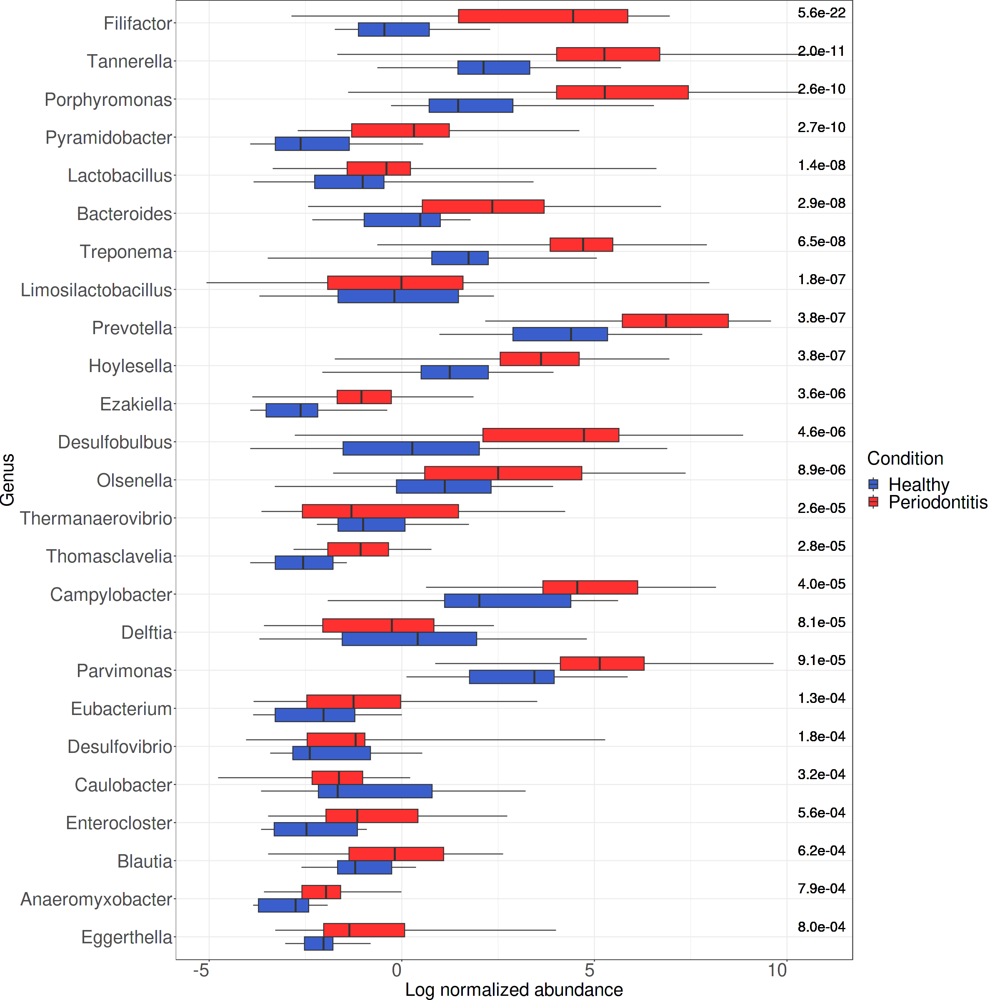

In [119]:
# Create the plot with inverted coordinates
p <- ggplot(merged_data, aes(x = reorder(genus, -qval_all), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.7), width = 0.7, coef = Inf) +
  xlab("Genus") +
  ylab("Log normalized abundance") +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 26),   # Adjust y-axis label size
    axis.text.x = element_text(hjust = 1, size = 26),   # Adjust x-axis label size
    axis.title = element_text(size = 26),   # Adjust axis title size
    legend.text = element_text(size = 26),   # Adjust legend text size
    legend.title = element_text(size = 26),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(2, 2, 2, 2),   # Adjust plot margin
    legend.position = "right"
  ) +
  coord_flip() +  # Invert the plot +
  scale_fill_manual(values = c("royalblue3", "firebrick1"))  # Set fill colors using the custom palette

# Add q-values for the Periodontitis condition and format in scientific notation
p <- p + geom_text(data = merged_data[merged_data$Condition == "Periodontitis", ],
                   aes(x = genus, y = max(Abundance), label = format(qval_all, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 7)


# Adjust the margins to accommodate the long x-axis tick labels
p <- p + theme(plot.margin = margin(0, 10, 0, 0))

# Save the plot as an image
#ggsave("genus.png", p, width = 20, height = 20, units = "in", dpi = 300)

# Display the plot
print(p)

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


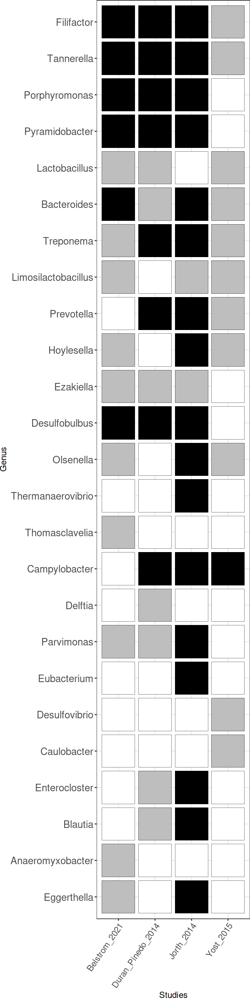

In [120]:
library(ggplot2)

# Set the plot size options
options(
  repr.plot.width = 5,   # Set the width of the plot
  repr.plot.height = 20    # Set the height of the plot
)

# Define color based on qvals
getColor <- function(qval) {
  if (qval <= 0.0001) {
    return("black")
  } else if (qval <= 0.05) {
    return("gray")
  } else {
    return("white")
  }
}

df<- subset(all_data, select = -qval_all)
df[is.na(df)] <- 1
df$genus=rownames(df)

# Reshape dataframe from wide to long format
df_long <- reshape2::melt(df, id.vars = "genus")

# Apply color based on qvals
df_long$color <- sapply(df_long$value, getColor)


library(dplyr)


#this is done to be able to reorder the species based on the qval_all
all_data2=all_data
all_data2$genus=rownames(all_data2)
df_long <- df_long %>%
  left_join(all_data2, by = "genus")

# Create the plot
plot <- ggplot(df_long, aes(x = variable, y = reorder(genus, -qval_all), fill = color)) +
  geom_tile(color = "black", width = 0.9, height = 0.9) +
  scale_fill_identity() +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 55, hjust = 1, size = 12),   # Adjust x-axis label size
    axis.title = element_text(size = 12),   # Adjust axis title size
    plot.margin = margin(0, 0, 0, 0)   # Adjust plot margin
  ) +
  labs(x = "Studies", y = "Genus") +
  guides(fill = FALSE)

# Save the plot as an image
#ggsave("genus_across_studies.png", plot, width = 5, height = 20, units = "in", dpi = 300)

print(plot)



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Warning message:
“Removed 278 rows containing non-finite values (`stat_boxplot()`).”


TableGrob (1 x 2) "arrange": 2 grobs
  z     cells    name           grob
1 1 (1-1,1-1) arrange gtable[layout]
2 2 (1-1,2-2) arrange gtable[layout]


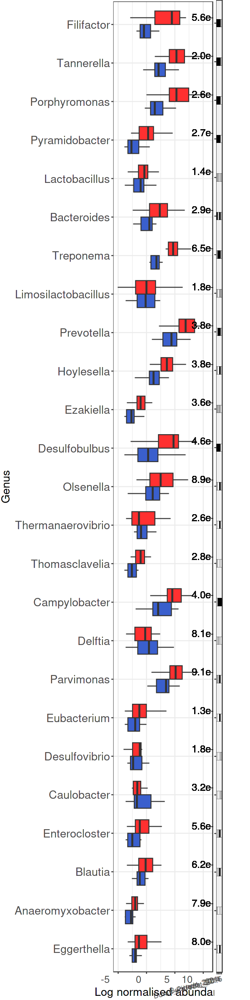

In [121]:
library(ggplot2)
library(gridExtra)
library(cowplot)


# Define a common theme for both plots
common_theme <- theme_bw() +
  theme(
    axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 0, hjust = 1, size = 12),   # Adjust x-axis label size
    axis.title = element_text(size = 14),   # Adjust axis title size
    plot.margin = margin(0, 0, 0, 0)   # Adjust plot margin
  )

# Create Plot A (Inverted plot)
# Create the plot with inverted coordinates
plot_A <- ggplot(merged_data, aes(x = reorder(genus, -qval_all), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.7), width = 0.7, outlier.shape = NA) +
  xlab("Genus") +
  ylab("Log normalised abundance") +
  common_theme +
  theme(
    axis.text.y = element_text(size = 16),   # Adjust y-axis label size
    axis.text.x = element_text(angle = 0, hjust = 2, size = 14),   # Adjust x-axis label size
    axis.title = element_text(size = 16),   # Adjust axis title size
    legend.text = element_text(size = 20),   # Adjust legend text size
    legend.title = element_text(size = 20),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(2, 2, 2, 2),   # Adjust plot margin
    legend.position = "none"
  ) +
  coord_flip()+  # Invert the plot
  scale_fill_manual(values = c("royalblue3", "firebrick1")) 

# Add q-values for the Periodontitis condition and format in scientific notation
plot_A <- plot_A + geom_text(data = merged_data[merged_data$Condition == "Periodontitis", ],
                   aes(x = genus, y = max(Abundance), label = format(qval_all, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 5)

# Create Plot B
# Create the plot
plot_B <- ggplot(df_long, aes(x = variable, y = reorder(genus, -qval_all), fill = color)) +
  geom_tile(color = "black", width = 0.9, height = 0.2) +
  scale_fill_identity() +
  theme_bw() +
  theme(
    #axis.text.y = element_text(size = 14),   # Adjust y-axis label size
    axis.text.y=element_blank(),
    axis.text.x = element_text(angle = 15, hjust = 1, size = 10),   # Adjust x-axis label size
    axis.title = element_text(size = 12), # Adjust axis title size
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    plot.margin = margin(0, 40, 0, 0)   # Adjust plot margin
  ) +
  labs(x = "Studies", y = "Species") +
  guides(fill = FALSE)

# Combine Plot A and Plot B into a single figure
combined_plot <- grid.arrange(plot_A, plot_B, ncol = 2, widths = c(6, 1))  # Adjust the widths as needed

# Save the combined plot as an image (optional) with adjusted width
#ggsave("combined_plots_Genus_low.png", combined_plot, width = 20, height = 15, units = "in", dpi = 300)
# Save the combined plot as an image (optional) with adjusted width
#ggsave("combined_plots_Genus_high.png", combined_plot, width = 20, height = 15, units = "in", dpi = 1200)

# Display the combined plot
print(combined_plot)


# Differentially transcribed virulence factor genes with Maaslin2 

In [47]:
#open the data containing all vir genes in each samples
vir_data = read.table(file             = 'VirulenceGenes/VirGenes_ALL.csv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)

vir_data_CSS = read.table(file             = 'VirGenes_CSS.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)

vir_data_log=log(vir_data_CSS)

In [43]:
head(vir_data)
head(vir_data_CSS)
head(vir_data_log)


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061608,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
AAB30711,0,0,0,0,0,0,0,0,0,0,⋯,489,8,0,40,0,0,0,4,0,0
AAC82625,0,0,0,0,0,0,3,90,18,5,⋯,0,0,6,16,9,2,3,26,13,4
AAD53408,0,0,0,0,0,0,1,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AAF34780,0,0,0,149,10,139,139,124,140,0,⋯,1034,120,4,22,0,0,1178,127,1348,114
AAF37887,32,0,0,0,3,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AAG10151,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061608,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
AAB30711,0.00,0,0,0.000000,0.00000,0.0000,0.000000,0.000000,0.00000,0.00000,⋯,976.0479,25.15723,0.00000,333.3333,0.00000,0,0.000000,15.93625,0.0000,0.00000
AAC82625,0.00,0,0,0.000000,0.00000,0.0000,16.216216,294.117647,52.63158,28.24859,⋯,0.0000,0.00000,28.57143,133.3333,58.82353,4,9.009009,103.58566,44.3686,13.15789
AAD53408,0.00,0,0,0.000000,0.00000,0.0000,5.405405,3.267974,0.00000,0.00000,⋯,0.0000,0.00000,0.00000,0.0000,0.00000,0,0.000000,0.00000,0.0000,0.00000
AAF34780,0.00,0,0,665.178571,120.48193,586.4979,751.351351,405.228758,409.35673,0.00000,⋯,2063.8723,377.35849,19.04762,183.3333,0.00000,0,3537.537538,505.97610,4600.6826,375.00000
AAF37887,153.11,0,0,0.000000,36.14458,0.0000,0.000000,0.000000,0.00000,0.00000,⋯,0.0000,0.00000,0.00000,0.0000,0.00000,0,0.000000,0.00000,0.0000,0.00000
AAG10151,0.00,0,0,4.464286,0.00000,0.0000,0.000000,0.000000,0.00000,0.00000,⋯,0.0000,0.00000,0.00000,0.0000,0.00000,0,0.000000,0.00000,0.0000,0.00000


,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061608,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAB30711,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,6.883512,3.225145,-Inf,5.809143,-Inf,-Inf,-Inf,2.768597,-Inf,-Inf
AAC82625,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,2.786012,5.683980,3.963316,3.341043,⋯,-Inf,-Inf,3.352407,4.892852,4.074542,1.386294,2.198225,4.640399,3.792532,2.577022
AAD53408,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,1.687399,1.184170,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
AAF34780,-Inf,-Inf,-Inf,6.500056,4.791500,6.374169,6.621873,6.004452,6.014587,-Inf,⋯,7.632339,5.933196,2.946942,5.211306,-Inf,-Inf,8.171186,6.226489,8.433960,5.926926
AAF37887,5.031157,-Inf,-Inf,-Inf,3.587527,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf
AAG10151,-Inf,-Inf,-Inf,1.496109,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,⋯,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf,-Inf


In [48]:
rownames(meta) <- meta$External_ID
head(meta)


,External_ID,Condition,Study,Library_size,Host_age,Host_sex,Smoking
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
Metatranscriptome_Healthy1,Metatranscriptome_Healthy1,Healthy,Duran-Pinedo_2014,2878058,NA,,no
Metatranscriptome_Healthy2,Metatranscriptome_Healthy2,Healthy,Duran-Pinedo_2014,106787,NA,,no
Metatranscriptome_Healthy3,Metatranscriptome_Healthy3,Healthy,Duran-Pinedo_2014,154801,NA,,no
Metatranscriptome_Healthy4,Metatranscriptome_Healthy4,Healthy,Duran-Pinedo_2014,522921,NA,,no
Metatranscriptome_Healthy5,Metatranscriptome_Healthy5,Healthy,Duran-Pinedo_2014,785139,NA,,no
Metatranscriptome_Healthy6,Metatranscriptome_Healthy6,Healthy,Duran-Pinedo_2014,619417,NA,,no


In [37]:
library(Maaslin2); packageVersion("Maaslin2") 

[1] ‘1.12.0’

In [180]:
#Maaslin for virulence factor genes with CSS normalization and NEGBIN model
Maaslin2(
    vir_data,
    meta,
    output = "VirulenceGenes/VirGenes_maaslin2_NEGBIN_minprev_25",
    min_abundance = 0.0,
    min_prevalence = 0.25,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    #max_significance = 0.25,
    random_effects = c('Study') ,
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 8,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100,
    reference= c("Study","Belstrom_2021")
   
)

[1] "Creating output folder"
[1] "Creating output figures folder"
2023-10-30 00:23:59 INFO::Writing function arguments to log file
2023-10-30 00:23:59 INFO::Verifying options selected are valid
2023-10-30 00:23:59 INFO::Determining format of input files
2023-10-30 00:23:59 INFO::Input format is data samples as columns and metadata samples as rows
2023-10-30 00:23:59 INFO::Formula for random effects: expr ~ (1 | Study)
2023-10-30 00:23:59 INFO::Formula for fixed effects: expr ~  Condition
2023-10-30 00:23:59 INFO::Filter data based on min abundance and min prevalence
2023-10-30 00:23:59 INFO::Total samples in data: 54
2023-10-30 00:23:59 INFO::Min samples required with min abundance for a feature not to be filtered: 13.500000
2023-10-30 00:23:59 INFO::Total filtered features: 719
2023-10-30 00:23:59 INFO::Filtered feature names from abundance and prevalence filtering: AAB30711, AAD53408, AAF37887, AAG10151, AAG18638, AAM90673, AAN75204, AAP42187, ABL73998, ACJ76902, BAC98831, BAD91216, 

Default value being used.



2023-10-30 00:24:00 INFO::Applying z-score to standardize continuous metadata
2023-10-30 00:24:00 INFO::Running selected transform method: NONE
2023-10-30 00:24:00 INFO::Running selected analysis method: NEGBIN
2023-10-30 00:24:00 INFO::Creating cluster of 8 R processes
2023-10-30 00:24:09 INFO::Counting total values for each feature
2023-10-30 00:24:09 INFO::Writing residuals to file VirulenceGenes/TEST/residuals.rds
2023-10-30 00:24:09 INFO::Writing fitted values to file VirulenceGenes/TEST/fitted.rds
2023-10-30 00:24:09 INFO::Writing extracted random effects to file VirulenceGenes/TEST/ranef.rds
2023-10-30 00:24:09 INFO::Writing all results to file (ordered by increasing q-values): VirulenceGenes/TEST/all_results.tsv
2023-10-30 00:24:09 INFO::Writing the significant results (those which are less than or equal to the threshold of 0.250000 ) to file (ordered by increasing q-values): VirulenceGenes/TEST/significant_results.tsv
2023-10-30 00:24:09 INFO::Writing heatmap of significant re

feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
WP_005874678,Condition,Periodontitis,7.1897679,1.3822041,1.975070e-07,ConditionPeriodontitis,3.910638e-05,54,19
AAC82625,Condition,Periodontitis,4.5960464,1.0030013,4.599033e-06,ConditionPeriodontitis,4.553043e-04,54,24
WP_000733059,Condition,Periodontitis,1.5625251,0.4222611,2.152794e-04,ConditionPeriodontitis,1.420844e-02,54,43
WP_000733058,Condition,Periodontitis,1.3972975,0.3971828,4.347781e-04,ConditionPeriodontitis,2.152152e-02,54,48
WP_000260656,Condition,Periodontitis,1.6854740,0.4961616,6.812238e-04,ConditionPeriodontitis,2.697646e-02,54,47
WP_000733056,Condition,Periodontitis,1.3272647,0.4337058,2.211239e-03,ConditionPeriodontitis,5.472818e-02,54,46
WP_002681434,Condition,Periodontitis,2.9355118,0.9415031,1.821451e-03,ConditionPeriodontitis,5.472818e-02,54,19
WP_006154814,Condition,Periodontitis,0.9130968,0.2977800,2.166916e-03,ConditionPeriodontitis,5.472818e-02,54,53
WP_000022832,Condition,Periodontitis,0.9029872,0.3287821,6.024206e-03,ConditionPeriodontitis,1.307893e-01,54,48


In [49]:
#open the data containing all sign differentially abundant vir genes based on Maaslin2
sig_data = read.table(file             = 'VirulenceGenes/VirGenes_maaslin2_NEGBIN_minprev_25/significant_results_filtered_qval0.05.csv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)

sig_data

,metadata,value,coef,stderr,N,N.not.0,pval,qval,Organism,Gene,NCBI_ACCESSION,Gene_name
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
WP_005874678,Condition,Periodontitis,7.189768,1.3822041,54,19,1.975070e-07,3.910638e-05,Porphyromonas gingivalis,"TonB-dependent receptor (WP_005874678, Porphyromonas gingivalis)",WP_005874678,TonB-dependent receptor
AAC82625,Condition,Periodontitis,4.596046,1.0030013,54,24,4.599033e-06,4.553043e-04,Tannerella forsythia,"surface antigen BspA (AAC82625, Tannerella forsythia)",AAC82625,surface antigen BspA
WP_000733059,Condition,Periodontitis,1.562525,0.4222611,54,43,2.152794e-04,1.420844e-02,Streptococcus pneumoniae,"metal ABC transporter substrate-binding lipoprotein/adhesin PsaA (WP_000733059, Streptococcus pneumoniae)",WP_000733059,adhesin PsaA
WP_000260656,Condition,Periodontitis,1.685474,0.4961616,54,47,6.812238e-04,2.697646e-02,Streptococcus,"type I glyceraldehyde-3-phosphate dehydrogenase (WP_000260656, Streptococcus)",WP_000260656,type I glyceraldehyde-3-phosphate dehydrogenase


In [50]:
# Saving the gene ID and encoded protein as dictionary
gene_dict <- as.list(sig_data$Gene_name)
names(gene_dict) <- rownames(sig_data)
gene_dict


$WP_005874678
[1] "TonB-dependent receptor"

$AAC82625
[1] "surface antigen BspA "

$WP_000733059
[1] "adhesin PsaA"

$WP_000260656
[1] "type I glyceraldehyde-3-phosphate dehydrogenase "

In [51]:
# Saving the gene ID and encoded protein as dictionary
gene_dict <- as.list(sig_data$Gene)
names(gene_dict) <- rownames(sig_data)
gene_dict

#Add an extra column same as rownames
sig_data$Protein <- rownames(sig_data) 
head(sig_data)

#list of significantly transcribed virulence factors
sig_list <- as.list(sig_data$Protein)
sig_list

$WP_005874678
[1] "TonB-dependent receptor (WP_005874678, Porphyromonas gingivalis)"

$AAC82625
[1] "surface antigen BspA (AAC82625, Tannerella forsythia)"

$WP_000733059
[1] "metal ABC transporter substrate-binding lipoprotein/adhesin PsaA (WP_000733059, Streptococcus pneumoniae)"

$WP_000260656
[1] "type I glyceraldehyde-3-phosphate dehydrogenase (WP_000260656, Streptococcus)"

,metadata,value,coef,stderr,N,N.not.0,pval,qval,Organism,Gene,NCBI_ACCESSION,Gene_name,Protein
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
WP_005874678,Condition,Periodontitis,7.189768,1.3822041,54,19,1.975070e-07,3.910638e-05,Porphyromonas gingivalis,"TonB-dependent receptor (WP_005874678, Porphyromonas gingivalis)",WP_005874678,TonB-dependent receptor,WP_005874678
AAC82625,Condition,Periodontitis,4.596046,1.0030013,54,24,4.599033e-06,4.553043e-04,Tannerella forsythia,"surface antigen BspA (AAC82625, Tannerella forsythia)",AAC82625,surface antigen BspA,AAC82625
WP_000733059,Condition,Periodontitis,1.562525,0.4222611,54,43,2.152794e-04,1.420844e-02,Streptococcus pneumoniae,"metal ABC transporter substrate-binding lipoprotein/adhesin PsaA (WP_000733059, Streptococcus pneumoniae)",WP_000733059,adhesin PsaA,WP_000733059
WP_000260656,Condition,Periodontitis,1.685474,0.4961616,54,47,6.812238e-04,2.697646e-02,Streptococcus,"type I glyceraldehyde-3-phosphate dehydrogenase (WP_000260656, Streptococcus)",WP_000260656,type I glyceraldehyde-3-phosphate dehydrogenase,WP_000260656


[[1]]
[1] "WP_005874678"

[[2]]
[1] "AAC82625"

[[3]]
[1] "WP_000733059"

[[4]]
[1] "WP_000260656"

Warning message:
“Removed 83 rows containing non-finite values (`stat_boxplot()`).”


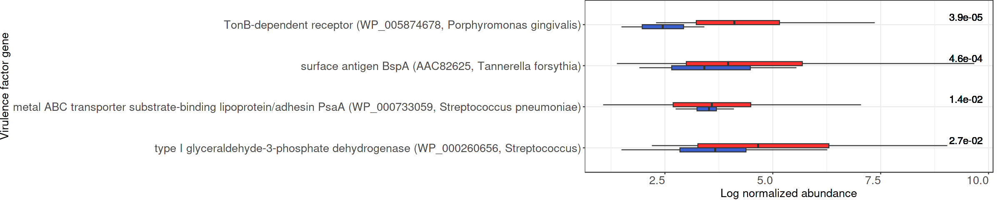

In [53]:
# Load the required libraries
library(ggplot2)
library(dplyr)

#sig_data$Gene <- rownames(sig_data)
statistics <- select(sig_data, Protein, qval)
rownames(statistics) <- NULL

# References of the significantly abundant virulence factor genes
sig_list <- as.list(rownames(sig_data))
# Keep rows with row names in sig_list
filtered_data <- vir_data_log[row.names(vir_data_log) %in% sig_list, ]
filtered_data_reordered <- filtered_data[match(sig_list, rownames(filtered_data)), ]

# Add a column with gene names to the filtered_data dataframe
filtered_data_reordered$Protein <- rownames(filtered_data_reordered)

# Reshape the filtered_data into long format for plotting
filtered_data_long <- reshape2::melt(filtered_data_reordered, id.vars = c("Protein"), variable.name = "External_ID", value.name = "Abundance")

# Merge the filtered_data_long with the sample metadata
merged_data <- merge(filtered_data_long, meta, by = "External_ID", all.x = TRUE)

# Order the gene names
merged_data <- merged_data %>%
  arrange(Protein)

# Merge the gene_metadata with the merged_data
merged_data <- merge(merged_data, statistics, by = "Protein")

# change naming of the genes
merged_data2=merged_data
for (i in 1:length(gene_dict)){merged_data2 <- replace(merged_data2, merged_data2 == names(gene_dict[i]), gene_dict[i])}
#change the type of the values in the column Protein to chr
merged_data2$Protein <- as.character(merged_data2$Protein)
#remove all characters after '(', meaning remove the NCBI accession
#merged_data2$Protein <- sub("\\s*\\(.*", "", merged_data2$Protein)

###Inverted plot
# Set the plot size options
options(
  repr.plot.width = 20,   # Set the width of the plot
  repr.plot.height = 4   # Set the height of the plot
)

# Load the required libraries
library(ggplot2)
library(grid)

# Create the plot with inverted coordinates
p <- ggplot(merged_data2, aes(x = reorder(Protein, -qval), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.2), width = 0.2, outlier.shape = NA) +
  xlab("Virulence factor gene") +
  ylab("Log normalized abundance") +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 16),   # Adjust y-axis label size
    axis.text.x = element_text(hjust = 1, size = 16),   # Adjust x-axis label size
    axis.title = element_text(size = 16),   # Adjust axis title size
    legend.text = element_text(size = 16),   # Adjust legend text size
    legend.title = element_text(size = 16),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(0, 0, 0, 0),   # Adjust plot margin
    legend.position = "none"
  ) +
  coord_flip() + # Invert the plot
  scale_fill_manual(values = c("royalblue3", "firebrick1"))   # Set fill colors using the custom palette
# Add q-values for the Periodontitis condition and format in scientific notation
p <- p + geom_text(data = merged_data2[merged_data2$Condition == "Periodontitis", ],
                   aes(x = Protein, y = max(Abundance)-0.2, label = format(qval, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 5)

# Add stars for q-values lower than 0.01
#p <- p + geom_text(data = merged_data2[merged_data2$qval < 0.01, ],
#                   aes(x = Protein, y = max(Abundance), label = "*"),
#                  vjust = -0.5, hjust = 0.5, size = 10, color = "red")

# Adjust the margins to accommodate the long x-axis tick labels
p <- p + theme(plot.margin = margin(0, 10, 0, 0))

# Save the plot as an image
#ggsave("Virulence_factors_inverted_low_nolabel.png", p, width =20, height = 5, units = "in", dpi = 300)
#ggsave("Virulence_factors_inverted_high_nolabel.png", p, width =20, height = 5, units = "in", dpi = 1200)


# Display the plot
print(p)



# Differential abundance analysis - Gene Families


In [16]:
#Open the genefamilies results from HUMAnN2
genes <- fread('./ALL_genefamilies.tsv', header = TRUE, sep = "\t")
genes$Gene_family=genes[,1]
#head(genes)

#Keep only the rows with the total counts for each gene family for each sample. Remove rownames that have "UNMAPPED","UNINTEGRATED" and | 
genes <- genes[!grepl("UNMAPPED|UNGROUPED", genes$Gene_family) & !grepl("\\|", genes$Gene_family), ]

#convert to dataframe
genes=as.data.frame(genes)
class(genes)
#dim(genes)
#head(genes)

rownames(genes)= genes$Gene_family
#head(genes)

# Remove the first column
genes <- genes[, -1]
genes <- genes[, -ncol(genes)]

# put the correct sample names
colnames(genes)=rownames(meta)

#remove columns(samples) with colsum=0
genes <- genes[, colSums(genes) != 0]

dim(genes)
head(genes)

# save the dataframe
#write.table(genes, file = "Gene_file_UniRef90.tsv", sep = "\t", quote = FALSE)

[1] "data.frame"

[1] 319040     54

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,8.394935,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [58]:
geneFamilies <- fread('/mnt/raid1/armen/Schinos/META-ANALYSIS/ALL/Fungi/Gene_file_UniRef90.tsv')
geneFamilies <- as.data.frame(geneFamilies)
rownames(geneFamilies)=geneFamilies$Gene_family
geneFamilies$Gene_family <- NULL
dim(geneFamilies)
head(geneFamilies)



[1] 319040     54

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,8.394935,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0.000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [59]:
#CSS normalized abundance of gene families data
geneFamilies_css= read.table(file='Gene_file_UniRef90_CSS.tsv', 
                               header           = TRUE, 
                               sep              = "\t", 
                               row.names=1,
                               stringsAsFactors = FALSE)
head(geneFamilies_css)

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,⋯,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0.00000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0.00000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0.00000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,0.01243895,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0.00000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0.00000000,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [147]:
library(Maaslin2)
#Maaslin for gene families with CSS normalization and NEGBIN model
Maaslin2(
    geneFamilies,
    meta,
    output = "GeneFamilies/GeneFamilies_NEGBIN_minprev_25",
    min_abundance = 0.0,
    min_prevalence = 0.25,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    #max_significance = 0.25,
    random_effects = c('Study') ,
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 40,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100,
    reference= c("Study","Belstrom_2021")
   
)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Default value being used.



2023-10-29 21:39:54 INFO::Applying z-score to standardize continuous metadata
2023-10-29 21:39:54 INFO::Running selected transform method: NONE
2023-10-29 21:39:54 INFO::Running selected analysis method: ZINB
2023-10-29 21:39:54 INFO::Creating cluster of 40 R processes
2023-10-29 21:48:31 INFO::Counting total values for each feature
2023-10-29 21:48:36 INFO::Writing residuals to file GeneFamilies/GeneFamilies_ZINB_minprev_25/residuals.rds
2023-10-29 21:48:36 INFO::Writing fitted values to file GeneFamilies/GeneFamilies_ZINB_minprev_25/fitted.rds
2023-10-29 21:48:36 INFO::Writing extracted random effects to file GeneFamilies/GeneFamilies_ZINB_minprev_25/ranef.rds
2023-10-29 21:48:36 INFO::Writing all results to file (ordered by increasing q-values): GeneFamilies/GeneFamilies_ZINB_minprev_25/all_results.tsv
2023-10-29 21:48:36 INFO::Writing the significant results (those which are less than or equal to the threshold of 0.250000 ) to file (ordered by increasing q-values): GeneFamilies/Gen

Warning message in xtfrm.data.frame(x):
“cannot xtfrm data frames”


[1] "There is not enough metadata in the associations to create a heatmap plot. Please review the associations in text output file."
2023-10-29 21:48:37 INFO::Writing association plots (one for each significant association) to output folder: GeneFamilies/GeneFamilies_ZINB_minprev_25
2023-10-29 21:48:37 INFO::Plotting associations from most to least significant, grouped by metadata
2023-10-29 21:48:37 INFO::Plotting data for metadata number 1, Condition
2023-10-29 21:48:37 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1Q8VFT9
2023-10-29 21:48:37 INFO::Creating boxplot for categorical data, Condition vs UniRef90_UPI0009428330
2023-10-29 21:48:37 INFO::Creating boxplot for categorical data, Condition vs UniRef90_T2NCD3
2023-10-29 21:48:37 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M9R9
2023-10-29 21:48:37 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U2L5Q5
2023-10-29 21:48:38 INFO::Creating boxplot for categorical dat

2023-10-29 21:48:43 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M9R7
2023-10-29 21:48:43 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2A6EBH5
2023-10-29 21:48:43 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1V5I6Y9
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A7G9R9
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PMN6
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G5SRK6
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A6KYI5
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0F638
2023-10-29 21:48:44 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M779
2023-10-29 21:48:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0X3
2023-10-29 21:48:45 INFO::Creating boxplot for c

2023-10-29 21:48:50 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G1VBM2
2023-10-29 21:48:50 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0Z3
2023-10-29 21:48:50 INFO::Creating boxplot for categorical data, Condition vs UniRef90_W6P0L2
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PNT4
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PNW3
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HN81
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U1Q5E5
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PMN5
2023-10-29 21:48:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M840
2023-10-29 21:48:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9D656
2023-10-29 21:48:52 INFO::Creating boxplot for categoric

2023-10-29 21:48:57 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PTL4
2023-10-29 21:48:57 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A3E4UA60
2023-10-29 21:48:57 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A6LEH8
2023-10-29 21:48:57 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SJU9
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7NE91
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V2Z3W3
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9F3N2
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U2ITE7
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0S2KIC6
2023-10-29 21:48:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A4VYR8
2023-10-29 21:48:59 INFO::Creating boxplot for c

2023-10-29 21:49:04 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0H9L7
2023-10-29 21:49:04 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E8JTP3
2023-10-29 21:49:04 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DDI4
2023-10-29 21:49:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2L1GQD5
2023-10-29 21:49:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0H7B9
2023-10-29 21:49:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A6LEJ2
2023-10-29 21:49:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0S3ULS5
2023-10-29 21:49:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SKE9
2023-10-29 21:49:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7NG22
2023-10-29 21:49:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2S4EWH0
2023-10-29 21:49:06 INFO::Creating boxplot for c

2023-10-29 21:49:11 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9D878
2023-10-29 21:49:11 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DAM5
2023-10-29 21:49:11 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SIF5
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPA6
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0B8
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133QR51
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A174K0Z6
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A223ZWJ6
2023-10-29 21:49:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C9LVX3
2023-10-29 21:49:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133P5C0
2023-10-29 21:49:13 INFO::Creating boxpl

2023-10-29 21:49:18 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G1VFX1
2023-10-29 21:49:18 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R6EWG9
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U1RKJ6
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0IPM9
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S2I6
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPA9
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8H7U1
2023-10-29 21:49:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D5EYY8
2023-10-29 21:49:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0R1
2023-10-29 21:49:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9FLV2
2023-10-29 21:49:20 INFO::Creating boxplot for c

2023-10-29 21:49:25 INFO::Creating boxplot for categorical data, Condition vs UniRef90_J1HNE9
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9PQZ9
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A134ADE5
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q7P2L2
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U2IZ31
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139NBV9
2023-10-29 21:49:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M9S0
2023-10-29 21:49:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9F980
2023-10-29 21:49:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SMQ2
2023-10-29 21:49:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RIF6
2023-10-29 21:49:27 INFO::Creating boxplot for c

2023-10-29 21:49:32 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DC13
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A098YG50
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S064
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A7ACK1
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PNM7
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4MA17
2023-10-29 21:49:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0H9Q5
2023-10-29 21:49:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9EMY8
2023-10-29 21:49:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CQG7
2023-10-29 21:49:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M9D9
2023-10-29 21:49:34 INFO::Creating boxplot for categ

2023-10-29 21:49:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0H7U6
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HWT5
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139PQW5
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PP96
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SL48
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1R3T7N6
2023-10-29 21:49:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SMF5
2023-10-29 21:49:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_L9PRA6
2023-10-29 21:49:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_S5ZWC7
2023-10-29 21:49:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A134AJE6
2023-10-29 21:49:41 INFO::Creating boxplot for c

2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PTG3
2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G1VEQ7
2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M9S1
2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R7LD01
2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_W2CHR8
2023-10-29 21:49:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G1VAY0
2023-10-29 21:49:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RHI3
2023-10-29 21:49:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9P4F3
2023-10-29 21:49:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0N3
2023-10-29 21:49:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S1A1
2023-10-29 21:49:48 INFO::Creating boxplot for categ

2023-10-29 21:49:54 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0IJ98
2023-10-29 21:49:54 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G5GIE0
2023-10-29 21:49:54 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7NB71
2023-10-29 21:49:54 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S1I8
2023-10-29 21:49:54 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PNR5
2023-10-29 21:49:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V2Y5H7
2023-10-29 21:49:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPA3
2023-10-29 21:49:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9P6Q4
2023-10-29 21:49:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PSV7
2023-10-29 21:49:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8IP83
2023-10-29 21:49:55 INFO::Creating boxplot for categoric

2023-10-29 21:50:01 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139N063
2023-10-29 21:50:01 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0QHL5
2023-10-29 21:50:01 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CKX6
2023-10-29 21:50:01 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9EB74
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0K1NKR0
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HT66
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F5TBD7
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133ZRF1
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F2KTS4
2023-10-29 21:50:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_G8UPP7
2023-10-29 21:50:03 INFO::Creating boxplot f

2023-10-29 21:50:08 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V8CQ52
2023-10-29 21:50:08 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A5TUA2
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0F5S8
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPB5
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U2RFU4
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9ERU5
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R6W2L9
2023-10-29 21:50:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PN66
2023-10-29 21:50:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4MAX1
2023-10-29 21:50:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7NB27
2023-10-29 21:50:10 INFO::Creating boxplot for categorical d

2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_UPI00036107CD
2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0X6
2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8IRC9
2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2R4KIE5
2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HT65
2023-10-29 21:50:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R5F9U5
2023-10-29 21:50:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U2II21
2023-10-29 21:50:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CJ95
2023-10-29 21:50:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPB6
2023-10-29 21:50:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F5TEB2
2023-10-29 21:50:17 INFO::Creating boxplot fo

2023-10-29 21:50:23 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A246ESS9
2023-10-29 21:50:23 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0F714
2023-10-29 21:50:23 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133P7Q5
2023-10-29 21:50:23 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0H4Y7
2023-10-29 21:50:23 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0IPC7
2023-10-29 21:50:24 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RGG8
2023-10-29 21:50:24 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139MI75
2023-10-29 21:50:24 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8N7K9
2023-10-29 21:50:24 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D2ES31
2023-10-29 21:50:24 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CFE6
2023-10-29 21:50:24 INFO::Creating boxplot for c

2023-10-29 21:50:30 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SKI4
2023-10-29 21:50:30 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RIG1
2023-10-29 21:50:30 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1D3UQ26
2023-10-29 21:50:30 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SIE9
2023-10-29 21:50:31 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S1V8
2023-10-29 21:50:31 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4CMC8
2023-10-29 21:50:31 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7NGJ5
2023-10-29 21:50:31 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DCM6
2023-10-29 21:50:31 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DIH9
2023-10-29 21:50:32 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DKH9
2023-10-29 21:50:32 INFO::Creating boxplot for categ

2023-10-29 21:50:38 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D6GS20
2023-10-29 21:50:38 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R6E4P6
2023-10-29 21:50:38 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139N030
2023-10-29 21:50:38 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PSG3
2023-10-29 21:50:38 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D5RBV1
2023-10-29 21:50:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R9RER0
2023-10-29 21:50:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0IKT4
2023-10-29 21:50:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8IRU2
2023-10-29 21:50:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4CU28
2023-10-29 21:50:39 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DLQ5
2023-10-29 21:50:39 INFO::Creating boxplot for categoric

2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A124EFM9
2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PMV7
2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D5REA8
2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SLQ7
2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9FBD0
2023-10-29 21:50:45 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A117J299
2023-10-29 21:50:46 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PMX2
2023-10-29 21:50:46 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PRE6
2023-10-29 21:50:46 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RR80
2023-10-29 21:50:46 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0I013
2023-10-29 21:50:46 INFO::Creating boxplot for c

2023-10-29 21:50:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0B4S0J4
2023-10-29 21:50:51 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SJR2
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8R6A2
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_W2D0R1
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0P0N851
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HTV5
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C4Z055
2023-10-29 21:50:52 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E1LV52
2023-10-29 21:50:53 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A140PQ79
2023-10-29 21:50:53 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0S2ZP67
2023-10-29 21:50:53 INFO::Creating boxplot f

2023-10-29 21:50:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DKU4
2023-10-29 21:50:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_J6HB39
2023-10-29 21:50:58 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RGH1
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_UPI0004297032
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R6XBM0
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RRU6
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F2CHG3
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RE42
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133NDP6
2023-10-29 21:50:59 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RIF8
2023-10-29 21:51:00 INFO::Creating boxplot for ca

2023-10-29 21:51:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V8CMM1
2023-10-29 21:51:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RGV1
2023-10-29 21:51:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_N6WAT0
2023-10-29 21:51:05 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8AWY1
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CJ99
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4CYE1
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E6K7K7
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1W7LZZ8
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1PJV3
2023-10-29 21:51:06 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PTE9
2023-10-29 21:51:07 INFO::Creating boxplot for categoric

2023-10-29 21:51:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C9LWC0
2023-10-29 21:51:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M7V7
2023-10-29 21:51:12 INFO::Creating boxplot for categorical data, Condition vs UniRef90_L1M995
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8AUV1
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RFG9
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_T2N8K7
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D5RB70
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2A6E8V2
2023-10-29 21:51:13 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4M8U8
2023-10-29 21:51:14 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RHH9
2023-10-29 21:51:14 INFO::Creating boxplot for categoric

2023-10-29 21:51:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_I0TAB9
2023-10-29 21:51:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CFG6
2023-10-29 21:51:19 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8IR73
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8IS17
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A139P648
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8NGP7
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CQB6
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F2CE32
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8SLD5
2023-10-29 21:51:20 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R5M1J0
2023-10-29 21:51:21 INFO::Creating boxplot for categoric

2023-10-29 21:51:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8AZ08
2023-10-29 21:51:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DIF6
2023-10-29 21:51:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1D8I7
2023-10-29 21:51:26 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D2ERV7
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D7N9S8
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E6MS72
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0FFL6
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A134ADH4
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1D3ULQ5
2023-10-29 21:51:27 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A8AXE4
2023-10-29 21:51:28 INFO::Creating boxplot for categ

2023-10-29 21:51:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8K7C8
2023-10-29 21:51:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C3JC11
2023-10-29 21:51:33 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A140PS69
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RF12
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F6UL03
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A100YMY9
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1S1MIF1
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A3E4UBS7
2023-10-29 21:51:34 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A3CPX8
2023-10-29 21:51:35 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F6TZJ6
2023-10-29 21:51:35 INFO::Creating boxplot f

2023-10-29 21:51:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DIV3
2023-10-29 21:51:40 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E1KT12
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0FBT7
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F2CBL1
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_J7SJ51
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8R6D9
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RDN7
2023-10-29 21:51:41 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RIH3
2023-10-29 21:51:42 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V8BUI3
2023-10-29 21:51:42 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A5TTW4
2023-10-29 21:51:42 INFO::Creating boxplot for categorical d

2023-10-29 21:51:47 INFO::Creating boxplot for categorical data, Condition vs UniRef90_M2CW83
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_C8PPR0
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0A8UWP7
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9ECZ4
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0E9ETB8
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0H5B2W5
2023-10-29 21:51:48 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0ILW8
2023-10-29 21:51:49 INFO::Creating boxplot for categorical data, Condition vs UniRef90_R6FGN0
2023-10-29 21:51:49 INFO::Creating boxplot for categorical data, Condition vs UniRef90_S3MDT9
2023-10-29 21:51:49 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1CHW8
2023-10-29 21:51:49 INFO::Creating boxplot f

2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RG42
2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2G8I461
2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_W2CH75
2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_V1D5F1
2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1X1IPI5
2023-10-29 21:51:55 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4CV09
2023-10-29 21:51:56 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RVJ3
2023-10-29 21:51:56 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DCH5
2023-10-29 21:51:56 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DDL3
2023-10-29 21:51:56 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F0F7H7
2023-10-29 21:51:56 INFO::Creating boxplot for categ

2023-10-29 21:52:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U1RID5
2023-10-29 21:52:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A0M4RRQ1
2023-10-29 21:52:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133S531
2023-10-29 21:52:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RSZ5
2023-10-29 21:52:02 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RVQ7
2023-10-29 21:52:03 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DH44
2023-10-29 21:52:03 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A1Q8X7E4
2023-10-29 21:52:03 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A255R8H9
2023-10-29 21:52:03 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F9DIN9
2023-10-29 21:52:03 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D5RAC1
2023-10-29 21:52:03 INFO::Creating boxplot f

2023-10-29 21:52:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DHF3
2023-10-29 21:52:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A2C6B049
2023-10-29 21:52:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D9RTU5
2023-10-29 21:52:09 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q7P896
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A7HZL6
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_B9D1P2
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_D4CRV4
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E6MP98
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F3SHM5
2023-10-29 21:52:10 INFO::Creating boxplot for categorical data, Condition vs UniRef90_F5TAG4
2023-10-29 21:52:11 INFO::Creating boxplot for categoric

2023-10-29 21:52:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_H1HT83
2023-10-29 21:52:16 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q04LT6
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_T0TMD9
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_U1QN67
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_X8ISF0
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A3CMY1
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_E0DEI6
2023-10-29 21:52:17 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RDV3
2023-10-29 21:52:18 INFO::Creating boxplot for categorical data, Condition vs UniRef90_Q8RH44
2023-10-29 21:52:18 INFO::Creating boxplot for categorical data, Condition vs UniRef90_A0A133NX92
2023-10-29 21:52:18 INFO::Creating boxplot for categoric

feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
UniRef90_A0A1Q8VFT9,Condition,Periodontitis,1.581061,0.2234645,1.492124e-12,ConditionPeriodontitis,2.212521e-08,54,17
UniRef90_UPI0009428330,Condition,Periodontitis,4.840057,0.8431322,9.436043e-09,ConditionPeriodontitis,6.995882e-05,54,20
UniRef90_T2NCD3,Condition,Periodontitis,4.722413,0.8640094,4.610912e-08,ConditionPeriodontitis,2.279020e-04,54,23
UniRef90_D4M9R9,Condition,Periodontitis,3.943258,0.7423539,1.085299e-07,ConditionPeriodontitis,4.023204e-04,54,21
UniRef90_U2L5Q5,Condition,Periodontitis,3.097437,0.6151821,4.778680e-07,ConditionPeriodontitis,1.417165e-03,54,28
UniRef90_D4M7A9,Condition,Periodontitis,3.419784,0.6910506,7.472094e-07,ConditionPeriodontitis,1.660634e-03,54,20
UniRef90_M2BDX0,Condition,Periodontitis,3.701135,0.7493206,7.839520e-07,ConditionPeriodontitis,1.660634e-03,54,22
UniRef90_D4M9R8,Condition,Periodontitis,3.758323,0.7752308,1.247094e-06,ConditionPeriodontitis,2.054656e-03,54,19
UniRef90_R5M7M5,Condition,Periodontitis,2.969542,0.6115164,1.197624e-06,ConditionPeriodontitis,2.054656e-03,54,20


In [60]:
#Openning the Maaslin results
# The protein name encoded by the gene families that are differentially abundant are added manually
maaslin2_all = read.table(file='./GeneFamilies/GeneFamilies_UNIREF90_NEGBIN_minprev_25_Rstudy/significant_results_filtered.csv', 
                               header           = TRUE, 
                               sep              = "\t", 
                               row.names=1,
                               stringsAsFactors = FALSE)

dim(maaslin2_all)
head(maaslin2_all, 11)

[1] 52 12

,metadata,value,coef,stderr,N,N.not.0,pval,qval,Protein,Gene,Inclusion,Origin
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
UniRef90_C0E5X3,Condition,Periodontitis,-0.3078866,0.0358801,54,16,9.406455e-18,1.413038e-13,"LPXTG-motif cell wall anchor domain protein (UniRef90_C0E5X3, Corynebacterium)",,yes,Corynebacterium
UniRef90_C7M4E1,Condition,Periodontitis,1.0284594,0.1716965,54,15,2.098627e-09,1.576279e-05,"Small ribosomal subunit protein uS12 (UniRef90_C7M4E1, Capnocytophaga)",,no,Capnocytophaga
UniRef90_G6C0X3,Condition,Periodontitis,1.2832915,0.2169967,54,22,3.341504e-09,1.673203e-05,"Transketolase signature 1 domain-containing (UniRef90_G6C0X3, Fusobacterium)",,yes,Fusobacterium
UniRef90_D4M9R9,Condition,Periodontitis,3.9432576,0.7423539,54,21,1.085299e-07,2.329052e-04,"Glycine/sarcosine/betaine reductase component B subunits (UniRef90_D4M9R9, Fretibacterium)",,yes,Fretibacterium
UniRef90_D4S508,Condition,Periodontitis,1.2866514,0.2417261,54,14,1.022008e-07,2.329052e-04,"Secreted protein (UniRef90_D4S508, Selenomonas)",,no,Selenomonas
UniRef90_F9PIR7,Condition,Periodontitis,1.0455326,0.2028568,54,25,2.549304e-07,4.786955e-04,"ABC transporter, ATP-binding protein (UniRef90_F9PIR7, Actinomyces)",,yes,Actinomyces
UniRef90_U2L5Q5,Condition,Periodontitis,3.0974367,0.6151820,54,28,4.778686e-07,7.976159e-04,"Type VI secretion system needle protein Hcp (UniRef90_U2L5Q5, Prevotella)",,yes,Prevotella
UniRef90_D4M7A9,Condition,Periodontitis,3.4197836,0.6910506,54,20,7.472094e-07,9.813757e-04,"S-layer homology domain (UniRef90_D4M7A9, Fretibacterium)",,yes,Fretibacterium
UniRef90_E8JUY6,Condition,Periodontitis,-0.5287695,0.1068467,54,29,7.464893e-07,9.813757e-04,"SPFH/Band 7/PHB domain protein (UniRef90_K8MUM0, Streptococcus)",,yes,Streptococcus


In [61]:
# Saving the gene ID and encoded protein as dictionary
gene_dict <- as.list(maaslin2_all$Protein)
names(gene_dict) <- rownames(maaslin2_all)
gene_dict

#Add an extra column same as rownames
maaslin2_all$Gene <- rownames(maaslin2_all) 
head(maaslin2_all)

#list of significantly transcribed virulence factors
sig_list <- as.list(maaslin2_all$Gene)
sig_list

$UniRef90_C0E5X3
[1] "LPXTG-motif cell wall anchor domain protein (UniRef90_C0E5X3, Corynebacterium)"

$UniRef90_C7M4E1
[1] "Small ribosomal subunit protein uS12 (UniRef90_C7M4E1, Capnocytophaga)"

$UniRef90_G6C0X3
[1] "Transketolase signature 1 domain-containing (UniRef90_G6C0X3, Fusobacterium)"

$UniRef90_D4M9R9
[1] "Glycine/sarcosine/betaine reductase component B subunits (UniRef90_D4M9R9, Fretibacterium)"

$UniRef90_D4S508
[1] "Secreted protein (UniRef90_D4S508, Selenomonas)"

$UniRef90_F9PIR7
[1] "ABC transporter, ATP-binding protein (UniRef90_F9PIR7, Actinomyces)"

$UniRef90_U2L5Q5
[1] "Type VI secretion system needle protein Hcp (UniRef90_U2L5Q5, Prevotella)"

$UniRef90_D4M7A9
[1] "S-layer homology domain (UniRef90_D4M7A9, Fretibacterium)"

$UniRef90_E8JUY6
[1] "SPFH/Band 7/PHB domain protein (UniRef90_K8MUM0, Streptococcus)"

$UniRef90_D4M9R8
[1] "Selenoprotein B, glycine/betaine/sarcosine/D-proline reductase family (UniRef90_D4M9R8, Fretibacterium)"

$UniRef90_Q8A499
[1] "Small ribosomal subunit protein uS13 (UniRef90_Q8A499, Bacteroides)"

$UniRef90_A0A073IT13
[1] "Glycine reductase (UniRef90_A0A073IT13, Synergistes)"

$UniRef90_A0A0E4BFJ4
[1] "Lipoprotein (UniRef90_A0A0E4BFJ4, Tannerella)"

$UniRef90_A0A3B7DIF2
[1] "Glycine/sarcosine/betaine reductase complex selenoprotein A (UniRef90_A0A3B7DIF2, Parvimonas)"

$UniRef90_D4M7S8
[1] "glycine dehydrogenase (aminomethyl-transferring) (UniRef90_D4M7S8, Fretibacterium)"

$UniRef90_D7JD79
[1] "Heavy-metal binding protein (UniRef90_D7JD79, Bacteroidetes)"

$UniRef90_D7JEM0
[1] "DNA-binding protein HU-beta (UniRef90_D7JEM0, Bacteroidetes)"

$UniRef90_D7NDM7
[1] "DNA-binding protein HU-beta (NS1) (HU-1) (UniRef90_D7NDM7, Prevotella)"

$UniRef90_Q73PN3
[1] "Elongation factor Tu (UniRef90_Q73PN3, Treponema)"

$UniRef90_A0A139QGR0
[1] "Ferroxidase (UniRef90_A0A139QGR0, Streptococcus)"

$UniRef90_A8SMN0
[1] "Alkyl hydroperoxide reductase C (UniRef90_A8SMN0, Parvimonas)"

$UniRef90_F9DAK5
[1] "Small ribosomal subunit protein uS12 (UniRef90_F9DAK5, Prevotella)"

$UniRef90_R5FPP1
[1] "Large ribosomal subunit protein bL34 (UniRef90_R5FPP1, Prevotella)"

$UniRef90_D4M8T7
[1] "ABC-type Co2+ transport system (UniRef90_D4M8T7, Fretibacterium)"

$UniRef90_G1WD84
[1] "Large ribosomal subunit protein uL18 (UniRef90_G1WD84, Prevotella)"

$UniRef90_U2LIB9
[1] "Large ribosomal subunit protein uL15 (UniRef90_U2LIB9, Prevotella)"

$UniRef90_D4M7S7
[1] "Glycine cleavage system H protein (UniRef90_D4M7S7, Fretibacterium)"

$UniRef90_I0TC27
[1] "DNA-directed RNA polymerase subunit alpha (UniRef90_I0TC27, Prevotella)"

$UniRef90_A6KYJ9
[1] "Small ribosomal subunit protein uS12 (UniRef90_A6KYJ9, Bacteroidetes)"

$UniRef90_C8PTE1
[1] "34 kDa membrane antigen (UniRef90_C8PTE1, Treponema)"

$UniRef90_D4M9R7
[1] "Selenoprotein B, glycine/betaine/sarcosine/D-proline reductase family (UniRef90_D4M9R7, Fretibacterium)"

$UniRef90_A0A1V5I6Y9
[1] "Glycine/sarcosine/betaine reductase complex component A (UniRef90_A0A1V5I6Y9, Synergistes )"

$UniRef90_C8PMN6
[1] "Flagellin (UniRef90_C8PMN6, Treponema)"

$UniRef90_B2RL46
[1] "Large ribosomal subunit protein bL12 (UniRef90_B2RL46, Porphyromonas)"

$UniRef90_A6KYI5
[1] "Large ribosomal subunit protein uL14 (UniRef90_A6KYI5, Bacteroidetes)"

$UniRef90_F0F638
[1] "Glyceraldehyde-3-phosphate dehydrogenase (UniRef90_F0F638, Prevotella)"

$UniRef90_D4M779
[1] "Prepilin-type N-terminal cleavage/methylation domain (UniRef90_D4M779, Fretibacterium)"

$UniRef90_A0A0B4S0X3
[1] "Single-stranded DNA-binding protein (UniRef90_A0A0B4S0X3, Parvimonas)"

$UniRef90_D7JFK2
[1] "Acyl carrier protein (UniRef90_D7JFK2, Bacteroidetes)"

$UniRef90_F0H660
[1] "Large ribosomal subunit protein uL2 (UniRef90_F0H660, Prevotella)"

$UniRef90_D7JCY7
[1] "Flavodoxin (UniRef90_D7JCY7, Bacteroidetes)"

$UniRef90_A0A0B4S0P1
[1] "Small ribosomal subunit protein uS14 (UniRef90_A0A0B4S0P1, Parvimonas)"

$UniRef90_B2RL49
[1] "Large ribosomal subunit protein uL11 (UniRef90_B2RL49, Porphyromonas)"

$Uni

,metadata,value,coef,stderr,N,N.not.0,pval,qval,Protein,Gene,Inclusion,Origin
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
UniRef90_C0E5X3,Condition,Periodontitis,-0.3078866,0.0358801,54,16,9.406455e-18,1.413038e-13,"LPXTG-motif cell wall anchor domain protein (UniRef90_C0E5X3, Corynebacterium)",UniRef90_C0E5X3,yes,Corynebacterium
UniRef90_C7M4E1,Condition,Periodontitis,1.0284594,0.1716965,54,15,2.098627e-09,1.576279e-05,"Small ribosomal subunit protein uS12 (UniRef90_C7M4E1, Capnocytophaga)",UniRef90_C7M4E1,no,Capnocytophaga
UniRef90_G6C0X3,Condition,Periodontitis,1.2832915,0.2169967,54,22,3.341504e-09,1.673203e-05,"Transketolase signature 1 domain-containing (UniRef90_G6C0X3, Fusobacterium)",UniRef90_G6C0X3,yes,Fusobacterium
UniRef90_D4M9R9,Condition,Periodontitis,3.9432576,0.7423539,54,21,1.085299e-07,2.329052e-04,"Glycine/sarcosine/betaine reductase component B subunits (UniRef90_D4M9R9, Fretibacterium)",UniRef90_D4M9R9,yes,Fretibacterium
UniRef90_D4S508,Condition,Periodontitis,1.2866514,0.2417261,54,14,1.022008e-07,2.329052e-04,"Secreted protein (UniRef90_D4S508, Selenomonas)",UniRef90_D4S508,no,Selenomonas
UniRef90_F9PIR7,Condition,Periodontitis,1.0455326,0.2028568,54,25,2.549304e-07,4.786955e-04,"ABC transporter, ATP-binding protein (UniRef90_F9PIR7, Actinomyces)",UniRef90_F9PIR7,yes,Actinomyces


[[1]]
[1] "UniRef90_C0E5X3"

[[2]]
[1] "UniRef90_C7M4E1"

[[3]]
[1] "UniRef90_G6C0X3"

[[4]]
[1] "UniRef90_D4M9R9"

[[5]]
[1] "UniRef90_D4S508"

[[6]]
[1] "UniRef90_F9PIR7"

[[7]]
[1] "UniRef90_U2L5Q5"

[[8]]
[1] "UniRef90_D4M7A9"

[[9]]
[1] "UniRef90_E8JUY6"

[[10]]
[1] "UniRef90_D4M9R8"

[[11]]
[1] "UniRef90_Q8A499"

[[12]]
[1] "UniRef90_A0A073IT13"

[[13]]
[1] "UniRef90_A0A0E4BFJ4"

[[14]]
[1] "UniRef90_A0A3B7DIF2"

[[15]]
[1] "UniRef90_D4M7S8"

[[16]]
[1] "UniRef90_D7JD79"

[[17]]
[1] "UniRef90_D7JEM0"

[[18]]
[1] "UniRef90_D7NDM7"

[[19]]
[1] "UniRef90_Q73PN3"

[[20]]
[1] "UniRef90_A0A139QGR0"

[[21]]
[1] "UniRef90_A8SMN0"

[[22]]
[1] "UniRef90_F9DAK5"

[[23]]
[1] "UniRef90_R5FPP1"

[[24]]
[1] "UniRef90_D4M8T7"

[[25]]
[1] "UniRef90_G1WD84"

[[26]]
[1] "UniRef90_U2LIB9"

[[27]]
[1] "UniRef90_D4M7S7"

[[28]]
[1] "UniRef90_I0TC27"

[[29]]
[1] "UniRef90_A6KYJ9"

[[30]]
[1] "UniRef90_C8PTE1"

[[31]]
[1] "UniRef90_D4M9R7"

[[32]]
[1] "UniRef90_A0A1V5I6Y9"

[[33]]
[1] "UniRef90_C8PMN6"

[[34]]
[1] "UniRef90_B2RL46"

[[35]]
[1] "UniRef90_A6KYI5"

[[36]]
[1] "UniRef90_F0F638"

[[37]]
[1] "UniRef90_D4M779"

[[38]]
[1] "UniRef90_A0A0B4S0X3"

[[39]]
[1] "UniRef90_D7JFK2"

[[40]]
[1] "UniRef90_F0H660"

[[41]]
[1] "UniRef90_D7JCY7"

[[42]]
[1] "UniRef90_A0A0B4S0P1"

[[43]]
[1] "UniRef90_B2RL49"

[[44]]
[1] "UniRef90_A0A1H9JXP7"

[[45]]
[1] "UniRef90_E9S3J1"

[[46]]
[1] "UniRef90_A0A2L1GQL4"

[[47]]
[1] "UniRef90_A0A133YAZ9"

[[48]]
[1] "UniRef90_A0A1B1IC24"

[[49]]
[1] "UniRef90_F8N9K1"

[[50]]
[1] "UniRef90_I0TC32"

[[51]]
[1] "UniRef90_F8NA49"

[[52]]
[1] "UniRef90_A6LEG7"

In [62]:
# separate data for each study
GFamily_Duran_Pinedo_2014 <- geneFamilies[, 1:13]
head(GFamily_Duran_Pinedo_2014)
GFamily_Yost_2015 <- geneFamilies[, 14:29]
head(GFamily_Yost_2015)
GFamily_Jorth_2014 <- geneFamilies[, 30:35]
head(GFamily_Jorth_2014)
GFamily_Belstrom_2021 <- geneFamilies[, 36:54]
head(GFamily_Belstrom_2021)

,Metatranscriptome_Healthy1,Metatranscriptome_Healthy2,Metatranscriptome_Healthy3,Metatranscriptome_Healthy4,Metatranscriptome_Healthy5,Metatranscriptome_Healthy6,Metatranscriptome_Periodontitis1,Metatranscriptome_Periodontitis2,Metatranscriptome_Periodontitis3,Metatranscriptome_Periodontitis4,Metatranscriptome_Periodontitis5,Metatranscriptome_Periodontitis6,Metatranscriptome_Periodontitis7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,0
UniRef90_A0A009E282,0,0,0,0,0.000000,0,0,0,0,0,7.371127,0,0
UniRef90_A0A009ECP6,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,0
UniRef90_A0A009EQY8,0,0,0,0,8.394935,0,0,0,0,0,0.000000,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,0
UniRef90_A0A009ES08,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,0


,RNA_12.1_S,RNA_12.2_P,RNA_13.1_S,RNA_15.1_S,RNA_15.2_P,RNA_21.1_S,RNA_21.2_P,RNA_22.1_S,RNA_22.3_P,RNA_26.2_P,RNA_28.1_S,RNA_28.3_P,RNA_8.1_S,RNA_8.2_P,RNA_9.1_S,RNA_9.2_P
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0,0,2.650196,0,0,0,0,0.000000,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0,0,0.000000,0,0,0,0,0.000000,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0,0,86.956522,0,0,0,0,0.000000,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,0,0,0.000000,0,0,0,0,0.000000,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0,0,0.000000,0,0,0,0,9.584665,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0,0,3.095325,0,0,0,0,0.000000,0,0,0,0


,SRR1045151,SRR1045152,SRR1045153,SRR1045154,SRR1045155,SRR1045157
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0,0


,SRR13061493,SRR13061496,SRR13061499,SRR13061502,SRR13061556,SRR13061559,SRR13061562,SRR13061566,SRR13061569,SRR13061572,SRR13061578,SRR13061583,SRR13061586,SRR13061592,SRR13061595,SRR13061598,SRR13061602,SRR13061606,SRR13061608
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A009DWL0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009E282,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ECP6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009EQY8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ERZ1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
UniRef90_A0A009ES08,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Run this code for all the 4 studies separtely
Maaslin2(
    GFamily_Jorth_2014,
    meta,
    output = "./Maaslin2/GeneFamily_Jorth_2014",
    min_abundance = 0.0,
    min_prevalence = 0.25,
    min_variance = 0.0,
    normalization = "CSS",
    transform = "NONE",
    analysis_method = "NEGBIN",
    fixed_effects = "Condition",
    correction = "BH",
    standardize = TRUE,
    cores = 16,
    plot_heatmap = TRUE,
    plot_scatter = TRUE,
    heatmap_first_n = 100
)

In [63]:
#open Maaslin2 differential abundance analysis results for gene families of all studies
Belstrom_2021 = read.table(file             = './Maaslin2/GeneFamily_Belstrom_2021/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Belstrom_2021=Belstrom_2021["qval"]
colnames(Belstrom_2021)='Belstrom_2021'
head(Belstrom_2021)


Duran_Pinedo_2014 = read.table(file             = './Maaslin2/GeneFamily_Duran_Pinedo_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Duran_Pinedo_2014=Duran_Pinedo_2014["qval"]
colnames(Duran_Pinedo_2014)='Duran_Pinedo_2014'
head(Duran_Pinedo_2014)

Jorth_2014 = read.table(file             = './Maaslin2/GeneFamily_Jorth_2014/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Jorth_2014=Jorth_2014["qval"]
colnames(Jorth_2014)='Jorth_2014'
head(Jorth_2014)

Yost_2015 = read.table(file             = './Maaslin2/GeneFamily_Yost_2015/significant_results.tsv',
                           header           = TRUE,
                           sep              = "\t", 
                           row.names=1,
                           stringsAsFactors = FALSE)
Yost_2015=Yost_2015["qval"]
colnames(Yost_2015)='Yost_2015'
head(Yost_2015)

,Belstrom_2021
,<dbl>
UniRef90_A0A140STL4,2.487964e-12
UniRef90_G8UQ28,4.482487e-04
UniRef90_UPI0009428330,4.482487e-04
UniRef90_C9MTY7,2.205567e-03
UniRef90_F9ECH4,1.641885e-02
UniRef90_A0A3A0QCD4,1.728950e-02


,Duran_Pinedo_2014
,<dbl>
UniRef90_V1EAX6,4.993695e-203
UniRef90_UPI000B58CCAD,7.217354e-107
UniRef90_A0A238TG44,2.723095e-102
UniRef90_D6KMC7,3.167138e-93
UniRef90_UPI0009982572,1.254991e-57
UniRef90_A0A238TE92,4.014720e-55


,Jorth_2014
,<dbl>
UniRef90_A0A090ECY5,0
UniRef90_A0A090EI25,0
UniRef90_A0A090FEL8,0
UniRef90_A0A090GAT1,0
UniRef90_A0A0E9NSK5,0
UniRef90_A0A100I5U7,0


,Yost_2015
,<dbl>
UniRef90_A0A0A1SEX2,3.877199e-197
UniRef90_A0A091BWU7,3.074447e-104
UniRef90_UPI000783461A,1.238133e-56
UniRef90_UPI000A079659,9.754745e-17
UniRef90_A0A098BUM4,6.295530e-14
UniRef90_Q8DS23,1.550279e-11


In [64]:
#merge all the results (qvals) together 
all_studies <- merge(Belstrom_2021, Duran_Pinedo_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Jorth_2014, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
all_studies= merge(all_studies, Yost_2015, by = "row.names", all = TRUE)
rownames(all_studies) <- all_studies[, 1]
all_studies[, 1] <- NULL
# Display the merged data frame
head(all_studies)

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015
,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A034T638,NA,NA,7.797385e-34,NA
UniRef90_A0A060RJC9,NA,6.078300e-07,3.367469e-37,NA
UniRef90_A0A060US56,NA,NA,3.205851e-43,NA
UniRef90_A0A069ASK0,NA,NA,2.299371e-01,NA
UniRef90_A0A070FFB0,NA,NA,NA,0.193164
UniRef90_A0A077REW6,NA,2.968005e-03,NA,NA


In [65]:
# merge all data together
#prepare the data from all the studies combined
all_qval=maaslin2_all["qval"]
colnames(all_qval)='qval_all'
head(all_qval)

all_data <- merge(all_studies, all_qval, by = "row.names", all = TRUE)
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
head(all_data)

,qval_all
,<dbl>
UniRef90_C0E5X3,1.413038e-13
UniRef90_C7M4E1,1.576279e-05
UniRef90_G6C0X3,1.673203e-05
UniRef90_D4M9R9,2.329052e-04
UniRef90_D4S508,2.329052e-04
UniRef90_F9PIR7,4.786955e-04


,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A034T638,NA,NA,7.797385e-34,NA,NA
UniRef90_A0A060RJC9,NA,6.0783e-07,3.367469e-37,NA,NA
UniRef90_A0A060US56,NA,NA,3.205851e-43,NA,NA
UniRef90_A0A069ASK0,NA,NA,2.299371e-01,NA,NA
UniRef90_A0A070FFB0,NA,NA,NA,0.193164,NA
UniRef90_A0A073IT13,NA,NA,NA,NA,0.002119222


In [66]:
# Find common row names
common_rows <- intersect(rownames(all_studies), rownames(all_qval))
# Subset data frames based on common row names
df1_subset <- all_studies[common_rows, ]
# Merge by row names
all_data <- merge(df1_subset, all_qval, by = 0, all = TRUE)
# Set row names
rownames(all_data) <- all_data[, 1]
all_data[, 1] <- NULL
dim(all_data)
head(all_data)

[1] 52  5

,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_A0A073IT13,NA,NA,NA,NA,0.002119222
UniRef90_A0A0B4S0P1,NA,NA,NA,NA,0.006097960
UniRef90_A0A0B4S0X3,NA,NA,NA,NA,0.004926208
UniRef90_A0A0E4BFJ4,NA,NA,8.113767e-09,NA,0.002119222
UniRef90_A0A133YAZ9,NA,NA,NA,NA,0.008072169
UniRef90_A0A139QGR0,NA,NA,NA,0.1615965,0.002404604


In [67]:
statistics= all_data["qval_all"]
statistics$Gene=rownames(statistics)
statistics <- statistics[order(statistics$qval_all), ]
rownames(statistics) <- NULL
statistics

qval_all,Gene
<dbl>,<chr>
1.413038e-13,UniRef90_C0E5X3
1.576279e-05,UniRef90_C7M4E1
1.673203e-05,UniRef90_G6C0X3
2.329052e-04,UniRef90_D4M9R9
2.329052e-04,UniRef90_D4S508
4.786955e-04,UniRef90_F9PIR7
7.976159e-04,UniRef90_U2L5Q5
9.813757e-04,UniRef90_D4M7A9
9.813757e-04,UniRef90_E8JUY6


In [81]:
filtered_data_reordered <- geneFamilies_css[match(sig_list, rownames(geneFamilies_css)), ]
#head(filtered_data_reordered)
# Add a column with gene names to the filtered_data dataframe
filtered_data_reordered$Gene <- rownames(filtered_data_reordered)
#head(filtered_data_reordered)
#dim(filtered_data_reordered)
#Reshape the filtered_data into long format for plotting
filtered_data_long <- reshape2::melt(filtered_data_reordered, id.vars = c("Gene"), variable.name = "External_ID", value.name = "Abundance")
#head(filtered_data_long)

In [82]:
# Merge the filtered_data_long with the sample metadata
merged_data <- merge(filtered_data_long, meta, by = "External_ID", all.x = TRUE)

# Order the gene names
merged_data <- merged_data %>% arrange(Gene)

# Merge the gene_metadata with the merged_data
merged_data <- merge(merged_data, statistics, by = "Gene")

# change naming of the genes
merged_data2=merged_data
for (i in 1:length(gene_dict)){merged_data2 <- replace(merged_data2, merged_data2 == names(gene_dict[i]), gene_dict[i])}
#change the type of the values in the column Protein to chr
merged_data2$Gene <- as.character(merged_data2$Gene)

head(merged_data2)

,Gene,External_ID,Abundance,Condition,Study,Library_size,Host_age,Host_sex,Smoking,qval_all
,<chr>,<fct>,<dbl>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
1,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy1,0,Healthy,Duran-Pinedo_2014,2878058,NA,,no,0.002119222
2,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy2,0,Healthy,Duran-Pinedo_2014,106787,NA,,no,0.002119222
3,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy3,0,Healthy,Duran-Pinedo_2014,154801,NA,,no,0.002119222
4,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy4,0,Healthy,Duran-Pinedo_2014,522921,NA,,no,0.002119222
5,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy5,0,Healthy,Duran-Pinedo_2014,785139,NA,,no,0.002119222
6,"Glycine reductase (UniRef90_A0A073IT13, Synergistes)",Metatranscriptome_Healthy6,0,Healthy,Duran-Pinedo_2014,619417,NA,,no,0.002119222


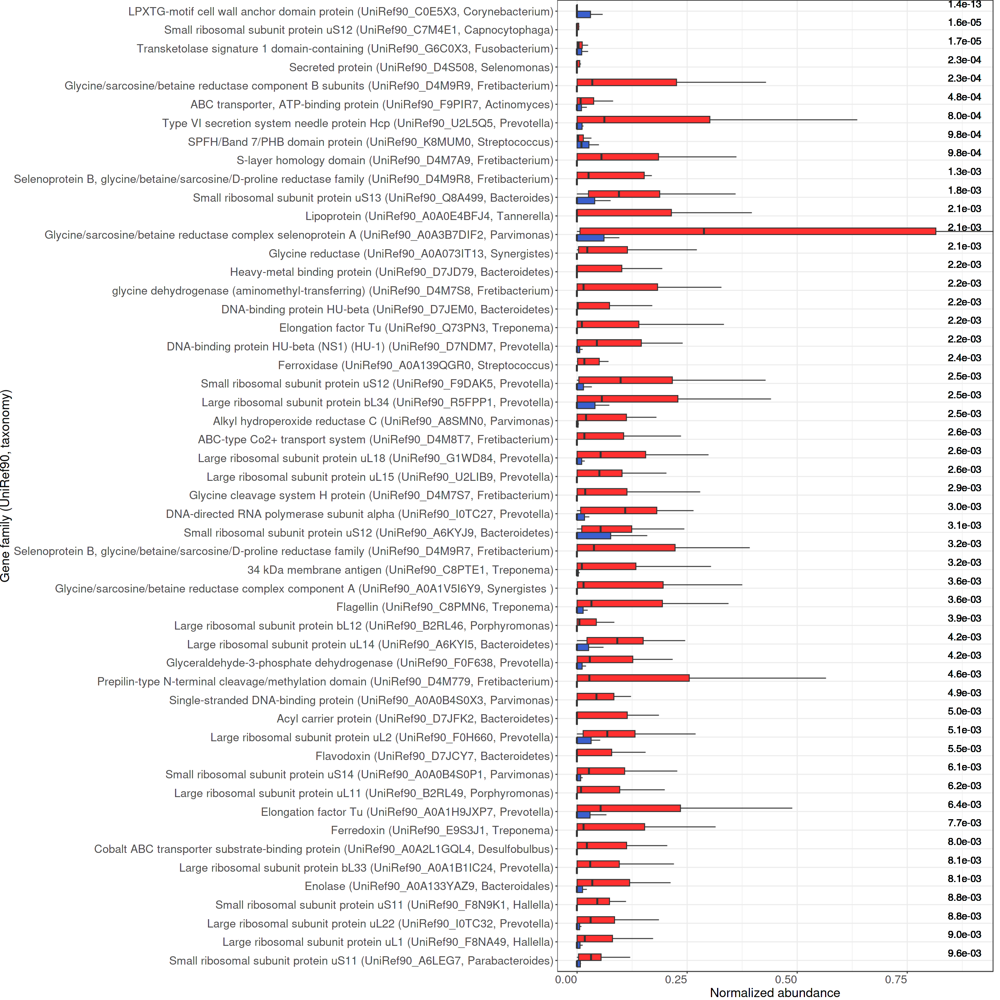

In [83]:
# Create the plot with inverted coordinates

# Set the plot size options
options(
  repr.plot.width = 20,   # Set the width of the plot
  repr.plot.height = 20    # Set the height of the plot
)

p <- ggplot(merged_data2, aes(x = reorder(Gene, -qval_all), y = Abundance, fill = Condition)) +
  geom_boxplot(position = position_dodge(width = 0.7), width = 0.7, outlier.shape = NA) +
  xlab("Gene family (UniRef90, taxonomy)") +
  ylab("Normalized abundance") +
  theme_bw() +
  theme(
    axis.text.y = element_text(size = 16),   # Adjust y-axis label size
    axis.text.x = element_text(hjust = 1, size = 16),   # Adjust x-axis label size
    axis.title = element_text(size = 18),   # Adjust axis title size
    legend.text = element_text(size = 16),   # Adjust legend text size
    legend.title = element_text(size = 16),   # Adjust legend title size
    legend.margin = margin(10, 10, 10, 10),   # Adjust legend margin
    plot.margin = margin(2, 2, 2, 2),   # Adjust plot margin
    legend.position = "none"  # Remove legend
  ) +
  coord_flip(ylim = c(0, 0.9)) + # Invert the plot +
  scale_fill_manual(values = c("royalblue3", "firebrick1"))  # Set fill colors using the custom palette

# Add q-values for the Periodontitis condition and format in scientific notation
p <- p + geom_text(data = merged_data2[merged_data2$Condition == "Periodontitis", ],
                   aes(x = Gene, y = 0.88, label = format(qval_all, scientific = TRUE, digits = 2)),
                   vjust = -0.5, hjust = 0.5, size = 5)


# Adjust the margins to accommodate the long x-axis tick labels
p <- p + theme(plot.margin = margin(0, 10, 0, 0))

# Save the plot as an image
#ggsave("gene_families.png", p, width = 20, height = 20, units = "in", dpi = 300)

# Display the plot
print(p)

In [88]:
#this is done to be able to reorder the species based on the qval_all
all_data2=all_data
all_data2$Gene=rownames(all_data2)
df_long <- filtered_data_long %>% left_join(all_data2, by = "Gene")
df_long

Gene,External_ID,Abundance,Belstrom_2021,Duran_Pinedo_2014,Jorth_2014,Yost_2015,qval_all
<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UniRef90_C0E5X3,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,1.413038e-13
UniRef90_C7M4E1,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,1.576279e-05
UniRef90_G6C0X3,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,1.673203e-05
UniRef90_D4M9R9,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,2.329052e-04
UniRef90_D4S508,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,2.329052e-04
UniRef90_F9PIR7,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,4.786955e-04
UniRef90_U2L5Q5,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,7.976159e-04
UniRef90_D4M7A9,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,9.813757e-04
UniRef90_E8JUY6,Metatranscriptome_Healthy1,0,NA,NA,NA,NA,9.813757e-04


In [86]:
all_data2=all_data
all_data2$Gene=rownames(all_data2)

In [87]:
df_long <- df_long %>% left_join(all_data2, by = "Gene")


ERROR: Error in left_join(., all_data2, by = "Gene"): object 'df_long' not found
